In [1]:
using Arpack
using LinearAlgebra
using LaTeXStrings
using Revise
# ENV["MPLCONFIG"] = "matplotlibrc"
using PyPlot
using MeshGrid
using JLD2
using Statistics
PyPlot.matplotlib.rcParams["ghostscript"] = "gs"
# ENV["PATH"] = "/Library/TeX/texbin:" * ENV["PATH"]

"gs"

In [2]:
PyPlot.matplotlib.rcParams["figure.figsize"]

2-element Vector{Float64}:
 3.375
 2.5

In [3]:
rc("text", usetex=true)
rc("font", family="serif", size=14)
rc("text.latex",
   preamble="""
   \\usepackage{bm}
   \\renewcommand{\\v}[1]{\\bm{#1}}
   """)

# Helper functions

In [4]:
function hex_outline(center, radius, spacing)
    cx, cy = center
    # Compute the 6 corners of the hexagon
    corners = [(cx + radius * cos(theta), cy + radius * sin(theta)) for theta in 0:pi/3:5pi/3]

    # Generate points along the 6 edges (including corners)
    frame_points = Set(corners)  # Use a Set to avoid duplicate corner points

    for i in 1:6
        p1 = corners[i]
        p2 = corners[mod1(i+1, 6)]  # Next corner (modulo 6)
        edge_vector = (p2[1] - p1[1], p2[2] - p1[2])
        edge_length = sqrt(edge_vector[1]^2 + edge_vector[2]^2)
        n_segments = max(1, round(Int, edge_length / spacing))

        for j in 1:(n_segments-1)
            t = j / n_segments
            px = (1 - t) * p1[1] + t * p2[1]
            py = (1 - t) * p1[2] + t * p2[2]
            push!(frame_points, (px, py))
        end
    end
    temp = collect(frame_points)
    
    grid = Array{Float64}(undef, size(temp, 1), 2)
    for j in 1:size(temp, 1)
        grid[j, 1] = temp[j][1]
        grid[j, 2] = temp[j][2]
    end
    return grid
end
function mesh_grid(list1, list2, type)
    l1 = length(list1)
    l2 = length(list2)
    grid = Array{type}(undef, l1 * l2, 2)
    for j in 1:l1
        grid[1 + (j-1)*l2:j*l2, 1] = ones(l2) * list1[j]
        grid[1 + (j-1)*l2:j*l2, 2] = list2
    end
    return grid
end
function H_k_v2(k_m, vF)
    n1 = [cos(0), sin(0)]
    n3 = [cos(2 * pi / 3), sin(2 * pi / 3)]
    n5 = [cos(4 * pi / 3), sin(4 * pi / 3)]
    k = vF * k_m
    return [dot(k, n1) 0 0; 0 dot(k, n3) 0; 0 0 dot(k, n5)]
end
function H_k(q, theta, vF)
    n1 = [cos(0), sin(0)]
    n3 = [cos(2 * pi / 3), sin(2 * pi / 3)]
    n5 = [cos(4 * pi / 3), sin(4 * pi / 3)]
    k = vF * q * [cos(theta), sin(theta)]
    return [dot(k, n1) 0 0; 0 dot(k, n3) 0; 0 0 dot(k, n5)]
end
function H_mft_v2(k, delt, alph)
    # useful phase
    omega = exp(2*pi/3 * im)
    mat0 = [0 delt conj(delt); 
            conj(delt) 0 delt; 
            delt conj(delt) 0]
    qq = k[1] + im * k[2]
    mat1 = [0 alph * (omega * qq + conj(omega) * conj(qq)) conj(alph) * (conj(omega) * qq + omega * conj(qq));
             conj(alph) * (omega * qq + conj(omega) * conj(qq)) 0 alph * (qq + conj(qq));
             alph * (conj(omega) * qq + omega * conj(qq)) conj(alph) * (qq + conj(qq)) 0]
    return mat0 + 1/2 * mat1
end
function H_mft(q, theta, delt, alph)
    # useful phase
    omega = exp(2*pi/3 * im)
    mat0 = [0 delt conj(delt); 
            conj(delt) 0 delt; 
            delt conj(delt) 0]
    qq = q * exp(theta * im)
    mat1 = [0 alph * (omega * qq + conj(omega) * conj(qq)) conj(alph) * (conj(omega) * qq + omega * conj(qq));
             conj(alph) * (omega * qq + conj(omega) * conj(qq)) 0 alph * (qq + conj(qq));
             alph * (conj(omega) * qq + omega * conj(qq)) conj(alph) * (qq + conj(qq)) 0]
    return mat0 + 1/2 * mat1
end
function bc_no_spinors(points, spacing, vF, delt, alph, index)
    berry_list = Array{Float64}(undef, size(points)[1])
    for i in 1:size(points)[1]
        # get flux through plaquette centered at point
        num_vertices = 4
        states = Array{ComplexF64}(undef, num_vertices, 3)
        x0 = points[i, 1]
        y0 = points[i, 2]
        for j in 1:num_vertices
            x_new = x0 + spacing * cos(2 * pi * (j - 1) / num_vertices)
            y_new = y0 + spacing * sin(2 * pi * (j - 1) / num_vertices)
            momentum = norm([x_new, y_new])
            theta = polar_angle(x_new, y_new)
            ham = H_mft(momentum, theta, delt, alph) + H_k(momentum, theta, vF)
            gs = eigvecs(Hermitian(ham))[:, index]
            states[j, :] = gauge_fix(normalize(gs))
        end
        P = 1
        for j in 1:num_vertices
            if j < num_vertices
                temp = dot(states[j, :], states[j + 1, :])
                P *= temp
            else
                temp = dot(states[j, :], states[1, :])
                P *= temp
            end
            if temp != 0
                P /= abs(temp)
            end
        end
        if abs(imag(P)) < 10^(-16)
            berry_list[i] = -(angle(real(P))) / (area(spacing * sqrt(2), num_vertices))
        else
            berry_list[i] = -angle(P) / area(spacing * sqrt(2), num_vertices)
        end
    end
    return berry_list
end
function polar_angle(x, y)
    ang = 0
    if x == 0 && y == 0
        ang = 0
    elseif x < 0
        ang = atan(y/x) + pi
    else
        ang = atan(y/x)
    end
    if ang < 0
        ang += 2 * pi
    end
    return ang
end
function gauge_fix(state)
    entry = state[1]
    phi = angle(entry / abs(entry))
    state = state .* exp(-im * phi)
    return state
end
function area(s, N)
    return (1/4) * N * s^2 * cot(pi/N)
end
function lambda_delta(kappa, lambda, v1, v2)
    omega = exp(im * 2 * pi/3)
    delta = (v1 + v2 * omega * lambda^2 * kappa^2)/(1 + lambda^2 * kappa^2)
    return delta
end
function lambda_alpha(kappa, lambda, v1, v2)
    omega = exp(im * 2 * pi/3)
    phase = exp(im * pi/6)
    alpha = (kappa * lambda^2 / (2 * (1 + lambda^2 * kappa^2)^2)) * (2*v1 + v2 * (4*conj(omega) - 2*sqrt(3)*phase*kappa^2*lambda^2))
    return alpha
end
function anal_lambda_spinor_bc(lambda, k)
    kx, ky = k
    return -2 * lambda^2 / (1 + lambda^2 * (kx^2 + ky^2))^2
end
function vF_analytic_eigenvalues(alpha, delta, x, y, vF)
    v = vF
    B = 3 * (x^2 + y^2) * (v^2 + 2 * abs2(alpha)) + 3 * abs2(delta)
    C = (2 * x * (v^3 - 3 * v * abs2(alpha) + 2 * real(alpha^3)) * (x^2 - 3 * y^2) - 
    6 * (x^2 + y^2) * real(delta * alpha^2 + 2 * v * alpha * conj(delta)) + 2 * real(delta^3))
    epsilons = Array{Float64}(undef, 3)
    epsilons[3] = 2 * sqrt(B/3) * cos(1/3 * acos(3*C / (2 * B) * sqrt(3/B)) - 0*2 * pi/3)
    epsilons[2] = 2 * sqrt(B/3) * cos(1/3 * acos(3*C / (2 * B) * sqrt(3/B)) - 1*2 * pi/3)
    epsilons[1] = 2 * sqrt(B/3) * cos(1/3 * acos(3*C / (2 * B) * sqrt(3/B)) - 2*2 * pi/3)
    return real.(sort(epsilons))
end
function lambda_spinor(lambda, k)
    kx, ky = k
    vec = Array{ComplexF64}(undef, 2)
    nmz = sqrt(1 + lambda^2 * (kx^2 + ky^2))
    vec[1] = 1/nmz
    vec[2] = lambda * (kx + im * ky)/nmz
    return vec
end
function lambda_patch_bc(points, spacing, lambda, kappa, vF, delt, alph, index)
    berry_list = Array{Float64}(undef, size(points)[1])
    for i in 1:size(points)[1]
        # get flux through plaquette centered at point
        num_vertices = 4
        spinors = Array{ComplexF64}(undef, num_vertices, 3, 2)
        grounds = Array{ComplexF64}(undef, num_vertices, 3)
        x0 = points[i, 1]
        y0 = points[i, 2]
        for j in 1:num_vertices
            x_new = x0 + spacing * cos(2 * pi * (j - 1) / num_vertices)
            y_new = y0 + spacing * sin(2 * pi * (j - 1) / num_vertices)
            ham = H_mft_v2([x_new, y_new], delt, alph) + H_k_v2([x_new, y_new], vF)
            grounds[j, :] = gauge_fix(normalize(eigvecs(Hermitian(ham))[:, index]))
            for m in 1:3
                kappa_pt = [kappa * cos(2*pi/3 * (m - 1)), kappa * sin(2*pi/3 * (m - 1))] + [x_new, y_new]
                sor = lambda_spinor(lambda, kappa_pt)
                spinors[j, m, :] = sor
            end
        end
        P = 1
        for j in 1:num_vertices
            if j < num_vertices
                temp = spinor_inner(grounds[j, :], grounds[j + 1, :], spinors[j, :, :], spinors[j + 1, :, :])
                P *= temp / abs(temp)
            else
                temp = spinor_inner(grounds[j, :], grounds[1, :], spinors[j, :, :], spinors[1, :, :])
                P *= temp / abs(temp)
            end
        end
        if abs(imag(P)) < 10^(-16)
            berry_list[i] = -(angle(real(P))) / area(spacing * sqrt(2), num_vertices)
        else
            berry_list[i] = -angle(P) / area(spacing * sqrt(2), num_vertices)
        end
    end
    return berry_list
end 
function spinor_inner(C1, C2, q1_spinor, q2_spinor)
    val = 0
    n1 = 0
    n2 = 0
    for m in 1:length(C1)
        val += conj(C1[m]) * C2[m] * dot(q1_spinor[m, :], q2_spinor[m, :])
        n1 += conj(C1[m]) * C1[m] * dot(q1_spinor[m, :], q1_spinor[m, :])
        n2 += conj(C2[m]) * C2[m] * dot(q2_spinor[m, :], q2_spinor[m, :])
    end
    return val / sqrt(n1 * n2)
end
function num_mBZ(shells)
    return 1 + 3 * shells * (shells + 1)
end
function sgn_parts(n)
    pairs = []
    for a in -n:n
        for b in -n:n
            if -n <= a + b <= n
                push!(pairs, (a, b))
            end
        end
    end
    return pairs
end
function part_dict(shells)
    dict = Dict{NTuple{2,Int}, Int}()
    parts = sgn_parts(shells)
    for j in 1:length(parts)
        dict[parts[j]] = j
    end
    return dict
end
function lambda_ff(V, lambda, k1, k2)
    psi1 = lambda_spinor(lambda, k1)
    psi2 = lambda_spinor(lambda, k2)
    return dot(psi1, V * psi2)
end

lambda_ff (generic function with 1 method)

# mBZ schematic

In [5]:
function mBZ_plotter(kappa)
    fig, axs = plt.subplots(1,1,figsize=(8, 8))
    gca().set_frame_on(false)
    axs.set_aspect("equal")
    hex1 = hex_outline([0, 0], kappa, 10^(-3))
    axs.scatter(hex1[:, 1], hex1[:, 2], s = 1.5, alpha=0.9, c="k", linestyle="-", marker="o")
    axs.set_xticks([])
    axs.set_yticks([])

    s = 500
    fsize = 40
    vec_fsize = 40
    # set kappa points
    kappa_list = [L"$\v{\kappa}_{1}$", L"$\v{\kappa}_{3}$", L"$\v{\kappa}_{5}$"]

    # kappa_1
    x1 = kappa * cos(2*pi/3 * 0)
    y1 = kappa * sin(2*pi/3 * 0)
    axs.scatter(x1, y1, s = s, alpha=1, c="firebrick", linestyle="-", marker="^")
    axs.text(x1 + 0.1, y1 - 0.03, kappa_list[1], fontsize=fsize, color="firebrick")

    # kappa_3
    x3 = kappa * cos(2*pi/3 * 1)
    y3 = kappa * sin(2*pi/3 * 1)
    axs.scatter(x3, y3, s = s, alpha=1, c="firebrick", linestyle="-", marker="^")
    axs.text(x3 - 0.27, y3 - 0.03, kappa_list[2], fontsize=fsize, color="firebrick")

    # kappa_5
    x5 = kappa * cos(2*pi/3 * 2)
    y5 = kappa * sin(2*pi/3 * 2)
    axs.scatter(x5, y5, s = s, alpha=1, c="firebrick", linestyle="-", marker="^")
    axs.text(x5 - 0.27, y5 - 0.03, kappa_list[3], fontsize=fsize, color="firebrick")

    # set kappa' points
    kappa_p_list = [L"$\v{\kappa}_{2}$", L"$\v{\kappa}_{4}$", L"$\v{\kappa}_{6}$"]
    
    # kappa_2
    x2 = kappa * cos(pi/3 + 2*pi/3 * 0)
    y2 = kappa * sin(pi/3 + 2*pi/3 * 0)
    axs.scatter(x2, y2, s = s, alpha=1, c="royalblue", linestyle="-", marker="s")
    axs.text(x2 + 0.1, y2 - 0.03, kappa_p_list[1], fontsize=fsize, color="royalblue")

    x4 = kappa * cos(pi/3 + 2*pi/3 * 1)
    y4 = kappa * sin(pi/3 + 2*pi/3 * 1)
    axs.scatter(x4, y4, s = s, alpha=1, c="royalblue", linestyle="-", marker="s")
    axs.text(x4 - 0.27, y4 - 0.03, kappa_p_list[2], fontsize=fsize, color="royalblue")

    x6 = kappa * cos(pi/3 + 2*pi/3 * 2)
    y6 = kappa * sin(pi/3 + 2*pi/3 * 2)
    axs.scatter(x6, y6, s = s, alpha=1, c="royalblue", linestyle="-", marker="s")
    axs.text(x6 + 0.1, y6 - 0.03, kappa_p_list[3], fontsize=fsize, color="royalblue")


    # set gamma point
    axs.scatter(0, 0, s = 1000, alpha=1, c="forestgreen", linestyle="-", marker=".")
    axs.text(0 - 0.05, 0.13, L"$\v{\gamma}$", fontsize=fsize, color="forestgreen")

    g1_ray = [kappa * cos(0*2*pi/3), kappa*sin(0*2*pi/3)] - [kappa * cos(2*pi/3), kappa*sin(2*pi/3)]
    g1_start = 1 * [kappa * cos(2*pi/3), kappa*sin(2*pi/3)] + 0.08*g1_ray
    g1_delta = 0.75 * g1_ray

    axs.arrow(g1_start[1], g1_start[2], g1_delta[1], g1_delta[2], head_width=0.07, head_length=0.07, linewidth=3,
    linestyle="-", fc="k", ec="k")

    g1_axs_coord = g1_start + 0.5 * g1_delta + [0, -0.19]

    axs.text(g1_axs_coord[1], g1_axs_coord[2], L"$\v{g}_1$", fontsize=vec_fsize, color="k")


    g3_ray = [kappa * cos(2*2*pi/3), kappa*sin(2*2*pi/3)] - [kappa * cos(0*2*pi/3), kappa*sin(0*2*pi/3)]
    g3_start = 1 * [kappa * cos(0*2*pi/3), kappa*sin(0*2*pi/3)] + 0.12*g3_ray
    g3_delta = 0.78 * g3_ray

    axs.arrow(g3_start[1], g3_start[2], g3_delta[1], g3_delta[2], head_width=0.07, head_length=0.07, linewidth=3,
    linestyle="-", fc="k", ec="k")


    g3_axs_coord = g3_start + 0.5 * g3_delta + [-0.06, 0.1]

    axs.text(g3_axs_coord[1], g3_axs_coord[2], L"$\v{g}_3$", fontsize=vec_fsize, color="k")

    g2_ray = [kappa * cos(1*2*pi/3), kappa*sin(1*2*pi/3)] - [kappa * cos(2*2*pi/3), kappa*sin(2*2*pi/3)]
    g2_start = 1 * [kappa * cos(2*2*pi/3), kappa*sin(2*2*pi/3)] + 0.07*g2_ray
    g2_delta = 0.82 * g2_ray

    axs.arrow(g2_start[1], g2_start[2], g2_delta[1], g2_delta[2], head_width=0.07, head_length=0.07, linewidth=3,
    linestyle="-", fc="k", ec="k")
    
    g2_axs_coord = g2_start + 0.5 * g2_delta + [0.04, 0]

    axs.text(g2_axs_coord[1], g2_axs_coord[2], L"$\v{g}_2$", fontsize=vec_fsize, color="k")


    fig.tight_layout()

    fig.savefig("figs/mBZ.png", bbox_inches="tight")
    fig
end

mBZ_plotter (generic function with 1 method)

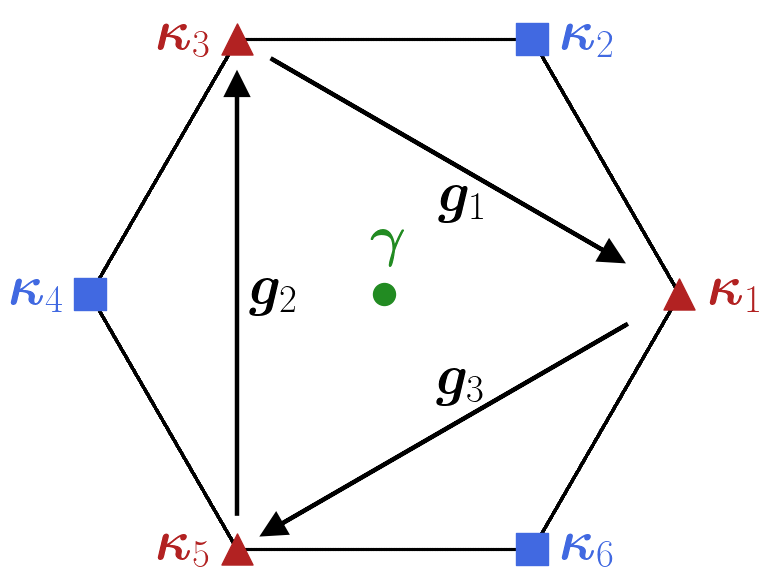

In [6]:
kappa = 1
mBZ_plotter(kappa)

# Sign plots

In [5]:
function approx_sign(x; tol=1e-13)
    if x > tol
        return 1
    elseif x < -tol
        return -1
    else
        return 0
    end
end
function explicit_og_bc_vF(delta, alpha, index, vF)
    omega = exp(im * 2 * pi/ 3)
    k = index - 1
    v = vF
    
    nmz = 16 * real(omega^k * delta)^4 + 3 * abs(delta)^4 + 8 * real(delta^3) * real(omega^k * delta)
    
    return ((8 * sqrt(3) / nmz^2) * (8 * v * real(omega^k * delta)^3 - 12 * real(alpha * conj(delta)) * real(omega^k * delta)^2 + 
    3 * abs2(delta) * real(alpha * conj(delta)) + v * real(delta^3)) * (4 * real(omega^k * delta)^2 * imag(alpha * conj(delta)) + 
    4 * real(omega^k * delta) * imag(alpha * delta^2) - v * imag(delta^3) + abs2(delta) * imag(alpha * conj(delta))))
    
end
function wrap_angle(ang)
    return mod(ang + pi, 2pi) - pi
end
function branch1_theta(vF, a, phi, k)
    # return wrap_angle((phi + acos(vF/a * (cos(3*phi) + 2 * cos(phi + 2*pi*k/3)) / (1 + 2 * cos(2*phi + 4 * pi * k / 3)))))
    return wrap_angle(phi + acos(vF/a * cos(phi + 2 * pi * k/3 )))
end
function branch2_roots(vF, a, varphi, k, n)
    theta = wrap_angle(varphi - 2*pi/3 * k)
    phi = wrap_angle(n*pi + atan(3 * sin(varphi) / (vF/a - cos(varphi))) + pi/3 * k)
    return [phi, theta]
end
function plot_sign_bound_v3()
    ion()
    fig, axs = plt.subplots(1,4,figsize=(32, 32))
    ticks = [-1, -2/3, -1/3, 0, 1/3, 2/3, 1]
    labels = [L"$-\pi$", L"$-\frac{2 \pi}{3}$", L"$- \frac{\pi}{3}$", L"$0$", L"$ \frac{\pi}{3}$", L"$\frac{2 \pi}{3}$", L"$\pi$"]
    for j in 1:4
        axs[j].tick_params(axis="both", which="major", direction="out", length=12, width=3) 
        axs[j].set_xlabel(L"$\arg(\Delta)$", fontsize = 50)
        axs[j].set_ylabel(L"$\arg(\alpha)$", fontsize = 50)
        axs[j].set_xticks(ticks, labels=labels, fontsize=40)
        axs[j].set_yticks(ticks, labels=labels, fontsize=40)
        axs[j].set_aspect("equal")
        for spine in axs[j].spines.values()
            spine.set_linewidth(3)
        end
    end

    omega = exp(im * 2 * pi / 3)
    
    a = 1
    vF_values = [0, 2, 4]

    for p in 1:3
        vF = vF_values[p]

        n_pts = 10^4
        varphi_list = range(-pi, pi, n_pts)

        branch_2_roots_1_phi = []
        branch_2_roots_1_theta = []
        branch_2_roots_2_phi = []
        branch_2_roots_2_theta = []
        branch_2_roots_3_phi = []
        branch_2_roots_3_theta = []
        branch_1_roots = Array{Float64}(undef, 3, 2, n_pts)

        for j in 1:n_pts
            varphi = varphi_list[j]

            phim1 = wrap_angle(varphi - pi)
            phi0 = wrap_angle(varphi)
            phip1 = wrap_angle(varphi + pi)

            # Branch 1 roots first
            if 0 < phim1 && phim1 <= 2*pi/3
                km1 = 1
            elseif 2*pi/3 < phim1 || phim1 <= -2*pi/3
                km1 = 0
            elseif phim1 > -2*pi/3 && phim1 <= 0
                km1 = 2
            end

            if 0 < phi0 && phi0 <= 2*pi/3
                k0 = 1
            elseif 2*pi/3 < phi0 || phi0 <= -2*pi/3
                k0 = 0
            elseif phi0 > -2*pi/3 && phi0 <= 0
                k0 = 2
            end

            if 0 < phip1 && phip1 <= 2*pi/3
                kp1 = 1
            elseif 2*pi/3 < phip1 || phip1 <= -2*pi/3
                kp1 = 0
            elseif phip1 > -2*pi/3 && phip1 <= 0
                kp1 = 2
            end

            try
                branch_1_roots[1, 1, j] = phim1
                branch_1_roots[1, 2, j] = branch1_theta(vF, a, varphi_list[j], km1)
            catch e
                branch_1_roots[1, 1, j] = NaN
                branch_1_roots[1, 2, j] = NaN
            end
            try
                branch_1_roots[2, 1, j] = phi0
                branch_1_roots[2, 2, j] = branch1_theta(vF, a, varphi_list[j], k0)
            catch e
                branch_1_roots[2, 1, j] = NaN
                branch_1_roots[2, 2, j] = NaN
            end
            try
                branch_1_roots[3, 1, j] = phip1
                branch_1_roots[3, 2, j] = branch1_theta(vF, a, varphi_list[j], kp1)
            catch e
                branch_1_roots[3, 1, j] = NaN
                branch_1_roots[3, 2, j] = NaN
            end


            # Branch 2 roots
            roots_b2_temp = Array{Float64}(undef, 3, 2)
            roots_b2_temp[1, :] = branch2_roots(vF, a, varphi, 0, -1)
            roots_b2_temp[2, :] = branch2_roots(vF, a, varphi, 1, -1)
            roots_b2_temp[3, :] = branch2_roots(vF, a, varphi, 2, -1)

            for i in 1:3
                phi = roots_b2_temp[i, 1]
                if 0 < phi && phi <= 2*pi/3
                    k = 1
                elseif 2*pi/3 < phi || phi <= -2*pi/3
                    k = 0
                elseif phi > -2*pi/3 && phi <= 0
                    k = 2
                end
                if k == i - 1
                    push!(branch_2_roots_1_phi, roots_b2_temp[i, 1])
                    push!(branch_2_roots_1_theta, roots_b2_temp[i, 2])
                end
            end

            roots_b2_temp = Array{Float64}(undef, 3, 2)
            roots_b2_temp[1, :] = branch2_roots(vF, a, varphi, 0, 0)
            roots_b2_temp[2, :] = branch2_roots(vF, a, varphi, 1, 0)
            roots_b2_temp[3, :] = branch2_roots(vF, a, varphi, 2, 0)

            for i in 1:3
                phi = roots_b2_temp[i, 1]
                if 0 < phi && phi <= 2*pi/3
                    k = 1
                elseif 2*pi/3 < phi || phi <= -2*pi/3
                    k = 0
                elseif phi > -2*pi/3 && phi <= 0
                    k = 2
                end
                if k == i - 1
                    push!(branch_2_roots_2_phi, roots_b2_temp[i, 1])
                    push!(branch_2_roots_2_theta, roots_b2_temp[i, 2])
                end
            end
            

            roots_b2_temp = Array{Float64}(undef, 3, 2)
            roots_b2_temp[1, :] = branch2_roots(vF, a, varphi, 0, 1)
            roots_b2_temp[2, :] = branch2_roots(vF, a, varphi, 1, 1)
            roots_b2_temp[3, :] = branch2_roots(vF, a, varphi, 2, 1)

            for i in 1:3
                phi = roots_b2_temp[i, 1]
                if 0 < phi && phi <= 2*pi/3
                    k = 1
                elseif 2*pi/3 < phi || phi <= -2*pi/3
                    k = 0
                elseif phi > -2*pi/3 && phi <= 0
                    k = 2
                end
                if k == i - 1
                    push!(branch_2_roots_3_phi, roots_b2_temp[i, 1])
                    push!(branch_2_roots_3_theta, roots_b2_temp[i, 2])
                end
            end

        
        end
        

        for j in 1:size(branch_1_roots, 1)
            axs[p].scatter(1/pi .* branch_1_roots[j, 1, :], 1/pi .* branch_1_roots[j, 2, :], c="k", linestyle="-", marker="o", s=3)
        end

        b2_roots_1 = Array{Float64}(undef, 2, size(branch_2_roots_1_phi, 1))
        b2_roots_1[1, :] = branch_2_roots_1_phi
        b2_roots_1[2, :] = branch_2_roots_1_theta

        b2_roots_2 = Array{Float64}(undef, 2, size(branch_2_roots_2_phi, 1))
        b2_roots_2[1, :] = branch_2_roots_2_phi
        b2_roots_2[2, :] = branch_2_roots_2_theta

        b2_roots_3 = Array{Float64}(undef, 2, size(branch_2_roots_3_phi, 1))
        b2_roots_3[1, :] = branch_2_roots_3_phi
        b2_roots_3[2, :] = branch_2_roots_3_theta

    
        axs[p].scatter(1/pi * b2_roots_1[1, :], 1/pi * b2_roots_1[2, :], alpha=0.7, c="k", linestyle="-", marker="o", s=2)
        axs[p].scatter(1/pi * b2_roots_2[1, :], 1/pi * b2_roots_2[2, :], alpha=0.7, c="k", linestyle="-", marker="o", s=2)
        axs[p].scatter(1/pi * b2_roots_3[1, :], 1/pi * b2_roots_3[2, :], alpha=0.7, c="k", linestyle="-", marker="o", s=2)
        
        # vertical phase boundaries
        n_pts = 10^4
        phase_b1 = Array{Float64}(undef, 2, n_pts)
        phase_b1[2, :] = range(-1, 1, n_pts)
        phase_b1[1, :] = -2/3 * ones(n_pts)

        phase_b2 = Array{Float64}(undef, 2, n_pts)
        phase_b2[2, :] = range(-1, 1, n_pts)
        phase_b2[1, :] = zeros(n_pts)

        phase_b3 = Array{Float64}(undef, 2, n_pts)
        phase_b3[2, :] = range(-1, 1, n_pts)
        phase_b3[1, :] = 2/3 * ones(n_pts)

        axs[p].plot(phase_b1[1, :], phase_b1[2, :], alpha=1, c="k", linestyle="--", markersize=70, linewidth=3)
        axs[p].plot(phase_b2[1, :], phase_b2[2, :], alpha=1, c="k", linestyle="--", markersize=70, linewidth=3)
        axs[p].plot(phase_b3[1, :], phase_b3[2, :], alpha=1, c="k", linestyle="--", markersize=70, linewidth=3)


        # Plot Berry curvatures signs
        n_pts = 10^2
        angles = range(-0.99 * pi, 0.99 * pi, n_pts)
        grid = mesh_grid(angles, angles, Float64)

        pos_x = []
        pos_y = []

        neg_x = []
        neg_y = []

        zer_x = []
        zer_y = []

        for j in 1:n_pts*n_pts
            phi = grid[j, 1]
            delta = exp(im * phi)
            theta = grid[j, 2]
            alpha = exp(im * theta)
            phi = wrap_angle(angle(delta))
            if 0 < phi && phi < 2*pi/3
                k = 1
            elseif 2*pi/3 < phi || phi < -2*pi/3
                k = 0
            elseif phi > -2*pi/3 && phi < 0
                k = 2
            end
            # properly enforce
            bc = explicit_og_bc_vF(delta, alpha/2, k + 1, vF/2)
            bc_sgn = approx_sign(bc)
            if bc_sgn < 0
                push!(neg_x, 1/pi * grid[j, 1])
                push!(neg_y, 1/pi * grid[j, 2])
            elseif bc_sgn > 0
                push!(pos_x, 1/pi * grid[j, 1])
                push!(pos_y, 1/pi * grid[j, 2])
            else
                push!(zer_x, 1/pi * grid[j, 1])
                push!(zer_y, 1/pi * grid[j, 2])
            end
        end

        axs[p].scatter(pos_x, pos_y, alpha=0.3, c="b", linestyle="-", marker="h", s=9)
        axs[p].scatter(neg_x, neg_y, alpha=0.3, c="r", linestyle="-", marker="h", s=9)
    end

    n_pts = 10^4
    varphi_list = range(-0.999*pi, 0.999*pi, n_pts)
    
    # root_sets = Array{Float64}(undef, 6, 2, n_pts)
    branch_2_roots_1_phi = []
    branch_2_roots_1_theta = []

    branch_2_roots_2_phi = []
    branch_2_roots_2_theta = []

    branch_2_roots_3_phi = []
    branch_2_roots_3_theta = []

    branch_1_roots = Array{Float64}(undef, 3, 2, n_pts)
    for j in 1:n_pts
        varphi = varphi_list[j]

        phim1 = wrap_angle(varphi - pi)
        phi0 = wrap_angle(varphi)
        phip1 = wrap_angle(varphi + pi)

        # Branch 1 roots first
        if 0 < phim1 && phim1 <= 2*pi/3
            km1 = 1
        elseif 2*pi/3 < phim1 || phim1 <= -2*pi/3
            km1 = 0
        elseif phim1 > -2*pi/3 && phim1 <= 0
            km1 = 2
        end

        if 0 < phi0 && phi0 <= 2*pi/3
            k0 = 1
        elseif 2*pi/3 < phi0 || phi0 <= -2*pi/3
            k0 = 0
        elseif phi0 > -2*pi/3 && phi0 <= 0
            k0 = 2
        end

        if 0 < phip1 && phip1 <= 2*pi/3
            kp1 = 1
        elseif 2*pi/3 < phip1 || phip1 <= -2*pi/3
            kp1 = 0
        elseif phip1 > -2*pi/3 && phip1 <= 0
            kp1 = 2
        end

        try
            branch_1_roots[1, 1, j] = phim1
            branch_1_roots[1, 2, j] = branch1_theta(vF, a, varphi_list[j], km1)
        catch e
            branch_1_roots[1, 1, j] = NaN
            branch_1_roots[1, 2, j] = NaN
        end
        try
            branch_1_roots[2, 1, j] = phi0
            branch_1_roots[2, 2, j] = branch1_theta(vF, a, varphi_list[j], k0)
        catch e
            branch_1_roots[2, 1, j] = NaN
            branch_1_roots[2, 2, j] = NaN
        end
        try
            branch_1_roots[3, 1, j] = phip1
            branch_1_roots[3, 2, j] = branch1_theta(vF, a, varphi_list[j], kp1)
        catch e
            branch_1_roots[3, 1, j] = NaN
            branch_1_roots[3, 2, j] = NaN
        end


        # Branch 2 roots
        roots_b2_temp = Array{Float64}(undef, 3, 2)
        roots_b2_temp[1, :] = branch2_roots(vF, a, varphi, 0, -1)
        roots_b2_temp[2, :] = branch2_roots(vF, a, varphi, 1, -1)
        roots_b2_temp[3, :] = branch2_roots(vF, a, varphi, 2, -1)

        for i in 1:3
            phi = roots_b2_temp[i, 1]
            if 0 < phi && phi <= 2*pi/3
                k = 1
            elseif 2*pi/3 < phi || phi <= -2*pi/3
                k = 0
            elseif phi > -2*pi/3 && phi <= 0
                k = 2
            end
            if k == i - 1
                push!(branch_2_roots_1_phi, roots_b2_temp[i, 1])
                push!(branch_2_roots_1_theta, roots_b2_temp[i, 2])
            end
        end

        roots_b2_temp = Array{Float64}(undef, 3, 2)
        roots_b2_temp[1, :] = branch2_roots(vF, a, varphi, 0, 0)
        roots_b2_temp[2, :] = branch2_roots(vF, a, varphi, 1, 0)
        roots_b2_temp[3, :] = branch2_roots(vF, a, varphi, 2, 0)

        for i in 1:3
            phi = roots_b2_temp[i, 1]
            if 0 < phi && phi <= 2*pi/3
                k = 1
            elseif 2*pi/3 < phi || phi <= -2*pi/3
                k = 0
            elseif phi > -2*pi/3 && phi <= 0
                k = 2
            end
            if k == i - 1
                push!(branch_2_roots_2_phi, roots_b2_temp[i, 1])
                push!(branch_2_roots_2_theta, roots_b2_temp[i, 2])
            end
        end
        

        roots_b2_temp = Array{Float64}(undef, 3, 2)
        roots_b2_temp[1, :] = branch2_roots(vF, a, varphi, 0, 1)
        roots_b2_temp[2, :] = branch2_roots(vF, a, varphi, 1, 1)
        roots_b2_temp[3, :] = branch2_roots(vF, a, varphi, 2, 1)

        for i in 1:3
            phi = roots_b2_temp[i, 1]
            if 0 < phi && phi <= 2*pi/3
                k = 1
            elseif 2*pi/3 < phi || phi <= -2*pi/3
                k = 0
            elseif phi > -2*pi/3 && phi <= 0
                k = 2
            end
            if k == i - 1
                push!(branch_2_roots_3_phi, roots_b2_temp[i, 1])
                push!(branch_2_roots_3_theta, roots_b2_temp[i, 2])
            end
        end

       
    end

    # infinite case
    vF = 10^5
    n_pts = 10^4
    phase_b1 = Array{Float64}(undef, 2, n_pts)
    phase_b1[2, :] = range(-1, 1, n_pts)
    phase_b1[1, :] = -1/3 * ones(n_pts)

    phase_b2 = Array{Float64}(undef, 2, n_pts)
    phase_b2[2, :] = range(-1, 1, n_pts)
    phase_b2[1, :] = -1 * ones(n_pts)

    phase_b3 = Array{Float64}(undef, 2, n_pts)
    phase_b3[2, :] = range(-1, 1, n_pts)
    phase_b3[1, :] = 1 * ones(n_pts)

    phase_b4 = Array{Float64}(undef, 2, n_pts)
    phase_b4[2, :] = range(-1, 1, n_pts)
    phase_b4[1, :] = 1/3 * ones(n_pts)

    axs[4].scatter(phase_b1[1, :], phase_b1[2, :], alpha=0.7, c="k", linestyle="-", marker="o", s=2)
    axs[4].scatter(phase_b2[1, :], phase_b2[2, :], alpha=0.7, c="k", linestyle="-", marker="o", s=2)
    axs[4].scatter(phase_b3[1, :], phase_b3[2, :], alpha=0.7, c="k", linestyle="-", marker="o", s=2)
    axs[4].scatter(phase_b4[1, :], phase_b4[2, :], alpha=0.7, c="k", linestyle="-", marker="o", s=2)
    
    # vertical phase boundaries
    n_pts = 10^4
    phase_b1 = Array{Float64}(undef, 2, n_pts)
    phase_b1[2, :] = range(-1, 1, n_pts)
    phase_b1[1, :] = -2/3 * ones(n_pts)

    phase_b2 = Array{Float64}(undef, 2, n_pts)
    phase_b2[2, :] = range(-1, 1, n_pts)
    phase_b2[1, :] = zeros(n_pts)

    phase_b3 = Array{Float64}(undef, 2, n_pts)
    phase_b3[2, :] = range(-1, 1, n_pts)
    phase_b3[1, :] = 2/3 * ones(n_pts)

    axs[4].plot(phase_b1[1, :], phase_b1[2, :], alpha=1, c="k", linestyle="--", markersize=70, linewidth=3)
    axs[4].plot(phase_b2[1, :], phase_b2[2, :], alpha=1, c="k", linestyle="--", markersize=70, linewidth=3)
    axs[4].plot(phase_b3[1, :], phase_b3[2, :], alpha=1, c="k", linestyle="--", markersize=70, linewidth=3)


    # Plot Berry curvatures signs
    n_pts = 10^2
    angles = range(-0.99 * pi, 0.99 * pi, n_pts)
    grid = mesh_grid(angles, angles, Float64)

    pos_x = []
    pos_y = []

    neg_x = []
    neg_y = []

    zer_x = []
    zer_y = []

    for j in 1:n_pts*n_pts
        phi = grid[j, 1]
        delta = exp(im * phi)
        theta = grid[j, 2]
        alpha = exp(im * theta)
        phi = wrap_angle(angle(delta))
        if 0 < phi && phi < 2*pi/3
            k = 1
        elseif 2*pi/3 < phi || phi < -2*pi/3
            k = 0
        elseif phi > -2*pi/3 && phi < 0
            k = 2
        end
        # properly enforce
        bc = explicit_og_bc_vF(delta, alpha/2, k + 1, vF/2)
        bc_sgn = approx_sign(bc)
        if bc_sgn < 0
            push!(neg_x, 1/pi * grid[j, 1])
            push!(neg_y, 1/pi * grid[j, 2])
        elseif bc_sgn > 0
            push!(pos_x, 1/pi * grid[j, 1])
            push!(pos_y, 1/pi * grid[j, 2])
        else
            push!(zer_x, 1/pi * grid[j, 1])
            push!(zer_y, 1/pi * grid[j, 2])
        end
    end

    axs[4].scatter(pos_x, pos_y, alpha=0.3, c="b", linestyle="-", marker="h", s=9)
    axs[4].scatter(neg_x, neg_y, alpha=0.3, c="r", linestyle="-", marker="h", s=9)

    axs[1].set_title(L"$v_F/|\alpha| = 0$", fontsize=50, pad=30)
    axs[2].set_title(L"$v_F/|\alpha| = 2$", fontsize=50, pad=30)
    axs[3].set_title(L"$v_F/|\alpha| = 4$", fontsize=50, pad=30)
    axs[4].set_title(L"$v_F/|\alpha| = 10^5$", fontsize=50, pad=30)

    for j in 1:4
        axs[j].margins(0)
    end

    fig.text(-0.33, 1, L"$\textbf{(a)}$", transform=axs[1].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.33, 1, L"$\textbf{(b)}$", transform=axs[2].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.33, 1, L"$\textbf{(c)}$", transform=axs[3].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.33, 1, L"$\textbf{(d)}$", transform=axs[4].transAxes, ha="left", va="top", fontsize=50, color="k")

    fig.tight_layout()

    fig.savefig("figs/sign_plot.png", bbox_inches="tight")
    fig
end

plot_sign_bound_v3 (generic function with 1 method)

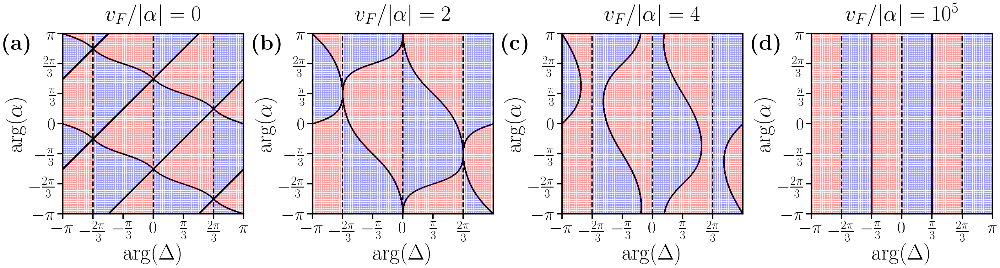

In [208]:
plot_sign_bound_v3()

In [80]:
function plot_sign_bound_C3()
    ion()
    fig, axs = plt.subplots(1,1,figsize=(8, 8))
    ticks = [-1, -2/3, -1/3, 0, 1/3, 2/3, 1]
    labels = [L"$-\pi$", L"$-\frac{2 \pi}{3}$", L"$- \frac{\pi}{3}$", L"$0$", L"$ \frac{\pi}{3}$", L"$\frac{2 \pi}{3}$", L"$\pi$"]
    axs.tick_params(axis="both", which="major", direction="out", length=12, width=3) 
    axs.set_xlabel(L"$\arg(\Delta)$", fontsize = 50)
    axs.set_ylabel(L"$\arg(\alpha)$", fontsize = 50)
    axs.set_xticks(ticks, labels=labels, fontsize=40)
    axs.set_yticks(ticks, labels=labels, fontsize=40)
    axs.set_aspect("equal")
    for spine in axs.spines.values()
        spine.set_linewidth(3)
    end

    omega = exp(im * 2 * pi / 3)
    
    a = 1
    vF = 10^-2


    # Plot Berry curvatures signs
    n_pts = 120
    angles = range(-pi, pi, n_pts)
    grid = mesh_grid(angles, angles, Float64)

    pos_x = []
    pos_y = []

    neg_x = []
    neg_y = []

    zer_x = []
    zer_y = []

    for j in 1:n_pts*n_pts
        phi = grid[j, 1]
        delta = exp(im * phi)
        theta = grid[j, 2]
        alpha = exp(im * theta)

        low_lim = 4*abs(delta)/vF
        up_lim = abs(delta) / abs(alpha)
        mom_rad = (low_lim + up_lim)/2
        point = reshape(mom_rad * [1, 1], (1, 2))

        bc = bc_no_spinors(point, 10^(-3), vF, delta, alpha, 1)[1]
        bc_sgn = approx_sign(bc)
        if bc_sgn < 0
            push!(neg_x, 1/pi * grid[j, 1])
            push!(neg_y, 1/pi * grid[j, 2])
        elseif bc_sgn > 0
            push!(pos_x, 1/pi * grid[j, 1])
            push!(pos_y, 1/pi * grid[j, 2])
        else
            push!(zer_x, 1/pi * grid[j, 1])
            push!(zer_y, 1/pi * grid[j, 2])
        end
    end

    axs.scatter(pos_x, pos_y, alpha=0.3, c="b", linestyle="-", marker="h", s=9)
    axs.scatter(neg_x, neg_y, alpha=0.3, c="r", linestyle="-", marker="h", s=9)


    # Phase boundaries
    n_pts = 10^4

    phase_b1 = Array{Float64}(undef, 2, n_pts)
    phase_b1[1, :] = range(-1, 1, n_pts)
    phase_b1[2, :] = range(-1, 1, n_pts)

    phase_b2 = Array{Float64}(undef, 2, n_pts)
    phase_b2[1, :] = range(-1, 0, n_pts)
    phase_b2[2, :] = range(0, 1, n_pts)

    phase_b3 = Array{Float64}(undef, 2, n_pts)
    phase_b3[1, :] = range(0, 1, n_pts)
    phase_b3[2, :] = range(-1, 0, n_pts)


    axs.plot(phase_b1[1, :], phase_b1[2, :], alpha=0.7, c="k", linestyle="--", marker="o", markersize=1, linewidth=2)
    axs.plot(phase_b2[1, :], phase_b2[2, :], alpha=0.7, c="k", linestyle="--", marker="o", markersize=1, linewidth=2)
    axs.plot(phase_b3[1, :], phase_b3[2, :], alpha=0.7, c="k", linestyle="--", marker="o", markersize=1, linewidth=2)

    axs.margins(0)

    fig.tight_layout()

    fig
end

plot_sign_bound_C3 (generic function with 1 method)

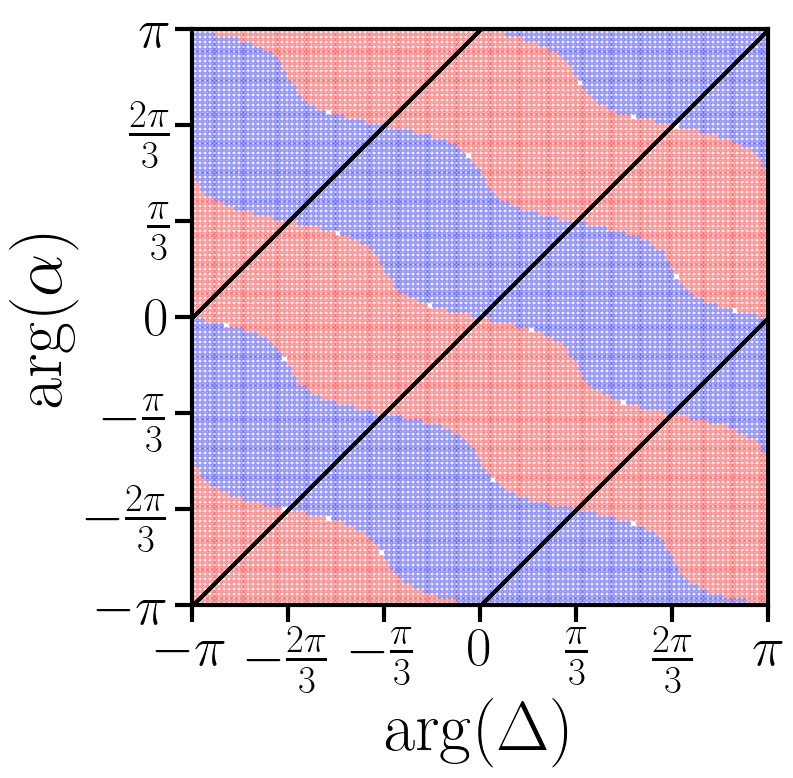

In [81]:
plot_sign_bound_C3()

In [258]:
function plot_sign_bound_v4_finite()
    ion()
    fig, axs = plt.subplots(1,1,figsize=(8, 8))
    ticks = [-1, -2/3, -1/3, 0, 1/3, 2/3, 1]
    labels = [L"$-\pi$", L"$-\frac{2 \pi}{3}$", L"$- \frac{\pi}{3}$", L"$0$", L"$ \frac{\pi}{3}$", L"$\frac{2 \pi}{3}$", L"$\pi$"]
    axs.tick_params(axis="both", which="major", direction="out", length=12, width=3) 
    axs.set_xlabel(L"$\arg(\Delta)$", fontsize = 50)
    axs.set_ylabel(L"$\arg(\alpha)$", fontsize = 50)
    axs.set_xticks(ticks, labels=labels, fontsize=40)
    axs.set_yticks(ticks, labels=labels, fontsize=40)
    axs.set_aspect("equal")
    for spine in axs.spines.values()
        spine.set_linewidth(3)
    end

    omega = exp(im * 2 * pi / 3)
    
    a = 1
    vF = 10000


    # Plot Berry curvatures signs
    n_pts = 120
    angles = range(-pi, pi, n_pts)
    grid = mesh_grid(angles, angles, Float64)

    pos_x = []
    pos_y = []

    neg_x = []
    neg_y = []

    zer_x = []
    zer_y = []

    bc_list = []

    for j in 1:n_pts*n_pts
        phi = grid[j, 1]
        delta = exp(im * phi)
        theta = grid[j, 2]
        alpha = exp(im * theta)

        low_lim = 4*abs(delta)/vF
        up_lim = abs(delta) / abs(alpha)
        mom_rad = (low_lim + up_lim)/2
        point = reshape(mom_rad * [1, 0], (1, 2))

        bc = bc_no_spinors(point, 10^(-6), vF, delta, alpha, 1)[1]
        push!(bc_list, bc)

        # bc_sgn = approx_sign(bc)
        # if bc_sgn < 0
        #     push!(neg_x, 1/pi * grid[j, 1])
        #     push!(neg_y, 1/pi * grid[j, 2])
        # elseif bc_sgn > 0
        #     push!(pos_x, 1/pi * grid[j, 1])
        #     push!(pos_y, 1/pi * grid[j, 2])
        # else
        #     push!(zer_x, 1/pi * grid[j, 1])
        #     push!(zer_y, 1/pi * grid[j, 2])
        # end
    end

    print(minimum(abs.(bc_list)))

    axs.scatter(1/pi * grid[:, 1], 1/pi * grid[:, 2], c=bc_list, marker="h", s=9, cmap = "RdBu")

    # axs.scatter(pos_x, pos_y, alpha=0.3, c="b", linestyle="-", marker="h", s=9)
    # axs.scatter(neg_x, neg_y, alpha=0.3, c="r", linestyle="-", marker="h", s=9)

    axs.margins(0)

    fig.tight_layout()

    fig
end

plot_sign_bound_v4_finite (generic function with 1 method)

0.0

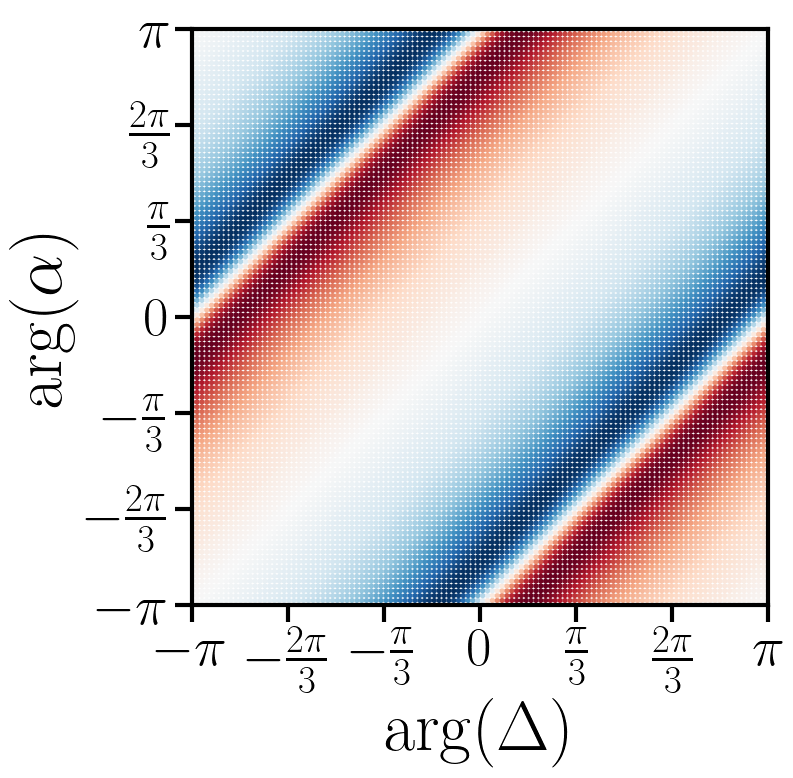

In [259]:
plot_sign_bound_v4_finite()

In [18]:
function plot_sign_bound_v5()
    ion()
    fig, axs = plt.subplots(1,4,figsize=(32, 32))
    ticks = [-1, -2/3, -1/3, 0, 1/3, 2/3, 1]
    labels = [L"$-\pi$", L"$-\frac{2 \pi}{3}$", L"$- \frac{\pi}{3}$", L"$0$", L"$ \frac{\pi}{3}$", L"$\frac{2 \pi}{3}$", L"$\pi$"]
    for j in 1:4
        axs[j].tick_params(axis="both", which="major", direction="out", length=12, width=3) 
        axs[j].set_xlabel(L"$\arg(\Delta)$", fontsize = 50)
        axs[j].set_ylabel(L"$\arg(\alpha)$", fontsize = 50)
        axs[j].set_xticks(ticks, labels=labels, fontsize=40)
        axs[j].set_yticks(ticks, labels=labels, fontsize=40)
        axs[j].set_aspect("equal")
        for spine in axs[j].spines.values()
            spine.set_linewidth(3)
        end
    end

    omega = exp(im * 2 * pi / 3)
    
    a = 1
    vF_values = [0, 2, 4]

    for p in 1:3
        vF = vF_values[p]

        n_pts = 10^4
        varphi_list = range(-pi, pi, n_pts)

        branch_2_roots_1_phi = []
        branch_2_roots_1_theta = []
        branch_2_roots_2_phi = []
        branch_2_roots_2_theta = []
        branch_2_roots_3_phi = []
        branch_2_roots_3_theta = []
        branch_1_roots = Array{Float64}(undef, 3, 2, n_pts)

        for j in 1:n_pts
            varphi = varphi_list[j]

            phim1 = wrap_angle(varphi - pi)
            phi0 = wrap_angle(varphi)
            phip1 = wrap_angle(varphi + pi)

            # Branch 1 roots first
            if 0 < phim1 && phim1 <= 2*pi/3
                km1 = 1
            elseif 2*pi/3 < phim1 || phim1 <= -2*pi/3
                km1 = 0
            elseif phim1 > -2*pi/3 && phim1 <= 0
                km1 = 2
            end

            if 0 < phi0 && phi0 <= 2*pi/3
                k0 = 1
            elseif 2*pi/3 < phi0 || phi0 <= -2*pi/3
                k0 = 0
            elseif phi0 > -2*pi/3 && phi0 <= 0
                k0 = 2
            end

            if 0 < phip1 && phip1 <= 2*pi/3
                kp1 = 1
            elseif 2*pi/3 < phip1 || phip1 <= -2*pi/3
                kp1 = 0
            elseif phip1 > -2*pi/3 && phip1 <= 0
                kp1 = 2
            end

            try
                branch_1_roots[1, 1, j] = phim1
                branch_1_roots[1, 2, j] = branch1_theta(vF, a, varphi_list[j], km1)
            catch e
                branch_1_roots[1, 1, j] = NaN
                branch_1_roots[1, 2, j] = NaN
            end
            try
                branch_1_roots[2, 1, j] = phi0
                branch_1_roots[2, 2, j] = branch1_theta(vF, a, varphi_list[j], k0)
            catch e
                branch_1_roots[2, 1, j] = NaN
                branch_1_roots[2, 2, j] = NaN
            end
            try
                branch_1_roots[3, 1, j] = phip1
                branch_1_roots[3, 2, j] = branch1_theta(vF, a, varphi_list[j], kp1)
            catch e
                branch_1_roots[3, 1, j] = NaN
                branch_1_roots[3, 2, j] = NaN
            end


            # Branch 2 roots
            roots_b2_temp = Array{Float64}(undef, 3, 2)
            roots_b2_temp[1, :] = branch2_roots(vF, a, varphi, 0, -1)
            roots_b2_temp[2, :] = branch2_roots(vF, a, varphi, 1, -1)
            roots_b2_temp[3, :] = branch2_roots(vF, a, varphi, 2, -1)

            for i in 1:3
                phi = roots_b2_temp[i, 1]
                if 0 < phi && phi <= 2*pi/3
                    k = 1
                elseif 2*pi/3 < phi || phi <= -2*pi/3
                    k = 0
                elseif phi > -2*pi/3 && phi <= 0
                    k = 2
                end
                if k == i - 1
                    push!(branch_2_roots_1_phi, roots_b2_temp[i, 1])
                    push!(branch_2_roots_1_theta, roots_b2_temp[i, 2])
                end
            end

            roots_b2_temp = Array{Float64}(undef, 3, 2)
            roots_b2_temp[1, :] = branch2_roots(vF, a, varphi, 0, 0)
            roots_b2_temp[2, :] = branch2_roots(vF, a, varphi, 1, 0)
            roots_b2_temp[3, :] = branch2_roots(vF, a, varphi, 2, 0)

            for i in 1:3
                phi = roots_b2_temp[i, 1]
                if 0 < phi && phi <= 2*pi/3
                    k = 1
                elseif 2*pi/3 < phi || phi <= -2*pi/3
                    k = 0
                elseif phi > -2*pi/3 && phi <= 0
                    k = 2
                end
                if k == i - 1
                    push!(branch_2_roots_2_phi, roots_b2_temp[i, 1])
                    push!(branch_2_roots_2_theta, roots_b2_temp[i, 2])
                end
            end
            

            roots_b2_temp = Array{Float64}(undef, 3, 2)
            roots_b2_temp[1, :] = branch2_roots(vF, a, varphi, 0, 1)
            roots_b2_temp[2, :] = branch2_roots(vF, a, varphi, 1, 1)
            roots_b2_temp[3, :] = branch2_roots(vF, a, varphi, 2, 1)

            for i in 1:3
                phi = roots_b2_temp[i, 1]
                if 0 < phi && phi <= 2*pi/3
                    k = 1
                elseif 2*pi/3 < phi || phi <= -2*pi/3
                    k = 0
                elseif phi > -2*pi/3 && phi <= 0
                    k = 2
                end
                if k == i - 1
                    push!(branch_2_roots_3_phi, roots_b2_temp[i, 1])
                    push!(branch_2_roots_3_theta, roots_b2_temp[i, 2])
                end
            end

        
        end
        

        for j in 1:size(branch_1_roots, 1)
            axs[p].scatter(1/pi .* branch_1_roots[j, 1, :], 1/pi .* branch_1_roots[j, 2, :], c="k", linestyle="-", marker="o", s=3)
        end

        b2_roots_1 = Array{Float64}(undef, 2, size(branch_2_roots_1_phi, 1))
        b2_roots_1[1, :] = branch_2_roots_1_phi
        b2_roots_1[2, :] = branch_2_roots_1_theta

        b2_roots_2 = Array{Float64}(undef, 2, size(branch_2_roots_2_phi, 1))
        b2_roots_2[1, :] = branch_2_roots_2_phi
        b2_roots_2[2, :] = branch_2_roots_2_theta

        b2_roots_3 = Array{Float64}(undef, 2, size(branch_2_roots_3_phi, 1))
        b2_roots_3[1, :] = branch_2_roots_3_phi
        b2_roots_3[2, :] = branch_2_roots_3_theta

    
        axs[p].scatter(1/pi * b2_roots_1[1, :], 1/pi * b2_roots_1[2, :], alpha=0.7, c="k", linestyle="-", marker="o", s=2)
        axs[p].scatter(1/pi * b2_roots_2[1, :], 1/pi * b2_roots_2[2, :], alpha=0.7, c="k", linestyle="-", marker="o", s=2)
        axs[p].scatter(1/pi * b2_roots_3[1, :], 1/pi * b2_roots_3[2, :], alpha=0.7, c="k", linestyle="-", marker="o", s=2)
        
        # vertical phase boundaries
        n_pts = 10^4
        phase_b1 = Array{Float64}(undef, 2, n_pts)
        phase_b1[2, :] = range(-1, 1, n_pts)
        phase_b1[1, :] = -2/3 * ones(n_pts)

        phase_b2 = Array{Float64}(undef, 2, n_pts)
        phase_b2[2, :] = range(-1, 1, n_pts)
        phase_b2[1, :] = zeros(n_pts)

        phase_b3 = Array{Float64}(undef, 2, n_pts)
        phase_b3[2, :] = range(-1, 1, n_pts)
        phase_b3[1, :] = 2/3 * ones(n_pts)

        axs[p].plot(phase_b1[1, :], phase_b1[2, :], alpha=1, c="k", linestyle="--", markersize=70, linewidth=3)
        axs[p].plot(phase_b2[1, :], phase_b2[2, :], alpha=1, c="k", linestyle="--", markersize=70, linewidth=3)
        axs[p].plot(phase_b3[1, :], phase_b3[2, :], alpha=1, c="k", linestyle="--", markersize=70, linewidth=3)


        # Plot Berry curvatures signs
        n_pts = 10^2
        angles = range(-0.99 * pi, 0.99 * pi, n_pts)
        grid = mesh_grid(angles, angles, Float64)

        pos_x = []
        pos_y = []

        neg_x = []
        neg_y = []

        zer_x = []
        zer_y = []

        bc_list = []

        for j in 1:n_pts*n_pts
            phi = grid[j, 1]
            delta = exp(im * phi)
            theta = grid[j, 2]
            alpha = exp(im * theta)
            phi = wrap_angle(angle(delta))
            if 0 < phi && phi < 2*pi/3
                k = 1
            elseif 2*pi/3 < phi || phi < -2*pi/3
                k = 0
            elseif phi > -2*pi/3 && phi < 0
                k = 2
            end
            # properly enforce
            bc = explicit_og_bc_vF(delta, alpha/2, k + 1, vF/2)
            push!(bc_list, bc)
        end
        cmax = quantile(abs.(bc_list), 0.15)
        axs[p].scatter(1/pi * grid[:, 1], 1/pi * grid[:, 2], c=bc_list, marker="h", s=9, cmap = "RdBu", vmin = -cmax, vmax = cmax)
    end

    n_pts = 10^4
    varphi_list = range(-0.999*pi, 0.999*pi, n_pts)
    
    # root_sets = Array{Float64}(undef, 6, 2, n_pts)
    branch_2_roots_1_phi = []
    branch_2_roots_1_theta = []

    branch_2_roots_2_phi = []
    branch_2_roots_2_theta = []

    branch_2_roots_3_phi = []
    branch_2_roots_3_theta = []

    branch_1_roots = Array{Float64}(undef, 3, 2, n_pts)
    for j in 1:n_pts
        varphi = varphi_list[j]

        phim1 = wrap_angle(varphi - pi)
        phi0 = wrap_angle(varphi)
        phip1 = wrap_angle(varphi + pi)

        # Branch 1 roots first
        if 0 < phim1 && phim1 <= 2*pi/3
            km1 = 1
        elseif 2*pi/3 < phim1 || phim1 <= -2*pi/3
            km1 = 0
        elseif phim1 > -2*pi/3 && phim1 <= 0
            km1 = 2
        end

        if 0 < phi0 && phi0 <= 2*pi/3
            k0 = 1
        elseif 2*pi/3 < phi0 || phi0 <= -2*pi/3
            k0 = 0
        elseif phi0 > -2*pi/3 && phi0 <= 0
            k0 = 2
        end

        if 0 < phip1 && phip1 <= 2*pi/3
            kp1 = 1
        elseif 2*pi/3 < phip1 || phip1 <= -2*pi/3
            kp1 = 0
        elseif phip1 > -2*pi/3 && phip1 <= 0
            kp1 = 2
        end

        try
            branch_1_roots[1, 1, j] = phim1
            branch_1_roots[1, 2, j] = branch1_theta(vF, a, varphi_list[j], km1)
        catch e
            branch_1_roots[1, 1, j] = NaN
            branch_1_roots[1, 2, j] = NaN
        end
        try
            branch_1_roots[2, 1, j] = phi0
            branch_1_roots[2, 2, j] = branch1_theta(vF, a, varphi_list[j], k0)
        catch e
            branch_1_roots[2, 1, j] = NaN
            branch_1_roots[2, 2, j] = NaN
        end
        try
            branch_1_roots[3, 1, j] = phip1
            branch_1_roots[3, 2, j] = branch1_theta(vF, a, varphi_list[j], kp1)
        catch e
            branch_1_roots[3, 1, j] = NaN
            branch_1_roots[3, 2, j] = NaN
        end


        # Branch 2 roots
        roots_b2_temp = Array{Float64}(undef, 3, 2)
        roots_b2_temp[1, :] = branch2_roots(vF, a, varphi, 0, -1)
        roots_b2_temp[2, :] = branch2_roots(vF, a, varphi, 1, -1)
        roots_b2_temp[3, :] = branch2_roots(vF, a, varphi, 2, -1)

        for i in 1:3
            phi = roots_b2_temp[i, 1]
            if 0 < phi && phi <= 2*pi/3
                k = 1
            elseif 2*pi/3 < phi || phi <= -2*pi/3
                k = 0
            elseif phi > -2*pi/3 && phi <= 0
                k = 2
            end
            if k == i - 1
                push!(branch_2_roots_1_phi, roots_b2_temp[i, 1])
                push!(branch_2_roots_1_theta, roots_b2_temp[i, 2])
            end
        end

        roots_b2_temp = Array{Float64}(undef, 3, 2)
        roots_b2_temp[1, :] = branch2_roots(vF, a, varphi, 0, 0)
        roots_b2_temp[2, :] = branch2_roots(vF, a, varphi, 1, 0)
        roots_b2_temp[3, :] = branch2_roots(vF, a, varphi, 2, 0)

        for i in 1:3
            phi = roots_b2_temp[i, 1]
            if 0 < phi && phi <= 2*pi/3
                k = 1
            elseif 2*pi/3 < phi || phi <= -2*pi/3
                k = 0
            elseif phi > -2*pi/3 && phi <= 0
                k = 2
            end
            if k == i - 1
                push!(branch_2_roots_2_phi, roots_b2_temp[i, 1])
                push!(branch_2_roots_2_theta, roots_b2_temp[i, 2])
            end
        end
        

        roots_b2_temp = Array{Float64}(undef, 3, 2)
        roots_b2_temp[1, :] = branch2_roots(vF, a, varphi, 0, 1)
        roots_b2_temp[2, :] = branch2_roots(vF, a, varphi, 1, 1)
        roots_b2_temp[3, :] = branch2_roots(vF, a, varphi, 2, 1)

        for i in 1:3
            phi = roots_b2_temp[i, 1]
            if 0 < phi && phi <= 2*pi/3
                k = 1
            elseif 2*pi/3 < phi || phi <= -2*pi/3
                k = 0
            elseif phi > -2*pi/3 && phi <= 0
                k = 2
            end
            if k == i - 1
                push!(branch_2_roots_3_phi, roots_b2_temp[i, 1])
                push!(branch_2_roots_3_theta, roots_b2_temp[i, 2])
            end
        end
    end

    # infinite case
    vF = 10^5
    n_pts = 10^4
    phase_b1 = Array{Float64}(undef, 2, n_pts)
    phase_b1[2, :] = range(-1, 1, n_pts)
    phase_b1[1, :] = -1/3 * ones(n_pts)

    phase_b2 = Array{Float64}(undef, 2, n_pts)
    phase_b2[2, :] = range(-1, 1, n_pts)
    phase_b2[1, :] = -1 * ones(n_pts)

    phase_b3 = Array{Float64}(undef, 2, n_pts)
    phase_b3[2, :] = range(-1, 1, n_pts)
    phase_b3[1, :] = 1 * ones(n_pts)

    phase_b4 = Array{Float64}(undef, 2, n_pts)
    phase_b4[2, :] = range(-1, 1, n_pts)
    phase_b4[1, :] = 1/3 * ones(n_pts)

    axs[4].scatter(phase_b1[1, :], phase_b1[2, :], alpha=0.7, c="k", linestyle="-", marker="o", s=2)
    axs[4].scatter(phase_b2[1, :], phase_b2[2, :], alpha=0.7, c="k", linestyle="-", marker="o", s=2)
    axs[4].scatter(phase_b3[1, :], phase_b3[2, :], alpha=0.7, c="k", linestyle="-", marker="o", s=2)
    axs[4].scatter(phase_b4[1, :], phase_b4[2, :], alpha=0.7, c="k", linestyle="-", marker="o", s=2)
    
    # vertical phase boundaries
    n_pts = 10^4
    phase_b1 = Array{Float64}(undef, 2, n_pts)
    phase_b1[2, :] = range(-1, 1, n_pts)
    phase_b1[1, :] = -2/3 * ones(n_pts)

    phase_b2 = Array{Float64}(undef, 2, n_pts)
    phase_b2[2, :] = range(-1, 1, n_pts)
    phase_b2[1, :] = zeros(n_pts)

    phase_b3 = Array{Float64}(undef, 2, n_pts)
    phase_b3[2, :] = range(-1, 1, n_pts)
    phase_b3[1, :] = 2/3 * ones(n_pts)

    axs[4].plot(phase_b1[1, :], phase_b1[2, :], alpha=1, c="k", linestyle="--", markersize=70, linewidth=3)
    axs[4].plot(phase_b2[1, :], phase_b2[2, :], alpha=1, c="k", linestyle="--", markersize=70, linewidth=3)
    axs[4].plot(phase_b3[1, :], phase_b3[2, :], alpha=1, c="k", linestyle="--", markersize=70, linewidth=3)


    # Plot Berry curvatures signs
    n_pts = 10^2
    angles = range(-0.99 * pi, 0.99 * pi, n_pts)
    grid = mesh_grid(angles, angles, Float64)

    pos_x = []
    pos_y = []

    neg_x = []
    neg_y = []

    zer_x = []
    zer_y = []

    bc_list = []

    for j in 1:n_pts*n_pts
        phi = grid[j, 1]
        delta = exp(im * phi)
        theta = grid[j, 2]
        alpha = exp(im * theta)
        phi = wrap_angle(angle(delta))
        if 0 < phi && phi < 2*pi/3
            k = 1
        elseif 2*pi/3 < phi || phi < -2*pi/3
            k = 0
        elseif phi > -2*pi/3 && phi < 0
            k = 2
        end
        # properly enforce
        bc = explicit_og_bc_vF(delta, alpha/2, k + 1, vF/2)
        push!(bc_list, bc)
    end
    cmax = quantile(abs.(bc_list), 0.15)
    axs[4].scatter(1/pi * grid[:, 1], 1/pi * grid[:, 2], c=bc_list, marker="h", s=9, cmap = "RdBu", vmin = -cmax, vmax = cmax)

    axs[1].set_title(L"$v_F/|\alpha| = 0$", fontsize=50, pad=20)
    axs[2].set_title(L"$v_F/|\alpha| = 2$", fontsize=50, pad=20)
    axs[3].set_title(L"$v_F/|\alpha| = 4$", fontsize=50, pad=20)
    axs[4].set_title(L"$v_F/|\alpha| = 10^5$", fontsize=50, pad=20)

    for j in 1:4
        axs[j].margins(0)
    end

    fig.text(-0.33, 1, L"$\textbf{(a)}$", transform=axs[1].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.33, 1, L"$\textbf{(b)}$", transform=axs[2].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.33, 1, L"$\textbf{(c)}$", transform=axs[3].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.33, 1, L"$\textbf{(d)}$", transform=axs[4].transAxes, ha="left", va="top", fontsize=50, color="k")

    fig.tight_layout()

    fig
end

plot_sign_bound_v5 (generic function with 1 method)

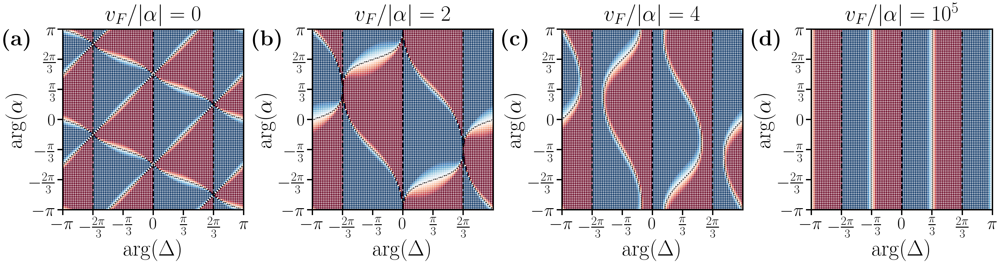

In [19]:
plot_sign_bound_v5()

# Finite $k$ sign plot

In [32]:
function finite_k_fig(kappa, spacing)
    ion()
    fig, axs = plt.subplots(2, 2,figsize=(16, 8), constrained_layout=false, gridspec_kw=Dict("height_ratios" => [0.04, 1.0], 
    "hspace" => 0.15))
    fig.align_ylabels(axs[:, :])
    fig.align_xlabels(axs[:, :])

    vF_list = [20]
    delta_list = [exp(im*pi/4)]

    for j in 1:2
        for spine in axs[2, j].spines.values()
            spine.set_linewidth(3)
        end
    end

    for j in 1:1
        axs[2, j].set_ylabel(L"$q_y$", fontsize = 60, labelpad=20)
        axs[2, j].set_xlabel(L"$q_x$", fontsize = 60)
        axs[2, j].tick_params(axis="both", which="major", direction="in", length=12, width=3) 
        axs[2, j].set_aspect("equal", adjustable="datalim")

        pos = axs[2, j].get_position()
        new_width = 0.8 * pos.width
        new_x0 = pos.x0 + 0.5 * (pos.width - new_width)
        axs[1, j].set_position([new_x0, axs[1, j].get_position().y0, new_width, axs[1, j].get_position().height])

        delta = delta_list[j]
        alpha = 1 * exp(2*im * pi/3)
        vF = vF_list[j] * abs(alpha)

        ticks = [0]
        labels = [L"$0$"]
        axs[2, j].set_xticks(ticks, labels=labels, fontsize=40)
        axs[2, j].set_yticks(ticks, labels=labels, fontsize=40)
        
                
        n_pts = 3*10^2
        k_list = range(-1.3, 1.3, n_pts)
        grid = mesh_grid(k_list, k_list, Float64)
        bc_list = bc_no_spinors(grid, spacing, vF, delta, alpha, 1)

        grid_new = reshape(grid, (n_pts, n_pts, 2))
        bc_list_new = reshape(bc_list, (n_pts, n_pts)) / (pi)

        bc_abs = maximum(abs.([maximum(bc_list_new), minimum(bc_list_new)]))

        berry = axs[2, j].pcolormesh(grid_new[:, :, 1], grid_new[:, :, 2], bc_list_new, cmap="RdBu", vmin = -bc_abs, vmax = bc_abs)

        cbar = fig.colorbar(berry, cax=axs[1, j], orientation="horizontal", location = "top", shrink = 0.8, pad=0.05)
        cbar.ax.tick_params(length=12, width=3, which="major", direction="out")

        cb_ticks = [-2, 0, 2]
        cb_labels = [L"-2 \pi", L"$0$", L"$2 \pi$"]
        cbar.set_ticks(cb_ticks)
        cbar.set_ticklabels(cb_labels, fontsize=40)

        center = (0, 0)
        radius = 4*abs(delta)/vF
        circle = matplotlib.patches.Circle(center, radius, fill=false, color="darkorchid", linestyle="--", linewidth=4)
        axs[2, j].add_patch(circle)

        # fig.text(0.52, 0.61, L"$4 |\Delta|/v_F$", transform=axs[2, j].transAxes, fontsize=35, color="darkorchid")
        fig.text(0.52, 0.61, L"$\Lambda_\mathrm{IR}$", transform=axs[2, j].transAxes, fontsize=50, color="darkorchid")


        center = (0, 0)
        radius = abs(delta)/(abs(alpha))
        circle = matplotlib.patches.Circle(center, radius, fill=false, color="forestgreen", linestyle="--", linewidth=4)
        axs[2, j].add_patch(circle)

        # fig.text(0.73, 0.09, L"$|\Delta|/|\alpha|$", transform=axs[2, j].transAxes, fontsize=35, color="forestgreen")
        fig.text(0.73, 0.09, L"$\Lambda_\mathrm{UV}$", transform=axs[2, j].transAxes, fontsize=50, color="forestgreen")

        axs[2, j].set_box_aspect(1)
    end



    ticks = [-1, -2/3, -1/3, 0, 1/3, 2/3, 1]
    labels = [L"$-\pi$", L"$-\frac{2 \pi}{3}$", L"$- \frac{\pi}{3}$", L"$0$", L"$ \frac{\pi}{3}$", L"$\frac{2 \pi}{3}$", L"$\pi$"]
    axs[2, 2].tick_params(axis="both", which="major", direction="out", length=12, width=3) 
    axs[2, 2].set_xlabel(L"$\arg(\Delta)$", fontsize = 50)
    axs[2, 2].set_ylabel(L"$\arg(\alpha)$", fontsize = 50)
    axs[2, 2].set_xticks(ticks, labels=labels, fontsize=40)
    axs[2, 2].set_yticks(ticks, labels=labels, fontsize=40)
    axs[2, 2].set_aspect("equal")

    omega = exp(im * 2 * pi / 3)
    
    a = 1
    vF = 20


    # Plot Berry curvatures signs
    n_pts = 100
    angles = range(-pi, pi, n_pts)
    grid = mesh_grid(angles, angles, Float64)

    pos_x = []
    pos_y = []

    neg_x = []
    neg_y = []

    zer_x = []
    zer_y = []

    for j in 1:n_pts*n_pts
        phi = grid[j, 1]
        delta = exp(im * phi)
        theta = grid[j, 2]
        alpha = exp(im * theta)

        low_lim = 4*abs(delta)/vF
        up_lim = abs(delta) / abs(alpha)
        mom_rad = (low_lim + up_lim)/2
        point = reshape(mom_rad * [1, 0], (1, 2))

        bc = bc_no_spinors(point, 10^(-3), vF, delta, alpha, 1)[1]
        bc_sgn = approx_sign(bc)
        if bc_sgn < 0
            push!(neg_x, 1/pi * grid[j, 1])
            push!(neg_y, 1/pi * grid[j, 2])
        elseif bc_sgn > 0
            push!(pos_x, 1/pi * grid[j, 1])
            push!(pos_y, 1/pi * grid[j, 2])
        else
            push!(zer_x, 1/pi * grid[j, 1])
            push!(zer_y, 1/pi * grid[j, 2])
        end
    end

    axs[2, 2].scatter(pos_x, pos_y, alpha=0.3, c="b", linestyle="-", marker="h", s=9)
    axs[2, 2].scatter(neg_x, neg_y, alpha=0.3, c="r", linestyle="-", marker="h", s=9)


    # Phase boundaries
    n_pts = 10^4

    phase_b1 = Array{Float64}(undef, 2, n_pts)
    phase_b1[1, :] = range(-1, 1, n_pts)
    phase_b1[2, :] = range(-1, 1, n_pts)

    phase_b2 = Array{Float64}(undef, 2, n_pts)
    phase_b2[1, :] = range(-1, 0, n_pts)
    phase_b2[2, :] = range(0, 1, n_pts)

    phase_b3 = Array{Float64}(undef, 2, n_pts)
    phase_b3[1, :] = range(0, 1, n_pts)
    phase_b3[2, :] = range(-1, 0, n_pts)


    # axs[2, 2].plot(phase_b1[1, :], phase_b1[2, :], alpha=0.7, c="k", linestyle="--", linewidth = 4)
    # axs[2, 2].plot(phase_b2[1, :], phase_b2[2, :], alpha=0.7, c="k", linestyle="--", linewidth = 4)
    # axs[2, 2].plot(phase_b3[1, :], phase_b3[2, :], alpha=0.7, c="k", linestyle="--", linewidth = 4)

    axs[2, 2].margins(0)

    axs[1, 2].axis("off")

    axs[2, 2].set_title(L"$v_F / |\alpha| = 20$", fontsize=50, pad=30)
    
    fig.text(-0.21, 1.1, L"$\textbf{(a)}$", transform=axs[2, 1].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.32, 1.1, L"$\textbf{(b)}$", transform=axs[2, 2].transAxes, ha="left", va="top", fontsize=50, color="k")

    low_lim = 4/vF
    up_lim = 1
    mom_rad = (low_lim + up_lim)/2
    point = mom_rad * [1, 0]
    axs[2, 1].plot(point[1], point[2], marker="*", linestyle="None", markersize=40, color="steelblue", alpha=0.7)
    
    fig.tight_layout()

    fig.savefig("figs/finite_k_sign.png", bbox_inches="tight")
    fig
end

finite_k_fig (generic function with 1 method)

sys:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


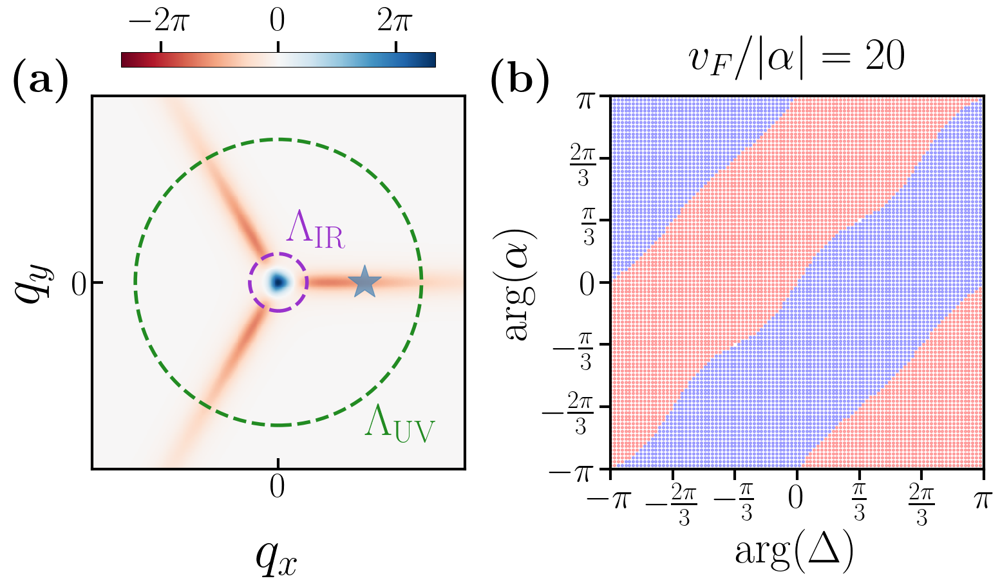

In [33]:
kappa = 1
spacing = 10^(-3)
finite_k_fig(kappa, spacing)

# $v_F/|\alpha|$ Berry curvature

In [100]:
function large_vF_fig(kappa, spacing)
    ion()
    fig, axs = plt.subplots(2, 1,figsize=(8, 8), constrained_layout=false, gridspec_kw=Dict("height_ratios" => [0.04, 1.0], 
    "hspace" => 0.15))
    fig.align_ylabels(axs[:, :])
    fig.align_xlabels(axs[:, :])

    vF_list = [20]
    delta_list = [exp(im*pi/4)]

    for j in 1:1
        axs[2, j].set_ylabel(L"$q_y$", fontsize = 60, labelpad=20)
        axs[2, j].set_xlabel(L"$q_x$", fontsize = 60)
        axs[2, j].tick_params(axis="both", which="major", direction="in", length=12, width=3) 
        axs[2, j].set_aspect("equal", adjustable="datalim")

        for spine in axs[2, j].spines.values()
            spine.set_linewidth(3)
        end

        pos = axs[2, j].get_position()
        new_width = 0.8 * pos.width
        new_x0 = pos.x0 + 0.5 * (pos.width - new_width)
        axs[1, j].set_position([new_x0, axs[1, j].get_position().y0, new_width, axs[1, j].get_position().height])

        delta = delta_list[j]
        alpha = 1 * exp(2*im * pi/3)
        vF = vF_list[j] * abs(alpha)

        ticks = [0]
        labels = [L"$0$"]
        axs[2, j].set_xticks(ticks, labels=labels, fontsize=40)
        axs[2, j].set_yticks(ticks, labels=labels, fontsize=40)
        
                
        n_pts = 3*10^2
        k_list = range(-1.3, 1.3, n_pts)
        grid = mesh_grid(k_list, k_list, Float64)
        bc_list = bc_no_spinors(grid, spacing, vF, delta, alpha, 1)

        grid_new = reshape(grid, (n_pts, n_pts, 2))
        bc_list_new = reshape(bc_list, (n_pts, n_pts)) / (pi)

        bc_abs = maximum(abs.([maximum(bc_list_new), minimum(bc_list_new)]))

        berry = axs[2, j].pcolormesh(grid_new[:, :, 1], grid_new[:, :, 2], bc_list_new, cmap="RdBu", vmin = -bc_abs, vmax = bc_abs)

        cbar = fig.colorbar(berry, cax=axs[1, j], orientation="horizontal", location = "top", shrink = 0.8, pad=0.05)
        cbar.ax.tick_params(length=12, width=3, which="major", direction="out")

        cb_ticks = [-2, 0, 2]
        cb_labels = [L"-2 \pi", L"$0$", L"$2 \pi$"]
        cbar.set_ticks(cb_ticks)
        cbar.set_ticklabels(cb_labels, fontsize=40)

        center = (0, 0)
        radius = 4*abs(delta)/vF
        circle = matplotlib.patches.Circle(center, radius, fill=false, color="orchid", linestyle="--", linewidth=4)
        axs[2, j].add_patch(circle)

        fig.text(0.52, 0.61, L"$4 |\Delta|/v_F$", transform=axs[2, j].transAxes, fontsize=35, color="orchid")


        center = (0, 0)
        radius = abs(delta)/(abs(alpha))
        circle = matplotlib.patches.Circle(center, radius, fill=false, color="mediumseagreen", linestyle="--", linewidth=4)
        axs[2, j].add_patch(circle)

        fig.text(0.73, 0.09, L"$|\Delta|/|\alpha|$", transform=axs[2, j].transAxes, fontsize=35, color="mediumseagreen")

        axs[2, j].set_box_aspect(1)
    end
    
    # fig.text(-0.2, 1, L"$\textbf{(b)}$", transform=axs[2, 2].transAxes, ha="left", va="top", fontsize=50, color="k")
    
    fig.tight_layout()

    fig.savefig("figs/large_vF.png", bbox_inches="tight")
    fig
end

large_vF_fig (generic function with 1 method)

sys:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


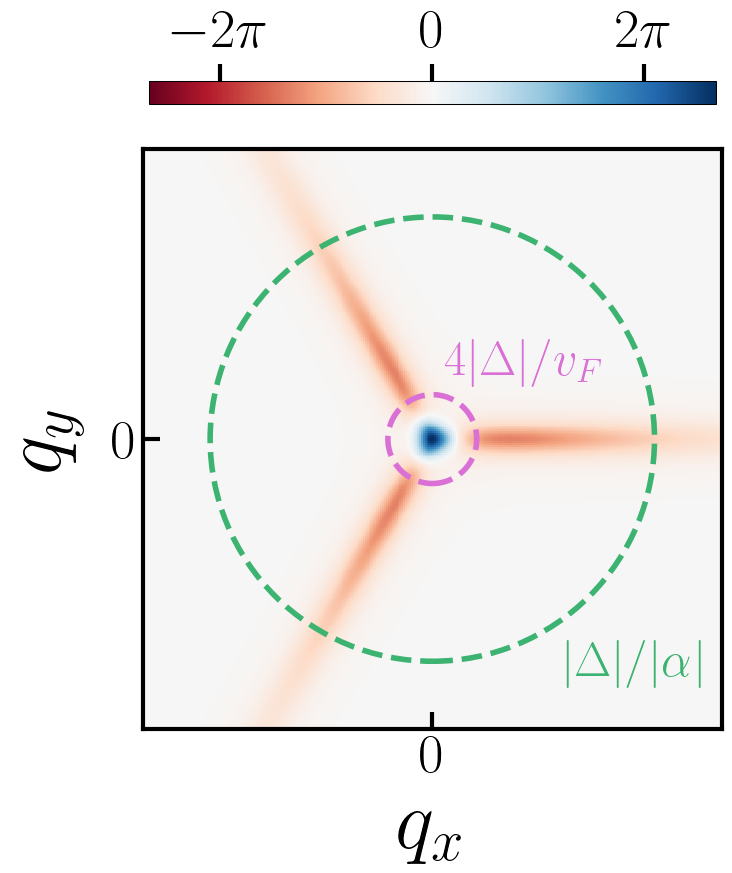

In [101]:
kappa = 1
spacing = 10^(-3)
large_vF_fig(kappa, spacing)

In [114]:
function large_vF_fig_v3(kappa, spacing)
    ion()
    fig, axs = plt.subplots(2, 1,figsize=(8, 8), constrained_layout=false, gridspec_kw=Dict("height_ratios" => [0.04, 1.0], 
    "hspace" => 0.15))
    fig.align_ylabels(axs[:, :])
    fig.align_xlabels(axs[:, :])

    vF_list = [500]
    delta_list = [exp(im*pi/4)]

    for j in 1:1
        # axs[2, j].set_ylabel(L"$q_y$", fontsize = 60, labelpad=20)
        # axs[2, j].set_xlabel(L"$q_x$", fontsize = 60)
        # axs[2, j].tick_params(axis="both", which="major", direction="in", length=12, width=3) 
        # axs[2, j].set_aspect("equal", adjustable="datalim")

        # for spine in axs[2, j].spines.values()
        #     spine.set_linewidth(3)
        # end

        pos = axs[2, j].get_position()
        new_width = 0.8 * pos.width
        new_x0 = pos.x0 + 0.5 * (pos.width - new_width)
        axs[1, j].set_position([new_x0, axs[1, j].get_position().y0, new_width, axs[1, j].get_position().height])

        delta = delta_list[j]
        alpha = 1 * exp(2*im * pi/3)
        vF = vF_list[j] * abs(alpha)

        # ticks = [0]
        # labels = [L"$0$"]
        # axs[2, j].set_xticks(ticks, labels=labels, fontsize=40)
        # axs[2, j].set_yticks(ticks, labels=labels, fontsize=40)
        
                
        n_pts = 3*10^2
        point = reshape([1, 0], (1, 2))

        ang_list = range(-pi, pi, 10^3)
        bc_list = zeros(length(ang_list))
        for i in 1:length(bc_list)
            alpha = exp(im * ang_list[i])
            delta = 3*exp(-im * ang_list[i])
            bc_list[i] = bc_no_spinors(point, spacing, vF, delta, alpha, 1)[1]
        end

       
        berry = axs[2, j].plot(ang_list/pi, bc_list)

        axs[2, j].set_box_aspect(1)
    end
    
    # fig.text(-0.2, 1, L"$\textbf{(b)}$", transform=axs[2, 2].transAxes, ha="left", va="top", fontsize=50, color="k")
    
    fig.tight_layout()

   
    fig
end

large_vF_fig_v3 (generic function with 1 method)

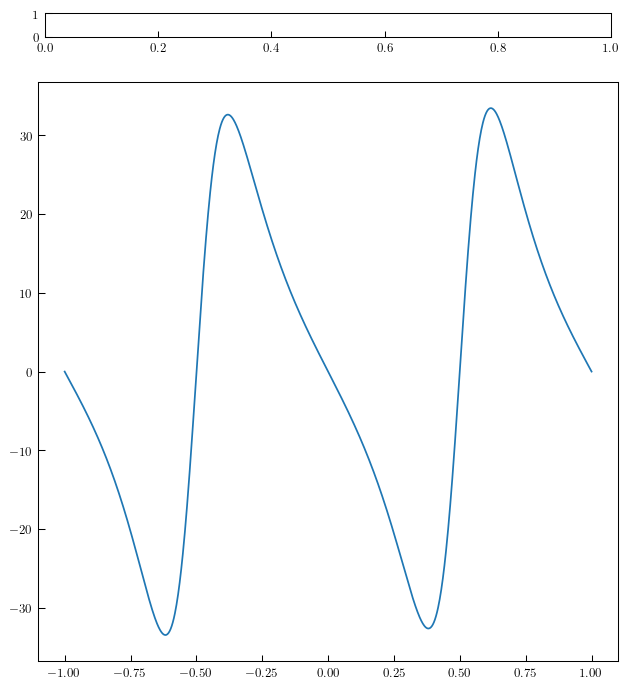

In [115]:
kappa = 1
spacing = 10^(-3)
large_vF_fig_v3(kappa, spacing)

In [101]:
delta = exp(im * pi/4)
alpha = 1 * exp(im * pi/4)
vF = 10000
q = [1, 2]
ham = H_k_v2(q, vF) + H_mft_v2(q, delta, alpha)

display(normalize(gauge_fix(eigvecs(Hermitian(ham))[:, 1])))

3-element Vector{ComplexF64}:
   6.90583353458066e-5 + 1.3552527156068808e-20im
 3.0378193871007106e-9 + 5.77332894639019e-5im
   -0.7071227128354244 - 0.7070908434494706im

# $v_F/|\alpha|$ Berry curvature series

In [80]:
function large_vF_fig_plotter(kappa, spacing)
    ion()

    vF_list = [3/20]
    # -4pi/5, -2pi/5, -pi/5, pi/4, pi/2, 3pi/4
    fig, axs = plt.subplots(12, 6, figsize=(75, 105), constrained_layout=false, gridspec_kw=Dict("height_ratios" => [0.04, 1.0, 0.04, 1.0, 
    0.04, 1.0, 0.04, 1.0, 0.04, 1.0, 0.04, 1.0], "hspace" => 0.005))
    fig.align_ylabels(axs[:, :])
    fig.align_xlabels(axs[:, :])

    delta_list = [exp(-3im * pi/4), exp(-im * pi/2), exp(-im*pi/4), exp(im * pi/4), exp(im * pi/2), exp(im * 3*pi/4)]
    alpha_list = 3 * [exp(-3im * pi/4), exp(-im * pi/2), exp(-im*pi/4), exp(im * pi/4), exp(im * pi/2), exp(im * 3*pi/4)]
    for j in 1:length(alpha_list)
        alpha = alpha_list[j]
        for i in 1:length(delta_list)
            delta = delta_list[i]
            axs[2*j, i].set_ylabel(L"$q_y$", fontsize = 60, labelpad=20)
            axs[2*j, i].set_xlabel(L"$q_x$", fontsize = 60)
            axs[2*j, i].tick_params(axis="both", which="major", direction="in", length=12, width=3) 
            axs[2*j, i].set_aspect("equal", adjustable="datalim")
            for spine in axs[2*j, i].spines.values()
                spine.set_linewidth(3)
            end
        
            pos = axs[2*j, i].get_position()
            new_width = 0.8 * pos.width
            new_x0 = pos.x0 + 0.5 * (pos.width - new_width)
            axs[2*j - 1, i].set_position([new_x0, axs[2*j - 1, i].get_position().y0, new_width, axs[2*j - 1, i].get_position().height])

            vF = vF_list[1] * abs(alpha)

            ticks = [0]
            labels = [L"$0$"]
            axs[2*j, i].set_xticks(ticks, labels=labels, fontsize=40)
            axs[2*j, i].set_yticks(ticks, labels=labels, fontsize=40)
            
                    
            n_pts = 3*10^2
            k_list = 2 * range(-1, 1, n_pts)
            grid = mesh_grid(k_list, k_list, Float64)
            bc_list = bc_no_spinors(grid, spacing, vF, delta, alpha, 1)

            grid_new = reshape(grid, (n_pts, n_pts, 2))
            bc_list_new = reshape(bc_list, (n_pts, n_pts)) / (pi)

            bc_abs = maximum(abs.([maximum(bc_list_new), minimum(bc_list_new)]))

            berry = axs[2*j, i].pcolormesh(grid_new[:, :, 1], grid_new[:, :, 2], bc_list_new, cmap="RdBu", vmin = -1, vmax = 1)

            cbar = fig.colorbar(berry, cax=axs[2*j - 1, i], orientation="horizontal", location = "top", shrink = 0.8, pad = -0.8)
            cbar.ax.tick_params(length=12, width=3, which="major", direction="out")

            cb_ticks = [-1, 0, 1]
            cb_labels = [L"- \pi", L"$0$", L"$\pi$"]
            cbar.set_ticks(cb_ticks)
            cbar.set_ticklabels(cb_labels, fontsize=40)

            center = (0, 0)
            radius = 4*abs(delta)/vF
            circle = matplotlib.patches.Circle(center, radius, fill=false, color="orchid", linestyle="--", linewidth=4)
            # axs[2*j, i].add_patch(circle)

            center = (0, 0)
            radius = abs(delta)/(abs(alpha))
            circle = matplotlib.patches.Circle(center, radius, fill=false, color="mediumseagreen", linestyle="--", linewidth=4)
            # axs[2*j, i].add_patch(circle)

            fig.text(0.35, 0.9, L"$\arg(\Delta)= $"*string(round(angle(delta)/pi, digits=2))*L"$\pi$", transform=axs[2*j, i].transAxes, 
            fontsize=35, color="k")
            fig.text(0.35, 0.06, L"$\arg(\alpha)= $"*string(round(angle(alpha)/pi, digits=2))*L"$\pi$", transform=axs[2*j, i].transAxes, 
            fontsize=35, color="k")

            axs[2*j, i].set_box_aspect(1)
        end
    end
       
    fig.tight_layout()
    # fig.savefig("figs/vF_bc_series.png", bbox_inches="tight")
    fig

end

large_vF_fig_plotter (generic function with 1 method)

In [81]:
kappa = 1
spacing = 10^(-3)
large_vF_fig_plotter(kappa, spacing)

sys:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


# Topo. flat band figures

In [11]:
function C3_cones_energies(delta, alpha, vF, qx, qy)
    omega = exp(im * 2 * pi/3)
    delta_tild = 2 * real(delta)
    delta3 = 2 * real(conj(omega) * delta)

    J = vF/2 + real(conj(omega) * alpha)
    M = vF/2 + real(alpha)

    eps_0 = delta_tild - J * qx

    eps_m = (delta3 + delta_tild + J*qx)/2 - (1/2) * sqrt((delta3 - delta_tild - J*qx)^2 + 8*M^2*qx^2)
    
    eps_p = (delta3 + delta_tild + J*qx)/2 + (1/2) * sqrt((delta3 - delta_tild - J*qx)^2 + 8*M^2*qx^2)


    return [eps_m, eps_0, eps_p]
end
function topo_fb_paper_fig(kappa, spacing)
    qx_list = kappa * range(-1.1, 1.1, 10^3)
    qy = 0
    ion()
    fig, axs = plt.subplots(4, 5,figsize=(50, 20), constrained_layout=false, gridspec_kw=Dict("height_ratios" => [1.0, 0.3, 0.04, 1.0], 
    "hspace" => 0.15))
    fig.align_ylabels(axs[:, :])
    fig.align_xlabels(axs[:, :])

    for j in 1:5
        axs[1, j].set_ylabel(L"$\mathrm{Energy}$", fontsize = 50)
        axs[1, j].set_xlabel(L"$q_x$", fontsize = 50)
        axs[1, j].tick_params(axis="both", which="major", direction="in", length=12, width=3) 
        axs[1, j].set_aspect("equal", adjustable="datalim")
        
        axs[4, j].set_ylabel(L"$q_y$", fontsize = 50)
        axs[4, j].set_xlabel(L"$q_x$", fontsize = 50)
        axs[4, j].tick_params(axis="both", which="major", direction="in", length=12, width=3) 
        axs[4, j].set_aspect("equal", adjustable="datalim")
        
        axs[2, j].axis("off")
    end

    # Set the colorbar stuff
    for j in 1:5
        pos = axs[4, j].get_position()
        new_width = 0.8 * pos.width
        new_x0 = pos.x0 + 0.5 * (pos.width - new_width)
        axs[3, j].set_position([new_x0, axs[3, j].get_position().y0, new_width, axs[3, j].get_position().height])
    end

    for p in 1:5
        # U(1), PK
        if p == 1
            delta = 0.25*exp(2 * im * pi/3) 
            alpha = 1 * exp(2*im * pi/3)
            vF = -2 * real(exp(-im * 2 * pi/3) * alpha)

            xticks = [-1, 0, 1]
            xlabels = [L"$-L$", L"$0$",  L"$L$"]
            axs[1, p].set_xticks(xticks, labels=xlabels, fontsize=50)
            delta1 = 2 * real(delta)
            delta3 = 2 * real(exp(-2im*pi/3) * delta)
            yticks = [delta1, delta3]
            ylabels = [L"$\widetilde{\Delta}$", L"$\Delta_3$"]
            axs[1, p].set_yticks(yticks, labels=ylabels, fontsize=50)
            axs[1, p].set_ylim(-1, 1.2)

            in_ticks = [-1, 0, 1]
            in_labels = [L"$-L$", L"$0$", L"$L$"]
            cb_ticks = [-4, 0, 4]
            cb_labels = [L"$-4 \pi$", L"$0$", L"$4 \pi$"]
        # U(1)
        elseif p == 2
            delta = 0.25*exp(2 * im * pi/3)
            alpha = 1 * exp(2*im * pi/3) - 0.5
            vF = -2 * real(exp(-im * 2 * pi/3) * alpha)

            delta1 = real(exp(2im*pi/3)*delta) + real(delta)
            delta3 = 2 * real(exp(-2im*pi/3) * delta)
            J = vF/2 + real(exp(-2im*pi/3) * alpha)
            q0 = abs(delta3 - delta1)/abs(J)
            xticks = [-1, 0, 1]
            xlabels = [L"$-L$", L"$0$",  L"$L$"]
            axs[1, p].set_xticks(xticks, labels=xlabels, fontsize=50)
            yticks = [delta3, 2*real(delta)]
            ylabels = [L"$\Delta_3$", L"$\widetilde{\Delta}$"]
            axs[1, p].set_yticks(yticks, labels=ylabels, fontsize=50)
            axs[1, p].set_ylim(-1, 1)

            in_ticks = [-1, 0, 1]
            in_labels = [L"$-L$", L"$0$", L"$L$"]
            cb_ticks = [-4, 0, 4]
            cb_labels = [L"$-4 \pi$", L"$0$", L"$4 \pi$"]
        # gapped QBT
        elseif p == 3
            delta = 0.25*exp(2 * im * pi/3) + 0.1
            alpha = 1 * exp(2*im * pi/3)
            vF = -2 * real(exp(-im * 2 * pi/3) * alpha)

            delta1 = real(exp(2im*pi/3)*delta) + real(delta)
            delta3 = 2 * real(exp(-2im*pi/3) * delta)
            J = vF/2 + real(exp(-2im*pi/3) * alpha)
            q0 = abs(delta3 - delta1)/abs(J)
            xticks = [-1, 0, 1]
            xlabels = [L"$-L$", L"$0$",  L"$L$"]
            axs[1, p].set_xticks(xticks, labels=xlabels, fontsize=50)
            yticks = [delta3, 2*real(delta)]
            ylabels = [L"$\Delta_3$", L"$\widetilde{\Delta}$"]
            axs[1, p].set_yticks(yticks, labels=ylabels, fontsize=50)
            axs[1, p].set_ylim(-1, 1)

            in_ticks = [-1, 0, 1]
            in_labels = [L"$-L$", L"$0$", L"$L$"]
            cb_ticks = [-4, 0, 4]
            cb_labels = [L"$-4 \pi$", L"$0$", L"$4 \pi$"]
        # C3, PK
        elseif p == 4
            delta = 0.08*exp(2 * im * pi/3) 
            alpha = 0.5 * exp(2*im * pi/3)
            vF = -2 * real(exp(-im * 2 * pi/3) * alpha) + 0.62 - 0.05

            delta1 = 2 * real(delta)
            delta3 = 2 * real(exp(-2im*pi/3) * delta)
            J = vF/2 + real(exp(-2im*pi/3) * alpha)
            M = vF/2 + real(alpha)
            q0 = 8 * abs(J) * abs(delta1 - delta3) / abs(7 * J^2 - 8*M^2)
            xticks = [-1, -q0, 0, q0, 1]
            xlabels = [L"$-L$", L"$-q_0$", L"$0$", L"$q_0$",  L"$L$"]
            axs[1, p].set_xticks(xticks, labels=xlabels, fontsize=50)
            yticks = [delta1]
            ylabels = [L"$\widetilde{\Delta}$"]
            axs[1, p].set_yticks(yticks, labels=ylabels, fontsize=50)
            axs[1, p].set_ylim(-0.5, 0.4)

            in_ticks = [-1, -q0, 0, q0, 1]
            in_labels = [L"$-L$", L"$-q_0$", L"$0$", L"$q_0$", L"$L$"]
            cb_ticks = [-4, 0, 4]
            cb_labels = [L"$-4 \pi$", L"$0$", L"$4 \pi$"]
        # C3
        else
            delta = 0.08*exp(2 * im * pi/3) + 0.02
            alpha = 0.5 * exp(2*im * pi/3)
            vF = -2 * real(exp(-im * 2 * pi/3) * alpha) + 0.62 - 0.05
            delta_calc = 0.08*exp(2 * im * pi/3)

            delta1 = 2 * real(delta_calc)
            delta3 = 2 * real(exp(-2im*pi/3) * delta_calc)
            J = vF/2 + real(exp(-2im*pi/3) * alpha)
            M = vF/2 + real(alpha)
            q0 = 8 * abs(J) * abs(delta1 - delta3) / abs(7 * J^2 - 8*M^2)
            xticks = [-1, -q0, 0, q0, 1]
            xlabels = [L"$-L$", L"$-q_0$", L"$0$", L"$q_0$",  L"$L$"]
            axs[1, p].set_xticks(xticks, labels=xlabels, fontsize=50)
            yticks = [delta1]
            ylabels = [L"$\widetilde{\Delta}$"]
            axs[1, p].set_yticks(yticks, labels=ylabels, fontsize=50)
            axs[1, p].set_ylim(-0.5, 0.4)

            in_ticks = [-1, -q0, 0, q0, 1]
            in_labels = [L"$-L$", L"$-q_0$", L"$0$", L"$q_0$", L"$L$"]
            cb_ticks = [-15, 0, 15]
            cb_labels = [L"$-15 \pi$", L"$ 0$", L"$ 15 \pi$"]
        end
        energies = Array{Float64}(undef, length(qx_list), 3)
        for j in 1:length(qx_list)
            qx = qx_list[j]
            if p != 4
                ham = H_k_v2([qx, qy], vF) + H_mft_v2([qx, qy], delta, alpha)
                vals = eigvals(Hermitian(ham))
            else
                vals = C3_cones_energies(delta, alpha, vF, qx, qy)
            end
            energies[j, 1] = vals[1]
            energies[j, 2] = vals[2]
            energies[j, 3] = vals[3]
        end
        axs[1, p].plot(qx_list, energies[:, 1] , label = L"\epsilon_-", lw = 3)
        axs[1, p].plot(qx_list, energies[:, 2], label = L"\epsilon_0", lw = 3)
        axs[1, p].plot(qx_list, energies[:, 3], label = L"\epsilon_+", lw = 3)

        n_pts = 3*10^2
        k_list = range(-1.1, 1.1, n_pts)
        grid = mesh_grid(k_list, k_list, Float64)
        if p == 1 || p == 4
            bc_list = 0*bc_no_spinors(grid, spacing, vF, delta, alpha, 1)
        else
            bc_list = bc_no_spinors(grid, spacing, vF, delta, alpha, 1)
        end
        grid_new = reshape(grid, (n_pts, n_pts, 2))
        bc_list_new = reshape(bc_list, (n_pts, n_pts)) / (pi)

        bc_abs = maximum(abs.([maximum(bc_list_new), minimum(bc_list_new)]))

        if p != 5
            bc_abs = 5.37713070688803        
        end
        
        berry = axs[4, p].pcolormesh(grid_new[:, :, 1], grid_new[:, :, 2], bc_list_new, cmap="RdBu", vmin = -bc_abs, vmax = bc_abs)

        fig.tight_layout()

        cbar = fig.colorbar(berry, cax=axs[3, p], orientation="horizontal", location = "top", shrink = 0.8, pad=0.05)
        cbar.ax.tick_params(length=12, width=3, which="major", direction="out")

        axs[4, p].set_xticks(in_ticks, labels=in_labels, fontsize=50)
        axs[4, p].set_yticks(in_ticks, labels=in_labels, fontsize=50)

        cbar.set_ticks(cb_ticks)
        cbar.set_ticklabels(cb_labels, fontsize=40)
    end

    for j in 1:5
        axs[1, j].margins(x=0.02, y=0.05)
        axs[2, j].margins(x=0.02, y=0.05)
        axs[3, j].margins(x=0.02, y=0.05)
        axs[4, j].margins(x=0.02, y=0.05)
        axs[1, j].set_box_aspect(1)
        axs[4, j].set_box_aspect(1)
        for spine in axs[1, j].spines.values()
            spine.set_linewidth(3)
        end
        for spine in axs[4, j].spines.values()
            spine.set_linewidth(3)
        end
    end
    
    fig.text(-0.28, 1, L"$\textbf{(a)}$", transform=axs[1, 1].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.28, 1, L"$\textbf{(b)}$", transform=axs[1, 2].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.28, 1, L"$\textbf{(c)}$", transform=axs[1, 3].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.28, 1, L"$\textbf{(d)}$", transform=axs[1, 4].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.28, 1, L"$\textbf{(e)}$", transform=axs[1, 5].transAxes, ha="left", va="top", fontsize=50, color="k")

    fig.text(-0.28, 1, L"$\textbf{(f)}$", transform=axs[4, 1].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.28, 1, L"$\textbf{(g)}$", transform=axs[4, 2].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.28, 1, L"$\textbf{(h)}$", transform=axs[4, 3].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.28, 1, L"$\textbf{(i)}$", transform=axs[4, 4].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.28, 1, L"$\textbf{(j)}$", transform=axs[4, 5].transAxes, ha="left", va="top", fontsize=50, color="k")

    fig.tight_layout()

    fig.savefig("figs/topo_flat_bands.png", bbox_inches="tight")
    fig
end

topo_fb_paper_fig (generic function with 1 method)

sys:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
sys:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
sys:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
sys:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
sys:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
sys:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


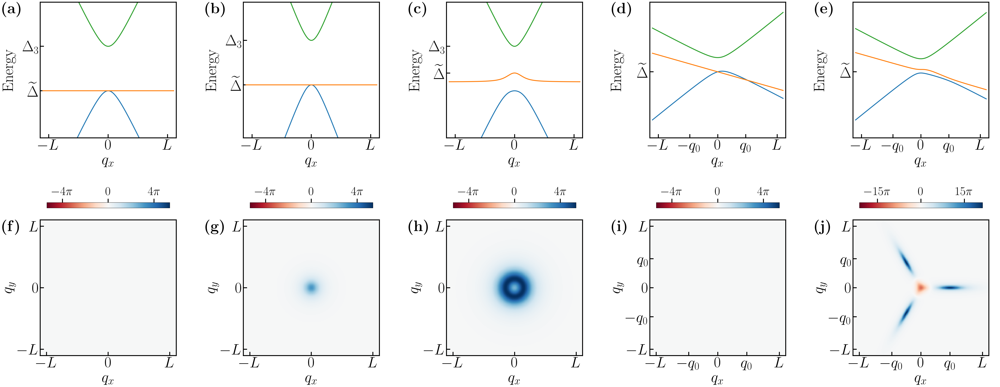

In [12]:
kappa = 1
spacing = 10^(-6)
topo_fb_paper_fig(kappa, spacing)

# Triv. flat band figures

In [53]:
function hollow_energies(delta, alpha, vF, qx, qy)
    omega = exp(im * 2 * pi/3)
    delta1 = 2 * real(delta)
    delta3 = 2 * real(conj(omega) * delta)
    delta5 = 2 * real(omega * delta)

    J = vF/2 + real(conj(omega) * alpha)

    eps_0 = delta3

    eps_m = (delta1 + delta5)/2 - 1/2 * sqrt((delta1 - delta5)^2 + 4 * J^2 * (qx^2 + qy^2))
    
    eps_p = (delta1 + delta5)/2 + 1/2 * sqrt((delta1 - delta5)^2 + 4 * J^2 * (qx^2 + qy^2))


    return [eps_m, eps_0, eps_p]
end
function hollow_vectors(delta, alpha, vF, qx, qy)
    omega = exp(im * 2 * pi/3)
    delta1 = 2 * real(delta)
    delta3 = 2 * real(conj(omega) * delta)
    delta5 = 2 * real(omega * delta)

    J = vF/2 + real(conj(omega) * alpha)

    eps_0 = delta3
    eps_m = (delta1 + delta5)/2 - 1/2 * sqrt((delta1 - delta5)^2 + 4 * J^2 * (qx^2 + qy^2))
    eps_p = (delta1 + delta5)/2 + 1/2 * sqrt((delta1 - delta5)^2 + 4 * J^2 * (qx^2 + qy^2))

    vec_0 = [0 1 0]

    vec_m = [-im*J*qy-J*qx 0 eps_p-delta5]
    vec_p = [eps_p-delta5 0 J*qx-im*J*qy]


    return [vec_m, vec_0, vec_p]
end
function hollow_berry(points, spacing, vF, delta, alpha, index)
    berry_list = Array{Float64}(undef, size(points)[1])
    for i in 1:size(points)[1]
        # get flux through plaquette centered at point
        num_vertices = 4
        states = Array{ComplexF64}(undef, num_vertices, 3)
        x0 = points[i, 1]
        y0 = points[i, 2]
        for j in 1:num_vertices
            x_new = x0 + spacing * cos(2 * pi * (j - 1) / num_vertices)
            y_new = y0 + spacing * sin(2 * pi * (j - 1) / num_vertices)
            gs = hollow_vectors(delta, alpha, vF, x_new, y_new)[index]
            states[j, :] = normalize(gs)
        end
        P = 1
        for j in 1:num_vertices
            if j < num_vertices
                temp = dot(states[j, :], states[j + 1, :])
                P *= temp
            else
                temp = dot(states[j, :], states[1, :])
                P *= temp
            end
            if temp != 0
                P /= abs(temp)
            end
        end
        if abs(imag(P)) < 10^(-16)
            berry_list[i] = -(angle(real(P))) / (area(spacing * sqrt(2), num_vertices))
        else
            berry_list[i] = -angle(P) / area(spacing * sqrt(2), num_vertices)
        end
    end
    return berry_list
end
function U1_U1_energies(delta, alpha, vF, qx, qy)
    omega = exp(im * 2 * pi/3)
    delta_tild = 2 * real(delta)
    delta3 = 2 * real(conj(omega) * delta)

    J = vF/2 + real(conj(omega) * alpha)

    eps_0 = delta3

    eps_m = delta_tild - abs(J) * sqrt(qx^2 + qy^2)
    
    eps_p = delta_tild + abs(J) * sqrt(qx^2 + qy^2)


    return [eps_m, eps_0, eps_p]
end
function triv_fb_paper_fig(kappa, spacing)
    qx_list = kappa * range(-1.1, 1.1, 10^3)
    qy = 0
    ion()
    fig, axs = plt.subplots(4, 4,figsize=(40, 20), constrained_layout=false, gridspec_kw=Dict("height_ratios" => [1.0, 0.3, 0.04, 1.0], 
    "hspace" => 0.15))
    fig.align_ylabels(axs[:, :])
    fig.align_xlabels(axs[:, :])

    for j in 1:4
        axs[1, j].set_ylabel(L"$\mathrm{Energy}$", fontsize = 50)
        axs[1, j].set_xlabel(L"$q_x$", fontsize = 50)
        axs[1, j].tick_params(axis="both", which="major", direction="in", length=12, width=3) 
        axs[1, j].set_aspect("equal", adjustable="datalim")
        
        axs[4, j].set_ylabel(L"$q_y$", fontsize = 50)
        axs[4, j].set_xlabel(L"$q_x$", fontsize = 50)
        axs[4, j].tick_params(axis="both", which="major", direction="in", length=12, width=3) 
        axs[4, j].set_aspect("equal", adjustable="datalim")
        
        axs[2, j].axis("off")
    end

    for j in 1:4
        # Set the colorbar stuff
        pos = axs[4, j].get_position()
        new_width = 0.8 * pos.width
        new_x0 = pos.x0 + 0.5 * (pos.width - new_width)
        axs[3, j].set_position([new_x0, axs[3, j].get_position().y0, new_width, axs[3, j].get_position().height])
    end

    for p in 1:4
        # U(1)xU(1), PK
        if p == 1
            delta = 0.25*exp(-1 * im * pi/3) 
            alpha = 1 * exp(2*im * pi/3)
            vF = -2 * real(exp(im * 2 * pi/3) * alpha)

            delta1 = 2 * real(delta)
            delta3 = 2 * real(exp(-2im*pi/3) * delta)
            J = vF/2 + real(exp(-2im*pi/3) * alpha)
            q0 = abs(delta3 - delta1)/abs(J)
            xticks = [-1, -q0, 0, q0, 1]
            xlabels = [L"$-L$", L"$-q_0$", L"$0$", L"$q_0$",  L"$L$"]
            axs[1, p].set_xticks(xticks, labels=xlabels, fontsize=50)
            yticks = [delta3, delta1]
            ylabels = [L"$\Delta_3$", L"$\widetilde{\Delta}$"]
            axs[1, p].set_yticks(yticks, labels=ylabels, fontsize=50)
            axs[1, p].set_ylim(-1, 0.7)

            in_ticks = [-1, -q0, 0, q0, 1]
            in_labels = [L"$-L$", L"$-q_0$", L"$0$", L"$q_0$", L"$L$"]
            cb_ticks = [-10, 0, 10]
            cb_labels = [L"$-10 \pi$", L"$0$", L"$10 \pi$"]
        # U(1)xU(1)
        elseif p == 2
            delta = 0.25*exp(-1 * im * pi/2)
            alpha = 1.4 * exp(2*im * pi/3)
            vF = -2 * real(exp(im * 2 * pi/3) * alpha)

            delta1 = 2 * real(delta)
            delta3 = 2 * real(exp(-2im*pi/3) * delta)
            delta5 = 2 * real(exp(2im*pi/3) * delta)
            J = vF/2 + real(exp(-2im*pi/3) * alpha)
            q0 = 1/abs(J) * sqrt(abs(delta3^2 + delta1 * delta5 - delta1 * delta3 - delta5 * delta3))
            xticks = [-1, -q0, 0, q0, 1]
            xlabels = [L"$-L$", L"$-q_0$", L"$0$", L"$q_0$",  L"$L$"]
            axs[1, p].set_xticks(xticks, labels=xlabels, fontsize=50)
            yticks = [delta3, 2*real(delta)]
            ylabels = [L"$\Delta_3$", L"$\Delta_1$"]
            axs[1, p].set_yticks(yticks, labels=ylabels, fontsize=50)
            axs[1, p].set_ylim(-1, 0.7)

            in_ticks = [-1, -q0, 0, q0, 1]
            in_labels = [L"$-L$", L"$-q_0$", L"$0$", L"$q_0$", L"$L$"]
            cb_ticks = [-10, 0, 10]
            cb_labels = [L"$-10 \pi$", L"$0$", L"$10 \pi$"]
        # gapped ring U(1)
        elseif p == 3
            delta = 0.25*exp(-1 * im * pi/2)
            alpha = 1.4 * exp(2*im * pi/3) + 0.1
            vF = -2 * real(exp(im * 2 * pi/3) * alpha)

            delta1 = 2 * real(delta)
            delta3 = 2 * real(exp(-2im*pi/3) * delta)
            delta5 = 2 * real(exp(2im*pi/3) * delta)
            J = vF/2 + real(exp(-2im*pi/3) * alpha)
            q0 = 1/abs(J) * sqrt(abs(delta3^2 + delta1 * delta5 - delta1 * delta3 - delta5 * delta3))
            xticks = [-1, -q0, 0, q0, 1]
            xlabels = [L"$-L$", L"$-q_0$", L"$0$", L"$q_0$",  L"$L$"]
            axs[1, p].set_xticks(xticks, labels=xlabels, fontsize=50)
            yticks = [delta3, 2*real(delta)]
            ylabels = [L"$\Delta_3$", L"$\Delta_1$"]
            axs[1, p].set_yticks(yticks, labels=ylabels, fontsize=50)
            axs[1, p].set_ylim(-1, 0.7)

            in_ticks = [-1, -q0, 0, q0, 1]
            in_labels = [L"$-L$", L"$-q_0$", L"$0$", L"$q_0$", L"$L$"]
            cb_ticks = [-30, 0, 30]
            cb_labels = [L"$-30 \pi$", L"$0$", L"$30 \pi$"]
        # dirac cones with berry U(1)
        else
            delta = 0.25*exp(-1 * im * pi/3)
            alpha = 1.4 * exp(2*im * pi/3) + 0.5
            vF = -2 * real(exp(im * 2 * pi/3) * alpha)

            delta1 = real(exp(2im*pi/3)*delta) + real(delta)
            delta3 = 2 * real(exp(-2im*pi/3) * delta)
            delta5 = 2 * real(exp(2im*pi/3) * delta)
            J = vF/2 + real(exp(-2im*pi/3) * alpha)
            q0 = abs(delta3 - delta1)/abs(J)
            xticks = [-1, -q0, 0, q0, 1]
            xlabels = [L"$-L$", L"$-q_0$", L"$0$", L"$q_0$",  L"$L$"]
            axs[1, p].set_xticks(xticks, labels=xlabels, fontsize=50)
            yticks = [delta3, 2*real(delta)]
            ylabels = [L"$\Delta_3$", L"$\tilde{\Delta}$"]
            axs[1, p].set_yticks(yticks, labels=ylabels, fontsize=50)
            axs[1, p].set_ylim(-1, 0.7)

            in_ticks = [-1, -q0, 0, q0, 1]
            in_labels = [L"$-L$", L"$-q_0$", L"$0$", L"$q_0$", L"$L$"]
            cb_ticks = [-4, 0, 4]
            cb_labels = [L"$-4 \pi$", L"$0$", L"$4 \pi$"]
        end
        energies = Array{Float64}(undef, length(qx_list), 3)
        for j in 1:length(qx_list)
            qx = qx_list[j]
            if p == 1
                vals = U1_U1_energies(delta, alpha, vF, qx, qy)
            elseif p == 2
                vals = hollow_energies(delta, alpha, vF, qx, qy)
            else
                ham = H_k_v2([qx, qy], vF) + H_mft_v2([qx, qy], delta, alpha)
                vals = eigvals(Hermitian(ham))
                # if p == 3 && qx==-1.1
                #     omega = exp(im * 2 * pi/3)
                #     pw = 1/sqrt(3) * [1 1 1; 1 omega conj(omega); 1 conj(omega) omega]
                #     display(pw* ham * transpose(conj(pw)))
                # end
            end
            energies[j, 1] = vals[1]
            energies[j, 2] = vals[2]
            energies[j, 3] = vals[3]
        end
        axs[1, p].plot(qx_list, energies[:, 1] , label = L"\epsilon_-", lw = 3)
        axs[1, p].plot(qx_list, energies[:, 2], label = L"\epsilon_0", lw = 3)
        axs[1, p].plot(qx_list, energies[:, 3], label = L"\epsilon_+", lw = 3)

        n_pts = 3*10^2
        k_list = range(-1.1, 1.1, n_pts)
        grid = mesh_grid(k_list, k_list, Float64)
        if p == 1
            bc_list = 0*bc_no_spinors(grid, spacing, vF, delta, alpha, 1)
        elseif p == 2
            bc_list = hollow_berry(grid, spacing, vF, delta, alpha, 1)
        else
            bc_list = bc_no_spinors(grid, spacing, vF, delta, alpha, 1)
        end
        grid_new = reshape(grid, (n_pts, n_pts, 2))
        bc_list_new = reshape(bc_list, (n_pts, n_pts)) / (pi)

        bc_abs = maximum(abs.([maximum(bc_list_new), minimum(bc_list_new)]))

        if p == 1
            bc_abs = 14.916281683957193
        end

        berry = axs[4, p].pcolormesh(grid_new[:, :, 1], grid_new[:, :, 2], bc_list_new, cmap="RdBu", vmin = -bc_abs, vmax = bc_abs)

        fig.tight_layout()

        cbar = fig.colorbar(berry, cax=axs[3, p], orientation="horizontal", location = "top", shrink = 0.8, pad=0.05)
        cbar.ax.tick_params(length=12, width=3, which="major", direction="out")

        axs[4, p].set_xticks(in_ticks, labels=in_labels, fontsize=50)
        axs[4, p].set_yticks(in_ticks, labels=in_labels, fontsize=50)

        if p == 2
            center = (0, 0)
            radius = q0
            circle = matplotlib.patches.Circle(center, radius, fill=false, color="orchid", linestyle="--", linewidth=4)
            axs[4, p].add_patch(circle)
        end

        cbar.set_ticks(cb_ticks)
        cbar.set_ticklabels(cb_labels, fontsize=40)
    end

    for j in 1:4
        axs[1, j].margins(x=0.02, y=0.05)
        axs[2, j].margins(x=0.02, y=0.05)
        axs[3, j].margins(x=0.02, y=0.05)
        axs[4, j].margins(x=0.02, y=0.05)
        axs[1, j].set_box_aspect(1)
        axs[4, j].set_box_aspect(1)
        for spine in axs[1, j].spines.values()
            spine.set_linewidth(3)
        end
        for spine in axs[4, j].spines.values()
            spine.set_linewidth(3)
        end
    end
    
    fig.text(-0.28, 1, L"$\textbf{(a)}$", transform=axs[1, 1].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.28, 1, L"$\textbf{(b)}$", transform=axs[1, 2].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.28, 1, L"$\textbf{(c)}$", transform=axs[1, 3].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.28, 1, L"$\textbf{(d)}$", transform=axs[1, 4].transAxes, ha="left", va="top", fontsize=50, color="k")

    fig.text(-0.28, 1, L"$\textbf{(e)}$", transform=axs[4, 1].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.28, 1, L"$\textbf{(f)}$", transform=axs[4, 2].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.28, 1, L"$\textbf{(g)}$", transform=axs[4, 3].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.28, 1, L"$\textbf{(h)}$", transform=axs[4, 4].transAxes, ha="left", va="top", fontsize=50, color="k")

    fig.tight_layout()

    fig.savefig("figs/triv_flat_bands.png", bbox_inches="tight")
    fig
end

triv_fb_paper_fig (generic function with 1 method)

sys:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
sys:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
sys:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
sys:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
sys:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


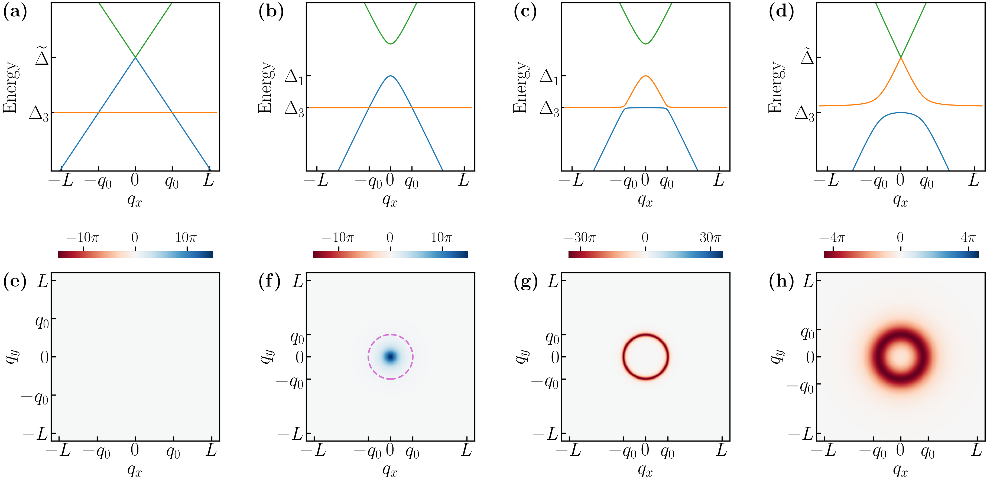

In [55]:
kappa = 1
spacing = 10^(-6)
triv_fb_paper_fig(kappa, spacing)

# Scaling figures

In [15]:
function A1_comp(delta, alpha, k, index, vF)
    x, y = k
    epsilon = vF_analytic_eigenvalues(alpha, delta, k[1], k[2], vF)[index]
    # convenience
    v = vF
    omega = exp(im * 2 * pi/ 3)
    q = k[1] + im * k[2]
    # variables
    f1 = delta + alpha * (q + conj(q))
    v1 = v * (q + conj(q))
    f3 = delta + alpha * (omega * q + conj(omega * q))
    v3 = v * (omega * q + conj(omega * q))
    f5 = delta + alpha * (conj(omega) * q + omega * conj(q))
    v5 = v * (conj(omega) * q + omega * conj(q))
    # normalization
    nmz = (((epsilon - v5) * (epsilon - v3) - abs2(f1))^2 + abs2(f1) * (abs2(f3) + abs2(f5)) + 
    2 * real(f1 * f3 * f5) * (2 * epsilon - v3 - v5) + abs2(f3) * (epsilon - v3)^2 + abs2(f5) * (epsilon - v5)^2)
    # eigenvector entries
    A1 = (epsilon - v5) * (epsilon - v3) - abs2(f1)
    
    return A1 / sqrt(nmz)
end
function A3_comp(delta, alpha, k, index, vF)
    x, y = k
    epsilon = vF_analytic_eigenvalues(alpha, delta, k[1], k[2], vF)[index]
    # convenience
    v = vF
    omega = exp(im * 2 * pi/ 3)
    q = k[1] + im * k[2]
    # variables
    f1 = delta + alpha * (q + conj(q))
    v1 = v * (q + conj(q))
    f3 = delta + alpha * (omega * q + conj(omega * q))
    v3 = v * (omega * q + conj(omega * q))
    f5 = delta + alpha * (conj(omega) * q + omega * conj(q))
    v5 = v * (conj(omega) * q + omega * conj(q))
    # normalization
    nmz = (((epsilon - v5) * (epsilon - v3) - abs2(f1))^2 + abs2(f1) * (abs2(f3) + abs2(f5)) + 
    2 * real(f1 * f3 * f5) * (2 * epsilon - v3 - v5) + abs2(f3) * (epsilon - v3)^2 + abs2(f5) * (epsilon - v5)^2)
    # eigenvector entries
    A3 = conj(f3) * (epsilon - v3) + f1 * f5
    
    return A3 / sqrt(nmz)
end
function A5_comp(delta, alpha, k, index, vF)
    x, y = k
    epsilon = vF_analytic_eigenvalues(alpha, delta, k[1], k[2], vF)[index]
    # convenience
    v = vF
    omega = exp(im * 2 * pi/ 3)
    q = k[1] + im * k[2]
    # variables
    f1 = delta + alpha * (q + conj(q))
    v1 = v * (q + conj(q))
    f3 = delta + alpha * (omega * q + conj(omega * q))
    v3 = v * (omega * q + conj(omega * q))
    f5 = delta + alpha * (conj(omega) * q + omega * conj(q))
    v5 = v * (conj(omega) * q + omega * conj(q))
    # normalization
    nmz = (((epsilon - v5) * (epsilon - v3) - abs2(f1))^2 + abs2(f1) * (abs2(f3) + abs2(f5)) + 
    2 * real(f1 * f3 * f5) * (2 * epsilon - v3 - v5) + abs2(f3) * (epsilon - v3)^2 + abs2(f5) * (epsilon - v5)^2)
    # eigenvector entries
    A5 = f5 * (epsilon - v5) + conj(f1) * conj(f3)
    
    return A5 / sqrt(nmz)
end
function d_A1(delta, alpha, k, index, vF, dmu)
    A1_0 = A1_comp(delta, alpha, k, index, vF)
    A1_x = A1_comp(delta, alpha, k .+ [dmu, 0], index, vF)
    A1_y = A1_comp(delta, alpha, k .+ [0, dmu], index, vF)
    dx_A1 = (A1_x - A1_0)/dmu
    dy_A1 = (A1_y - A1_0)/dmu

    return [dx_A1, dy_A1]
end
function d_A3(delta, alpha, k, index, vF, dmu)
    A3_0 = A3_comp(delta, alpha, k, index, vF)
    A3_x = A3_comp(delta, alpha, k .+ [dmu, 0], index, vF)
    A3_y = A3_comp(delta, alpha, k .+ [0, dmu], index, vF)
    dx_A3 = (A3_x - A3_0)/dmu
    dy_A3 = (A3_y - A3_0)/dmu

    return [dx_A3, dy_A3]
end
function d_A5(delta, alpha, k, index, vF, dmu)
    A5_0 = A5_comp(delta, alpha, k, index, vF)
    A5_x = A5_comp(delta, alpha, k .+ [dmu, 0], index, vF)
    A5_y = A5_comp(delta, alpha, k .+ [0, dmu], index, vF)
    dx_A5 = (A5_x - A5_0)/dmu
    dy_A5 = (A5_y - A5_0)/dmu

    return [dx_A5, dy_A5]
end
function d_lambda_spinor(lambda, k, dmu)
    chi_0 = lambda_spinor(lambda, k)
    chi_x = lambda_spinor(lambda, k .+ [dmu, 0])
    chi_y = lambda_spinor(lambda, k .+ [0, dmu])
    dx_chi = (chi_x - chi_0)/dmu
    dy_chi = (chi_y - chi_0)/dmu
    return [dx_chi, dy_chi]
end
function lambda_parent(lambda, kappa, V, vF, q)
    v1 = V[1, 1]
    v2 = V[2, 2]
    delta = lambda_delta(kappa, lambda, v1, v2)
    alpha = lambda_alpha(kappa, lambda, v1, v2)
    
    kappa1 = kappa * [1, 0]
    kappa3 = kappa * [cos(2*pi/3), sin(2*pi/3)]
    kappa5 = kappa * [cos(4*pi/3), sin(4*pi/3)]

    ham = H_k_v2(q, vF) + H_mft_v2(q, delta, alpha)

    t_vec = eigvecs(Hermitian(ham))[:, 1]

    vec = gauge_fix(normalize(t_vec))

    bc1 = anal_lambda_spinor_bc(lambda, kappa1 .+ q)
    bc3 = anal_lambda_spinor_bc(lambda, kappa3 .+ q)
    bc5 = anal_lambda_spinor_bc(lambda, kappa5 .+ q)

    return abs2(vec[1]) * bc1 + abs2(vec[2]) * bc3 + abs2(vec[3]) * bc5
end
function cross_term(lambda, kappa, V, vF, q)
    kappa1 = [kappa, 0]
    kappa3 = kappa * [cos(2*pi/3), sin(2*pi/3)]
    kappa5 = kappa * [cos(4*pi/3), sin(4*pi/3)]

    v1 = V[1, 1]
    v2 = V[2, 2]
    delta = lambda_delta(kappa, lambda, v1, v2)
    alpha = lambda_alpha(kappa, lambda, v1, v2)

    phi = wrap_angle(angle(delta))

    # the commented out indices are messed up
    if 0 < phi && phi <= 2*pi/3
        index = 1
    # elseif 2*pi/3 < phi || phi <= -2*pi/3
    #     index = 0 + 1
    # elseif phi > -2*pi/3 && phi <= 0
    #     index = 2 + 1
    end
    index = 1

    dmu = 10^(-4)

    ham = H_mft_v2(q, delta, alpha) + H_k_v2(q, vF)

    vec = gauge_fix(normalize(eigvecs(Hermitian(ham))[:, 1]))

    A1 = vec[1]
    grad_A1 = d_A1(delta, alpha/2, q, index, vF/2, dmu)

    A1_x = 2im * real(conj(A1) * grad_A1[1])
    A1_y = 2im * real(conj(A1) * grad_A1[2])

    A3 = vec[2]
    grad_A3 = d_A3(delta, alpha/2, q, index, vF/2, dmu)
    A3_x = 2im * real(conj(A3) * grad_A3[1])
    A3_y = 2im * real(conj(A3) * grad_A3[2])

    A5 = vec[3]
    grad_A5 = d_A5(delta, alpha/2, q, index, vF/2, dmu)
    A5_x = 2im * real(conj(A5) * grad_A5[1])
    A5_y = 2im * real(conj(A5) * grad_A5[2])

    chi1 = lambda_spinor(lambda, kappa1 .+ q)
    grad_chi1 = d_lambda_spinor(lambda, kappa1 .+ q, dmu)
    chi1_x = dot(chi1, grad_chi1[1])
    chi1_y = dot(chi1, grad_chi1[2])

    chi3 = lambda_spinor(lambda, kappa3 .+ q)
    grad_chi3 = d_lambda_spinor(lambda, kappa3 .+ q, dmu)
    chi3_x = dot(chi3, grad_chi3[1])
    chi3_y = dot(chi3, grad_chi3[2])

    chi5 = lambda_spinor(lambda, kappa5 .+ q)
    grad_chi5 = d_lambda_spinor(lambda, kappa5 .+ q, dmu)
    chi5_x = dot(chi5, grad_chi5[1])
    chi5_y = dot(chi5, grad_chi5[2])

    return real((A1_x * chi1_y - A1_y * chi1_x) + (A3_x * chi3_y - A3_y * chi3_x) + (A5_x * chi5_y - A5_y * chi5_x))
end
function pure_3_patch(lambda, kappa, V, vF, q)
    v1 = V[1, 1]
    v2 = V[2, 2]
    delta = lambda_delta(kappa, lambda, v1, v2)
    alpha = lambda_alpha(kappa, lambda, v1, v2)
    return bc_no_spinors(reshape(q, (1, 2)), 10^(-6), vF, delta, alpha, 1)[1]
end
function scaling_paper_fig(kappa, V, lambda)
    qx_list = kappa * range(-1.1, 1.1, 10^3)
    qy = 0
    v1 = V[1, 1]
    v2 = V[2, 2]
    delta = lambda_delta(kappa, lambda, v1, v2)
    alpha = lambda_alpha(kappa, lambda, v1, v2)
    
    ion()
    fig, axs = plt.subplots(1, 2,figsize=(20, 10), constrained_layout=false)
    fig.align_ylabels(axs[:, :])
    fig.align_xlabels(axs[:, :])

    for j in 1:2
        axs[j].set_ylabel(L"$|\Omega|$", fontsize = 60)
        axs[j].set_xlabel(L"$q_x$", fontsize = 60)
        axs[j].tick_params(axis="both", which="major", direction="in", length=12, width=3) 
        axs[j].set_yscale("log")
    end

    for p in 1:2
        if p == 1
            vF = 10^(0.5) * abs(alpha)
        else
            vF = 10^(-0.5) * abs(alpha)
        end
        scalings = Array{Float64}(undef, 4, length(qx_list))
        for j in 1:length(qx_list)
            qx = qx_list[j]
            q = [qx, qy]
    
            scalings[1, j] = abs(lambda_parent(lambda, kappa, V, vF, q))
            scalings[2, j] = abs(cross_term(lambda, kappa, V, vF, q))
            scalings[3, j] = abs(pure_3_patch(lambda, kappa, V, vF, q))
            scalings[4, j] = lambda_patch_bc(reshape(q, (1, 2)), 10^(-6), lambda, kappa, vF, delta, alpha, 1)[1]
        end
        colors = ["#0072B2", "#D55E00", "#000000"]
        axs[p].plot(qx_list, scalings[1, :], label = L"$|\Omega^\mathrm{par}|$", lw = 3, c = colors[1])
        axs[p].plot(qx_list, scalings[2, :], label = L"$|\Omega^\times|$", lw = 3, c = colors[2])
        axs[p].plot(qx_list, scalings[3, :], label = L"$|\widetilde{\Omega}|$", lw = 3, c = colors[3])

        xticks = [-kappa, 0, kappa]
        xlabels = [L"$-\kappa$", L"$0$", L"$\kappa$"]
        yticks = [10^(-2), 10^(0), 10^(2), 10^(4)]
        ylabels = [L"$10^{-2}$", L"$10^{0}$", L"$10^{2}$", L"$10^{4}$"]

        axs[p].set_xticks(xticks, labels=xlabels, fontsize=55)
        axs[p].set_yticks(yticks, labels=ylabels, fontsize=55)
        axs[p].minorticks_off()
        if p == 1
            leg = axs[p].legend(
            fontsize=55,
            frameon=true,
            facecolor="white",
            framealpha=0.85,
            edgecolor="none",
            handlelength=1.8,
            handletextpad=0.5,
            borderpad=0.3)
            for line in leg.get_lines()
                line.set_linewidth(5)
            end
        end
    end

    for j in 1:2
        axs[j].margins(x=0.02, y=0.05)
        axs[j].set_box_aspect(1)
        for spine in axs[j].spines.values()
            spine.set_linewidth(3)
        end
    end
    
    fig.text(-0.23, 1, L"$\textbf{(a)}$", transform=axs[1].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.23, 1, L"$\textbf{(b)}$", transform=axs[2].transAxes, ha="left", va="top", fontsize=50, color="k")

    fig.tight_layout()

    fig.savefig("figs/scalings.png", bbox_inches="tight")
    fig
end

scaling_paper_fig (generic function with 1 method)

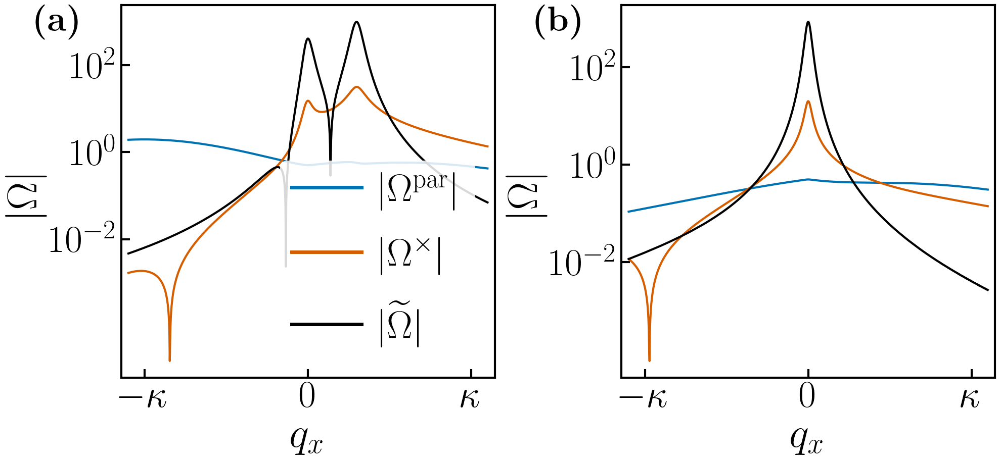

In [16]:
kappa = 1
V = [[-1, 0] [0, -1]]
lambda = 0.99/kappa
scaling_paper_fig(kappa, V, lambda)

# $n = 2$ comparison figures

In [17]:
function lambda_epsilon_v3(k, n, kappa, gap, vF)
    return (2/n) * vF * sqrt(1 + abs2(gap)) * kappa * sqrt((norm(k)/kappa)^n + abs2(gap))
end
function lambda_ham_v3!(g1, g2, shell_parts, partitions, part_1s, dict, ham, k, lambda, n, gap, vF, V)
    kappa = norm(g2)/sqrt(3)
    # connect all lower order mBZ's to their nn
    for i in 1:length(partitions)
        part_i = partitions[i]
        idex = dict[part_i]
        for j in 1:7
            part_j = part_1s[j]
            gi = part_i[1] * g1 + part_i[2] * g2
            gj = gi .+ part_j[1] * g1 + part_j[2] * g2
            jdex = dict[part_i .+ part_j]
            if part_j != (0, 0)
                val = 1/2 * lambda_ff(V, lambda, k .+ gi, k .+ gj)
                ham[idex, jdex] = val
                ham[jdex, idex] = conj(val)
            end
        end
    end
    # connect outside ring of mBZ's together
    outer_ring = setdiff(shell_parts, partitions)
    for i in 1:length(outer_ring)
        part_i = outer_ring[i]
        idex = dict[part_i]
        for j in 1:7
            part_j = part_1s[j]
            gi = part_i[1] * g1 + part_i[2] * g2
            gj = gi .+ part_j[1] * g1 + part_j[2] * g2
            if (part_i .+ part_j) in outer_ring && part_j != (0, 0)
                jdex = dict[part_i .+ part_j]
                val = 1/2 * lambda_ff(V, lambda, k .+ gi, k .+ gj)
                ham[idex, jdex] = val
                ham[jdex, idex] = conj(val)
            end
        end
    end
    # add in kinetic terms
    for i in 1:length(shell_parts)
        part = shell_parts[i]
        idex = dict[part]
        gi = part[1] * g1 + part[2] * g2
        ham[idex, idex] = lambda_epsilon_v3(gi .+ k, n, kappa, gap, vF)
    end
    return ham
end
function lambda_mBZ_bc_v3!(g1, g2, num_vertices, plaq_area, shell_parts, partitions, part_1s, dict, ham, spinors, grounds, k, lambda, n, gap, vF, kappa, V, shells, index, spacing)
    for j in 1:num_vertices
        x_new = k[1] + spacing * cos(2 * pi * (j - 1) / num_vertices)
        y_new = k[2] + spacing * sin(2 * pi * (j - 1) / num_vertices)
        ham = lambda_ham_v3!(g1, g2, shell_parts, partitions, part_1s, dict, ham, [x_new, y_new], lambda, n, gap, vF, V)
        grounds[j, :] = gauge_fix(normalize(eigvecs(Hermitian(ham))[:, index]))
        for m in 1:length(shell_parts)
            momentum = g1 * shell_parts[m][1] + g2 * shell_parts[m][2] + [x_new, y_new]
            spinors[j, m, :] = lambda_spinor(lambda, momentum)
        end
    end
    P = 1
    for j in 1:num_vertices
        if j < num_vertices
            temp = spinor_inner(grounds[j, :], grounds[j + 1, :], spinors[j, :, :], spinors[j + 1, :, :])
            P *= temp / abs(temp)
        else
            temp = spinor_inner(grounds[j, :], grounds[1, :], spinors[j, :, :], spinors[1, :, :])
            P *= temp / abs(temp)
        end
    end
    if abs(imag(P)) < 10^(-16)
        return -(angle(real(P))) / plaq_area
    else
        return -angle(P) / plaq_area
    end
end
function grid_bc_v3(grid, lambda, n, gap, vF, kappa, V, shells, index, spacing)
    num_vertices = 4

    mBZ_count = num_mBZ(shells)
    shell_parts = sgn_parts(shells)
    partitions = sgn_parts(shells - 1)
    part_1s = sgn_parts(1)
    dict = part_dict(shells)

    ham = zeros(ComplexF64, mBZ_count, mBZ_count)
    spinors = Array{ComplexF64}(undef, num_vertices, mBZ_count, 2)
    grounds = Array{ComplexF64}(undef, num_vertices, mBZ_count)
    plaq_area = area(spacing * sqrt(2), num_vertices)

    g1 = kappa * sqrt(3) * [-sqrt(3)/2, 1/2]
    g2 = kappa * sqrt(3) * [0, 1]

    gi = zeros(2)
    gj = zeros(2)

    berry_list = Array{Float64}(undef, size(grid, 1))

    for i in 1:size(grid, 1)
        berry_list[i] = lambda_mBZ_bc_v3!(g1, g2, num_vertices, plaq_area, shell_parts, partitions, part_1s, dict, ham, spinors, grounds, 
        grid[i, :], lambda, n, gap, vF, kappa, V, shells, index, spacing)
    end
    return berry_list
end
function lambda_ham_v3(k, lambda, n, gap, vF, kappa, V, shells)
    mBZ_count = num_mBZ(shells)
    ham = zeros(ComplexF64, mBZ_count, mBZ_count)
    shell_parts = sgn_parts(shells)
    partitions = sgn_parts(shells - 1)
    part_1s = sgn_parts(1)
    dict = part_dict(shells)
    g1 = kappa * sqrt(3) * [-sqrt(3)/2, 1/2]
    g2 = kappa * sqrt(3) * [0, 1]
    lambda_ham_v3!(g1, g2, shell_parts, partitions, part_1s, dict, ham, k, lambda, n, gap, vF, V)
end
function n2_corr_paper_fig(spacing, n, gap, index, kappa, V, shells, k_mag)
    v1 = V[1, 1]
    v2 = V[2, 2]
    ion()
    fig, axs = plt.subplots(2, 3,figsize=(30, 20), constrained_layout=false, gridspec_kw=Dict("hspace" => 0.15))
    fig.align_ylabels(axs[:, :])
    fig.align_xlabels(axs[:, :])
    xticks = [-2/3, 0, 2/3]
    xlabels = [L"-\frac{2 \pi}{3}", L"0", L"\frac{2 \pi}{3}"]
    for j in 1:3
        axs[1, j].set_ylabel(L"$\Omega$", fontsize=70)
        #axs[1, j].set_xlabel(L"$\arg(q)$", fontsize=70)
        axs[1, j].tick_params(axis="both", which="major", direction="in", length=16, width=4) 
        #axs[1, j].set_aspect("equal", adjustable="datalim")

        axs[2, j].set_ylabel(L"$\Omega$", fontsize=70)
        axs[2, j].set_xlabel(L"$\arg(q)$", fontsize=70)
        axs[2, j].tick_params(axis="both", which="major", direction="in", length=16, width=4) 
        #axs[2, j].set_aspect("equal", adjustable="datalim")

        axs[1, j].set_xticks(xticks, labels=["", "", ""], fontsize=70)
        axs[1, j].set_yticks([])
        axs[2, j].set_xticks(xticks, labels=xlabels, fontsize=75)
        axs[2, j].set_yticks([])
    end

    lambda1 = 0.8
    lambda2 = 1.2

    delta1 = 1/2 * lambda_delta(kappa, lambda1, v1, v2)
    alpha1 = 1/2 * lambda_alpha(kappa, lambda1, v1, v2)

    delta2 = 1/2 * lambda_delta(kappa, lambda2, v1, v2)
    alpha2 = 1/2 * lambda_alpha(kappa, lambda2, v1, v2)

    for p in 1:3
        #axs[1, p].sharex(axs[2, p])
        if p == 1
            vF = 1
        elseif p == 2
            vF = 10
        else
            vF = 100
        end
        n_pts = 10^3
        angs = range(-pi, pi, n_pts)
        berry_list = Array{Float64}(undef, n_pts, 2, 2)

        kappa_1 = kappa * [1, 0]

        for j in 1:n_pts
            mom = k_mag * [cos(angs[j]), sin(angs[j])]
            mBZ_mom = kappa_1 .+ mom
    
            berry_list[j, 1, 1] = grid_bc_v3(reshape(mBZ_mom, (1, 2)), lambda1, n, gap, vF, kappa, V, shells, index, spacing)[1]
            berry_list[j, 1, 2] = lambda_patch_bc(reshape(mom, (1, 2)), spacing, lambda1, kappa, vF, delta1, alpha1, 1)[1]
            
            berry_list[j, 2, 1] = grid_bc_v3(reshape(mBZ_mom, (1, 2)), lambda2, n, gap, vF, kappa, V, shells, index, spacing)[1]
            berry_list[j, 2, 2] = lambda_patch_bc(reshape(mom, (1, 2)), spacing, lambda2, kappa, vF, delta2, alpha2, 1)[1]
        end

        axs[1, p].plot(angs/pi, berry_list[:, 1, 1]/pi, label = L"$\Omega^\mathrm{quad}$", lw=3)
        axs[1, p].plot(angs/pi, berry_list[:, 1, 2]/pi, label = L"$\Omega^\mathrm{tot}$", lw=3)

        axs[2, p].plot(angs/pi, berry_list[:, 2, 1]/pi, label = L"$\Omega^\mathrm{quad}$", lw=3)
        axs[2, p].plot(angs/pi, berry_list[:, 2, 2]/pi, label = L"$\Omega^\mathrm{tot}$", lw=3)

        if p == 1
            axs[1, p].legend(
                fontsize=80,
                handlelength=1.0,
                handletextpad=0.3,
                borderpad=0.2,
                labelspacing=0.3,
                loc="center"
            )
        end
    end

    for j in 1:3
        axs[1, j].margins(x=0.02, y=0.05)
        axs[2, j].margins(x=0.02, y=0.05)
        
        axs[1, j].set_box_aspect(1)
        axs[2, j].set_box_aspect(1)

        for spine in axs[1, j].spines.values()
            spine.set_linewidth(3)
        end
        for spine in axs[2, j].spines.values()
            spine.set_linewidth(3)
        end
    end
    
    fig.text(-0.18, 1, L"$\textbf{(a)}$", transform=axs[1, 1].transAxes, ha="left", va="top", fontsize=60, color="k")
    fig.text(-0.18, 1, L"$\textbf{(b)}$", transform=axs[1, 2].transAxes, ha="left", va="top", fontsize=60, color="k")
    fig.text(-0.18, 1, L"$\textbf{(c)}$", transform=axs[1, 3].transAxes, ha="left", va="top", fontsize=60, color="k")

    fig.text(-0.18, 1, L"$\textbf{(d)}$", transform=axs[2, 1].transAxes, ha="left", va="top", fontsize=60, color="k")
    fig.text(-0.18, 1, L"$\textbf{(e)}$", transform=axs[2, 2].transAxes, ha="left", va="top", fontsize=60, color="k")
    fig.text(-0.18, 1, L"$\textbf{(f)}$", transform=axs[2, 3].transAxes, ha="left", va="top", fontsize=60, color="k")

    fig.tight_layout()

    fig.savefig("figs/n=2_corr.png", bbox_inches="tight")
    fig
end

n2_corr_paper_fig (generic function with 1 method)

sys:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


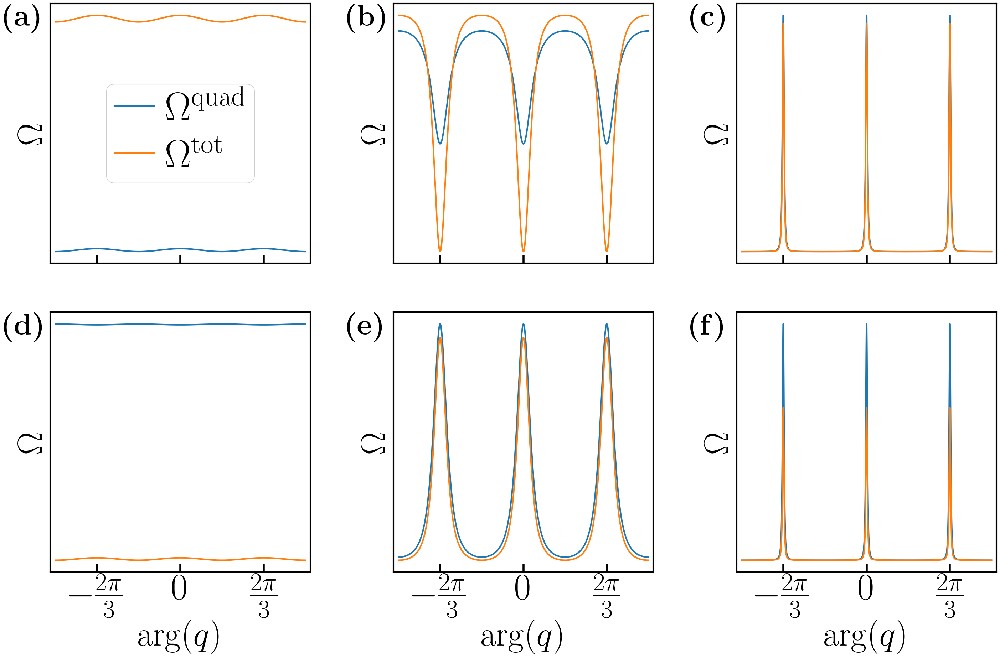

In [18]:
spacing = 10^(-3)
n = 4
kappa = 1
V = [[-1, 0] [0, -1]]
shells = 5
gap = 10
index = 1
k_mag = 0.1 * kappa
n2_corr_paper_fig(spacing, n, gap, index, kappa, V, shells, k_mag)

# $n = 2$ Berry curvature figures

In [21]:
function bc_save_data_n_disp(lambda, n, vF, gap, kappa, V, shells, index, spacing, n_pts, grid, filename)
    bc_list = grid_bc_v3(grid, lambda, n, gap, vF, kappa, V, shells, index, spacing)
    grid_new = reshape(grid, (n_pts, n_pts, 2))
    bc_list_new = reshape(bc_list, (n_pts, n_pts))

    data = Dict("grid" => grid_new, "berry" => bc_list_new, "lambda" => lambda, "n" => n, "vF" => vF, "gap" => gap, "kappa" => kappa, 
    "V" => V, "shells" => shells, "index" => index, "spacing" => spacing)

    @save filename data
end
function gen_file_name(lambda, n, vF, gap, kappa, V, shells, index, spacing)
    v1 = V[1, 1]
    v2 = V[2, 2]
    return "/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/notebooks/lambda_jellium/figure_folder/n_disp_data/100_data_($lambda, $n, $vF, $v1, $v2).jld2"
end
function bc_data_gen(lambda, n, vF, gap, kappa, V, shells, index, spacing, shift_mag, n_pts)
    kx_list = range(kappa - shift_mag, kappa + shift_mag, n_pts)
    ky_list = shift_mag * range(-1, 1, n_pts)
    grid = mesh_grid(kx_list, ky_list, Float64)

    filename = gen_file_name(lambda, n, vF, gap, kappa, V, shells, index, spacing)

    bc_save_data_n_disp(lambda, n, vF, gap, kappa, V, shells, index, spacing, n_pts, grid, filename)
end
function batch_bc_data_gen(lambda_list, n_list, vF_list, gap, kappa, V, shells, index, spacing, shift_mag, n_pts)
    for i in 1:length(lambda_list)
        lambda = lambda_list[i]
        for j in 1:length(n_list)
            n = n_list[j]
            for k in 1:length(vF_list)
                vF = vF_list[k]
                bc_data_gen(lambda, n, vF, gap, kappa, V, shells, index, spacing, shift_mag, n_pts)
            end
        end
    end
end
function bc_load_data(lambda, n, vF, gap, kappa, V, shells, index, spacing)
    filename = gen_file_name(lambda, n, vF, gap, kappa, V, shells, index, spacing)
    
    data = JLD2.load(filename)["data"]

    return data
end
function batch_bc_load_data(lambda_list, n_list, vF_list, gap, kappa, V, shells, index, spacing)
    data_set = []
    for i in 1:length(lambda_list)
        lambda = lambda_list[i]
        for j in 1:length(n_list)
            n = n_list[j]
            for k in 1:length(vF_list)
                vF = vF_list[k]
                data = bc_load_data(lambda, n, vF, gap, kappa, V, shells, index, spacing)
                push!(data_set, data)
            end
        end
    end
    return data_set
end
function n2_berry_paper_fig(shift_mag, kappa, shells, gap, n, V, spacing)
    ion()
    fig, axs = plt.subplots(5, 2,figsize=(20, 20), constrained_layout=false, gridspec_kw=Dict("height_ratios" => [0.04, 1.0, 0.4, 0.04, 1.0], 
    "hspace" => 0.05, "width_ratios" => [1.0, 1.0]))
    fig.align_ylabels(axs[[2, 5], :])
    fig.align_xlabels(axs[[2, 5], :])

    for j in 1:2
        axs[2, j].set_ylabel(L"$q_y$", fontsize = 60)
        axs[2, j].set_xlabel(L"$q_x$", fontsize = 60)
        axs[2, j].tick_params(axis="both", which="major", direction="in", length=12, width=3) 
        axs[2, j].set_aspect("equal", adjustable="datalim")
        
        axs[5, j].set_ylabel(L"$q_y$", fontsize = 60)
        axs[5, j].set_xlabel(L"$q_x$", fontsize = 60)
        axs[5, j].tick_params(axis="both", which="major", direction="in", length=12, width=3) 
        axs[5, j].set_aspect("equal", adjustable="datalim")
        
        axs[3, j].axis("off")
    end
    # Set the colorbar stuff
    pos = axs[2, 1].get_position()
    new_width = 0.8 * pos.width
    new_x0 = pos.x0 + 0.5 * (pos.width - new_width)
    axs[1, 1].set_position([new_x0, axs[1, 1].get_position().y0, new_width, axs[1, 1].get_position().height])

    pos = axs[2, 2].get_position()
    new_width = 0.8 * pos.width
    new_x0 = pos.x0 + 0.5 * (pos.width - new_width)
    axs[1, 2].set_position([new_x0, axs[1, 2].get_position().y0, new_width, axs[1, 2].get_position().height])

    pos = axs[5, 1].get_position()
    new_width = 0.8 * pos.width
    new_x0 = pos.x0 + 0.5 * (pos.width - new_width)
    axs[4, 1].set_position([new_x0, axs[4, 1].get_position().y0, new_width, axs[4, 1].get_position().height])

    pos = axs[5, 2].get_position()
    new_width = 0.8 * pos.width
    new_x0 = pos.x0 + 0.5 * (pos.width - new_width)
    axs[4, 2].set_position([new_x0, axs[4, 2].get_position().y0, new_width, axs[4, 2].get_position().height])


    
    vF = 3
    lambda1 = 0.8
    lambda2 = 1.2

    # quadratic dispersion
    hex1 = hex_outline(kappa * [0, 0], kappa, 10^(-5))
    hex2 = hex_outline(kappa * [0, 0] + [3*kappa/2, kappa*sqrt(3)/2], kappa, 10^(-5))
    hex3 = hex_outline(kappa * [0, 0] + [3*kappa/2, -kappa*sqrt(3)/2], kappa, 10^(-5))

    points_x = []
    points_y = []

    fac = 1

    kx_llm = kappa - fac*shift_mag
    kx_ulm = kappa + fac*shift_mag

    ky_llm = -fac*shift_mag
    ky_ulm = fac*shift_mag

    for j in 1:length(hex1[:, 1])
        if kx_llm <= hex1[j, 1] &&  hex1[j, 1] <= kx_ulm
            if ky_llm <= hex1[j, 2] && hex1[j, 2] <= ky_ulm
                append!(points_x, hex1[j, 1])
                append!(points_y, hex1[j, 2])
            end
        end
        if kx_llm <= hex2[j, 1] && hex2[j, 1] <= kx_ulm
            if ky_llm <= hex2[j, 2] && hex2[j, 2] <= ky_ulm
                append!(points_x, hex2[j, 1])
                append!(points_y, hex2[j, 2])
            end
        end
        if kx_llm <= hex3[j, 1] && hex3[j, 1] <= kx_ulm
            if ky_llm <= hex3[j, 2] && hex3[j, 2] <= ky_ulm
                append!(points_x, hex3[j, 1])
                append!(points_y, hex3[j, 2])
            end
        end
    end
    index = 1

    data1 = bc_load_data(lambda1, n, vF, gap, kappa, V, shells, 1, spacing)
    grid1 = data1["grid"]
    bc_list1 = data1["berry"] / (pi)
    bc_abs1 = maximum(abs.([maximum(bc_list1), minimum(bc_list1)]))

    data2 = bc_load_data(lambda2, n, vF, gap, kappa, V, shells, 1, spacing)
    grid2 = data2["grid"]
    bc_list2 = data2["berry"] / (pi)
    bc_abs2 = maximum(abs.([maximum(bc_list2), minimum(bc_list2)]))
    

    berry1 = axs[2, 1].pcolormesh(grid1[:, :, 1], grid1[:, :, 2], bc_list1, cmap="RdBu", vmin = -bc_abs1, vmax = bc_abs1)
    cbar1 = fig.colorbar(berry1, cax=axs[1, 1], orientation="horizontal", location = "top", pad=0.05, use_gridspec=true)
    cbar1.ax.tick_params(length=12, width=3, which="major", direction="out")
    cbar1.set_ticks([-6, 0, 6])
    cbar1.set_ticklabels([L"$-6 \pi$", L"$0$", L"$6 \pi$"], fontsize=40)

    berry2 = axs[2, 2].pcolormesh(grid1[:, :, 1], grid1[:, :, 2], bc_list2, cmap="RdBu", vmin = -bc_abs2, vmax = bc_abs2)
    cbar2 = fig.colorbar(berry2, cax=axs[1, 2], orientation="horizontal", location = "top", pad=0.05, use_gridspec=true)
    cbar2.ax.tick_params(length=12, width=3, which="major", direction="out")
    cbar2.set_ticks([-30, 0, 30])
    cbar2.set_ticklabels([L"$-30 \pi$", L"$0$", L"$30 \pi$"], fontsize=40)
    

    x_ticks = [0.5, 1, 1.5]
    x_labels = [L"$1/2$", L"$1$", L"$3/2$"]
    axs[2, 1].set_xticks(x_ticks, labels=x_labels, fontsize=40)
    axs[2, 2].set_xticks(x_ticks, labels=x_labels, fontsize=40)

    y_ticks = [-0.5, 0, 0.5]
    y_labels = [L"$-1/2$", L"$0$", L"$1/2$"]
    axs[2, 1].set_yticks(y_ticks, labels=y_labels, fontsize=40)
    axs[2, 2].set_yticks(y_ticks, labels=y_labels, fontsize=40)

    # plot hexagons
    alph = 0.02
    s = 0.3
    c = "maroon"
    linestyle = "-"
    marker = "o"
    axs[2, 1].scatter(points_x, points_y, s = s, alpha=alph, c=c, linestyle=linestyle, marker=marker)
    axs[2, 2].scatter(points_x, points_y, s = s, alpha=alph, c=c, linestyle=linestyle, marker=marker)





    fac = 0.6
    n_pts = 10^2
    k_list = fac * range(-1, 1, n_pts)
    grid = mesh_grid(k_list, k_list, Float64)

    hex1 = hex_outline([-1, 0], kappa, 10^(-5))
    hex2 = hex_outline([-1, 0] + [3*kappa/2, kappa*sqrt(3)/2], kappa, 10^(-5))
    hex3 = hex_outline([-1, 0] + [3*kappa/2, -kappa*sqrt(3)/2], kappa, 10^(-5))

    trunc_hex1 = zeros(size(hex1))
    trunc_hex2 = zeros(size(hex2))
    trunc_hex3 = zeros(size(hex3))
    shift = fac * kappa * range(-1, 1, 10^2)
    for j in 1:length(hex1[:, 1])
        if shift[1] <= hex1[j, 1] &&  hex1[j, 1] <= shift[n_pts]
            if shift[1] <= hex1[j, 2] && hex1[j, 2] <= shift[n_pts]
                trunc_hex1[j, : ] = hex1[j, :]
            end
        end
        if shift[1] <= hex2[j, 1] && hex2[j, 1] <= shift[n_pts]
            if shift[1] <= hex2[j, 2] && hex2[j, 2] <= shift[n_pts]
                trunc_hex2[j, : ] = hex2[j, :]
            end
        end
        if shift[1] <= hex3[j, 1] && hex3[j, 1] <= shift[n_pts]
            if shift[1] <= hex3[j, 2] && hex3[j, 2] <= shift[n_pts]
                trunc_hex3[j, : ] = hex3[j, :]
            end
        end
    end
    trunc_hex1 = reshape(trunc_hex1, (:, 2))
    trunc_hex2 = reshape(trunc_hex2, (:, 2))
    trunc_hex3 = reshape(trunc_hex3, (:, 2))

    grid_new = reshape(grid, (n_pts, n_pts, 2))

    delta1 = lambda_delta(kappa, lambda1, V[1, 1], V[2, 2])/2
    alpha1 = lambda_alpha(kappa, lambda1, V[1, 1], V[2, 2])/2
    bc_list1 = bc_no_spinors(grid, spacing, vF, delta1, alpha1, 1)
    bc_list_new1 = reshape(bc_list1, (n_pts, n_pts)) / (pi)
    bc_abs1 = maximum(abs.([maximum(bc_list_new1), minimum(bc_list_new1)]))

    delta2 = lambda_delta(kappa, lambda2, V[1, 1], V[2, 2])/2
    alpha2 = lambda_alpha(kappa, lambda2, V[1, 1], V[2, 2])/2
    bc_list2 = bc_no_spinors(grid, spacing, vF, delta2, alpha2, 1)
    bc_list_new2 = reshape(bc_list2, (n_pts, n_pts)) / (pi)
    bc_abs2 = maximum(abs.([maximum(bc_list_new2), minimum(bc_list_new2)]))

    berry1 = axs[5, 1].pcolormesh(grid_new[:, :, 1], grid_new[:, :, 2], bc_list_new1, cmap="RdBu", vmin = -bc_abs1, vmax = bc_abs1)
    cbar1 = fig.colorbar(berry1, cax=axs[4, 1], orientation="horizontal", location = "top", pad=0.05, use_gridspec=true)
    cbar1.ax.tick_params(length=12, width=3, which="major", direction="out")
    cbar1.set_ticks([-6, 0, 6])
    cbar1.set_ticklabels([L"$-6 \pi$", L"$0$", L"$6 \pi$"], fontsize=40)

    berry2 = axs[5, 2].pcolormesh(grid_new[:, :, 1], grid_new[:, :, 2], bc_list_new2, cmap="RdBu", vmin = -bc_abs2, vmax = bc_abs2)
    cbar2 = fig.colorbar(berry2, cax=axs[4, 2], orientation="horizontal", location = "top", pad=0.05, use_gridspec=true)
    cbar2.ax.tick_params(length=12, width=3, which="major", direction="out")
    cbar2.set_ticks([-10, 0, 10])
    cbar2.set_ticklabels([L"$-10 \pi$", L"$0$", L"$10 \pi$"], fontsize=40)

    x_ticks = [-0.5, 0, 0.5]
    x_labels = [L"$1/2$", L"$1$", L"$3/2$"]
    axs[5, 1].set_xticks(x_ticks, labels=x_labels, fontsize=40)
    axs[5, 2].set_xticks(x_ticks, labels=x_labels, fontsize=40)

    y_ticks = [-0.5, 0, 0.5]
    y_labels = [L"$-1/2$", L"$0$", L"$1/2$"]
    axs[5, 1].set_yticks(y_ticks, labels=y_labels, fontsize=40)
    axs[5, 2].set_yticks(y_ticks, labels=y_labels, fontsize=40)

    axs[5, 1].scatter(trunc_hex1[:, 1], trunc_hex1[:, 2], s = s, alpha=alph, c=c, linestyle=linestyle, marker=marker)
    axs[5, 1].scatter(trunc_hex2[:, 1], trunc_hex2[:, 2], s = s, alpha=alph, c=c, linestyle=linestyle, marker=marker)
    axs[5, 1].scatter(trunc_hex3[:, 1], trunc_hex3[:, 2], s = s, alpha=alph, c=c, linestyle=linestyle, marker=marker)
    axs[5, 2].scatter(trunc_hex1[:, 1], trunc_hex1[:, 2], s = s, alpha=alph, c=c, linestyle=linestyle, marker=marker)
    axs[5, 2].scatter(trunc_hex2[:, 1], trunc_hex2[:, 2], s = s, alpha=alph, c=c, linestyle=linestyle, marker=marker)
    axs[5, 2].scatter(trunc_hex3[:, 1], trunc_hex3[:, 2], s = s, alpha=alph, c=c, linestyle=linestyle, marker=marker)
            
        
    axs[1, 1].margins(0)
    axs[1, 2].margins(0)
    axs[4, 1].margins(0)
    axs[4, 2].margins(0)
    
    axs[2, 1].margins(x=0.02, y=0.05)
    axs[2, 2].margins(x=0.02, y=0.05)
    axs[5, 1].margins(x=0.02, y=0.05)
    axs[5, 2].margins(x=0.02, y=0.05)

    axs[2, 1].set_box_aspect(1)
    axs[2, 2].set_box_aspect(1)
    axs[5, 1].set_box_aspect(1)
    axs[5, 2].set_box_aspect(1)

    for spine in axs[2, 1].spines.values()
        spine.set_linewidth(3)
    end
    for spine in axs[2, 2].spines.values()
        spine.set_linewidth(3)
    end
    for spine in axs[5, 1].spines.values()
        spine.set_linewidth(3)
    end
    for spine in axs[5, 2].spines.values()
        spine.set_linewidth(3)
    end
    
    fig.text(-0.25, 1 + 0.1, L"$\textbf{(a)}$", transform=axs[2, 1].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.25, 1 + 0.1, L"$\textbf{(b)}$", transform=axs[2, 2].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.25, 1 + 0.1, L"$\textbf{(c)}$", transform=axs[5, 1].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.25, 1 + 0.1, L"$\textbf{(d)}$", transform=axs[5, 2].transAxes, ha="left", va="top", fontsize=50, color="k")

    fig.tight_layout()

    fig.savefig("figs/n2_berry.png", bbox_inches="tight")
    fig
end

n2_berry_paper_fig (generic function with 1 method)

sys:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


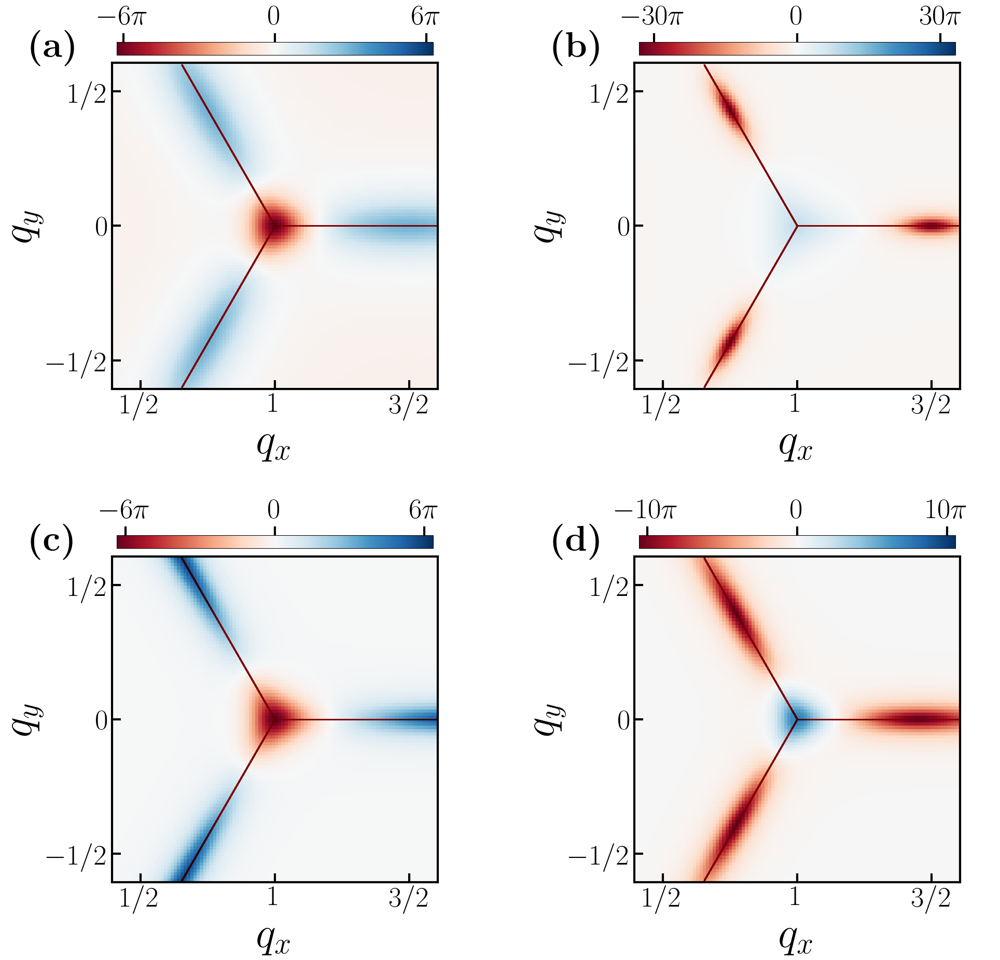

In [22]:
kappa = 1
shells = 5
gap = 10
n = 4
spacing = 10^(-2.5)
V = [[-1, 0] [0, -1]]
shift_mag = 0.6 * kappa
n2_berry_paper_fig(shift_mag, kappa, shells, gap, n, V, spacing)

# $n = 11$ Berry curvature figures

In [23]:
function bc_save_data_n_disp(lambda, n, vF, gap, kappa, V, shells, index, spacing, n_pts, grid, filename)
    bc_list = grid_bc_v3(grid, lambda, n, gap, vF, kappa, V, shells, index, spacing)
    grid_new = reshape(grid, (n_pts, n_pts, 2))
    bc_list_new = reshape(bc_list, (n_pts, n_pts))

    data = Dict("grid" => grid_new, "berry" => bc_list_new, "lambda" => lambda, "n" => n, "vF" => vF, "gap" => gap, "kappa" => kappa, 
    "V" => V, "shells" => shells, "index" => index, "spacing" => spacing)

    @save filename data
end
function gen_file_name(lambda, n, vF, gap, kappa, V, shells, index, spacing)
    v1 = V[1, 1]
    v2 = V[2, 2]
    return "/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/notebooks/lambda_jellium/figure_folder/n_disp_data/1000_data_($lambda, $n, $vF, $v1, $v2).jld2"
end
function bc_data_gen(lambda, n, vF, gap, kappa, V, shells, index, spacing, shift_mag, n_pts)
    kx_list = range(kappa - shift_mag, kappa + shift_mag, n_pts)
    ky_list = shift_mag * range(-1, 1, n_pts)
    grid = mesh_grid(kx_list, ky_list, Float64)

    filename = gen_file_name(lambda, n, vF, gap, kappa, V, shells, index, spacing)

    bc_save_data_n_disp(lambda, n, vF, gap, kappa, V, shells, index, spacing, n_pts, grid, filename)
end
function batch_bc_data_gen(lambda_list, n_list, vF_list, gap, kappa, V, shells, index, spacing, shift_mag, n_pts)
    for i in 1:length(lambda_list)
        lambda = lambda_list[i]
        for j in 1:length(n_list)
            n = n_list[j]
            for k in 1:length(vF_list)
                vF = vF_list[k]
                bc_data_gen(lambda, n, vF, gap, kappa, V, shells, index, spacing, shift_mag, n_pts)
            end
        end
    end
end
function bc_load_data(lambda, n, vF, gap, kappa, V, shells, index, spacing)
    filename = gen_file_name(lambda, n, vF, gap, kappa, V, shells, index, spacing)
    
    data = JLD2.load(filename)["data"]

    return data
end
function batch_bc_load_data(lambda_list, n_list, vF_list, gap, kappa, V, shells, index, spacing)
    data_set = []
    for i in 1:length(lambda_list)
        lambda = lambda_list[i]
        for j in 1:length(n_list)
            n = n_list[j]
            for k in 1:length(vF_list)
                vF = vF_list[k]
                data = bc_load_data(lambda, n, vF, gap, kappa, V, shells, index, spacing)
                push!(data_set, data)
            end
        end
    end
    return data_set
end
function n11_berry_paper_fig(shift_mag, kappa, shells, gap, n, V, spacing)
    ion()
    fig, axs = plt.subplots(5, 2,figsize=(20, 20), constrained_layout=false, gridspec_kw=Dict("height_ratios" => [0.04, 1.0, 0.4, 0.04, 1.0], 
    "hspace" => 0.05, "width_ratios" => [1.0, 1.0]))
    fig.align_ylabels(axs[[2, 5], :])
    fig.align_xlabels(axs[[2, 5], :])

    for j in 1:2
        axs[2, j].set_ylabel(L"$q_y$", fontsize = 60)
        axs[2, j].set_xlabel(L"$q_x$", fontsize = 60)
        axs[2, j].tick_params(axis="both", which="major", direction="in", length=10, width=2) 
        axs[2, j].set_aspect("equal", adjustable="datalim")
        
        axs[5, j].set_ylabel(L"$q_y$", fontsize = 60)
        axs[5, j].set_xlabel(L"$q_x$", fontsize = 60)
        axs[5, j].tick_params(axis="both", which="major", direction="in", length=10, width=2) 
        axs[5, j].set_aspect("equal", adjustable="datalim")
        
        axs[3, j].axis("off")
    end
    # Set the colorbar stuff
    pos = axs[2, 1].get_position()
    new_width = 0.8 * pos.width
    new_x0 = pos.x0 + 0.5 * (pos.width - new_width)
    axs[1, 1].set_position([new_x0, axs[1, 1].get_position().y0, new_width, axs[1, 1].get_position().height])

    pos = axs[2, 2].get_position()
    new_width = 0.8 * pos.width
    new_x0 = pos.x0 + 0.5 * (pos.width - new_width)
    axs[1, 2].set_position([new_x0, axs[1, 2].get_position().y0, new_width, axs[1, 2].get_position().height])

    pos = axs[5, 1].get_position()
    new_width = 0.8 * pos.width
    new_x0 = pos.x0 + 0.5 * (pos.width - new_width)
    axs[4, 1].set_position([new_x0, axs[4, 1].get_position().y0, new_width, axs[4, 1].get_position().height])

    pos = axs[5, 2].get_position()
    new_width = 0.8 * pos.width
    new_x0 = pos.x0 + 0.5 * (pos.width - new_width)
    axs[4, 2].set_position([new_x0, axs[4, 2].get_position().y0, new_width, axs[4, 2].get_position().height])



    lambda = 0.9998924 + 0.00003
    vF1 = 0.7475
    vF2 = 0.7475 - 0.009

    # quadratic dispersion
    hex1 = hex_outline(kappa * [0, 0], kappa, 10^(-5))
    hex2 = hex_outline(kappa * [0, 0] + [3*kappa/2, kappa*sqrt(3)/2], kappa, 10^(-5))
    hex3 = hex_outline(kappa * [0, 0] + [3*kappa/2, -kappa*sqrt(3)/2], kappa, 10^(-5))

    points_x = []
    points_y = []

    fac = 1

    kx_llm = kappa - fac*shift_mag
    kx_ulm = kappa + fac*shift_mag

    ky_llm = -fac*shift_mag
    ky_ulm = fac*shift_mag

    for j in 1:length(hex1[:, 1])
        if kx_llm <= hex1[j, 1] &&  hex1[j, 1] <= kx_ulm
            if ky_llm <= hex1[j, 2] && hex1[j, 2] <= ky_ulm
                append!(points_x, hex1[j, 1])
                append!(points_y, hex1[j, 2])
            end
        end
        if kx_llm <= hex2[j, 1] && hex2[j, 1] <= kx_ulm
            if ky_llm <= hex2[j, 2] && hex2[j, 2] <= ky_ulm
                append!(points_x, hex2[j, 1])
                append!(points_y, hex2[j, 2])
            end
        end
        if kx_llm <= hex3[j, 1] && hex3[j, 1] <= kx_ulm
            if ky_llm <= hex3[j, 2] && hex3[j, 2] <= ky_ulm
                append!(points_x, hex3[j, 1])
                append!(points_y, hex3[j, 2])
            end
        end
    end
    index = 1

    data1 = bc_load_data(lambda, n, vF1, gap, kappa, V, shells, 1, spacing)
    grid1 = data1["grid"]
    bc_list1 = data1["berry"] / (10^4 * pi)
    bc_abs1 = maximum(abs.([maximum(bc_list1), minimum(bc_list1)]))

    data2 = bc_load_data(lambda, n, vF2, gap, kappa, V, shells, 1, spacing)
    grid2 = data2["grid"]
    bc_list2 = data2["berry"] / (10^4 * pi)
    bc_abs2 = maximum(abs.([maximum(bc_list2), minimum(bc_list2)]))
    

    berry1 = axs[2, 1].pcolormesh(grid1[:, :, 1], grid1[:, :, 2], bc_list1, cmap="RdBu", vmin = -bc_abs1, vmax = bc_abs1)
    cbar1 = fig.colorbar(berry1, cax=axs[1, 1], orientation="horizontal", location = "top", pad=0.05, use_gridspec=true)
    cbar1.ax.tick_params(length=12, width=3, which="major", direction = "out")
    cbar1.set_ticks([-3, 0, 3])
    cbar1.set_ticklabels([L"$-3 * 10^4 \pi$", L"$0$", L"$3 * 10^4 \pi$"], fontsize=40)

    berry2 = axs[2, 2].pcolormesh(grid1[:, :, 1], grid1[:, :, 2], bc_list2, cmap="RdBu", vmin = -bc_abs2, vmax = bc_abs2)
    cbar2 = fig.colorbar(berry2, cax=axs[1, 2], orientation="horizontal", location = "top", pad=0.05, use_gridspec=true)
    cbar2.ax.tick_params(length=12, width=3, which="major", direction = "out")
    cbar2.set_ticks([-3, 0, 3])
    cbar2.set_ticklabels([L"$-3 * 10^4 \pi$", L"$0$", L"$3 * 10^4 \pi$"], fontsize=40)
    

    x_ticks = [0.992, 1, 1.008]
    x_labels = [L"$0.992$", L"$1$", L"$1.008$"]
    axs[2, 1].set_xticks(x_ticks, labels=x_labels, fontsize=40)
    axs[2, 2].set_xticks(x_ticks, labels=x_labels, fontsize=40)

    y_ticks = [-0.008, 0, 0.008]
    y_labels = [L"$-0.008$", L"$0$", L"$0.008$"]
    axs[2, 1].set_yticks(y_ticks, labels=y_labels, fontsize=40)
    axs[2, 2].set_yticks(y_ticks, labels=y_labels, fontsize=40)

    # plot hexagons
    alph = 0.02
    s = 0.3
    c = "maroon"
    linestyle = "-"
    marker = "o"
    axs[2, 1].scatter(points_x, points_y, s = s, alpha=alph, c=c, linestyle=linestyle, marker=marker)
    axs[2, 2].scatter(points_x, points_y, s = s, alpha=alph, c=c, linestyle=linestyle, marker=marker)





    fac = 0.01
    n_pts = 10^2
    k_list = fac * range(-1, 1, n_pts)
    grid = mesh_grid(k_list, k_list, Float64)

    hex1 = hex_outline([-1, 0], kappa, 10^(-5))
    hex2 = hex_outline([-1, 0] + [3*kappa/2, kappa*sqrt(3)/2], kappa, 10^(-5))
    hex3 = hex_outline([-1, 0] + [3*kappa/2, -kappa*sqrt(3)/2], kappa, 10^(-5))

    trunc_hex1 = zeros(size(hex1))
    trunc_hex2 = zeros(size(hex2))
    trunc_hex3 = zeros(size(hex3))
    shift = fac * kappa * range(-1, 1, 10^2)
    for j in 1:length(hex1[:, 1])
        if shift[1] <= hex1[j, 1] &&  hex1[j, 1] <= shift[n_pts]
            if shift[1] <= hex1[j, 2] && hex1[j, 2] <= shift[n_pts]
                trunc_hex1[j, : ] = hex1[j, :]
            end
        end
        if shift[1] <= hex2[j, 1] && hex2[j, 1] <= shift[n_pts]
            if shift[1] <= hex2[j, 2] && hex2[j, 2] <= shift[n_pts]
                trunc_hex2[j, : ] = hex2[j, :]
            end
        end
        if shift[1] <= hex3[j, 1] && hex3[j, 1] <= shift[n_pts]
            if shift[1] <= hex3[j, 2] && hex3[j, 2] <= shift[n_pts]
                trunc_hex3[j, : ] = hex3[j, :]
            end
        end
    end
    trunc_hex1 = reshape(trunc_hex1, (:, 2))
    trunc_hex2 = reshape(trunc_hex2, (:, 2))
    trunc_hex3 = reshape(trunc_hex3, (:, 2))

    grid_new = reshape(grid, (n_pts, n_pts, 2))
    

    delta = 0.5*exp(2 * im * pi/3) - 0.000003
    alpha = 0.5 * exp(2*im * pi/3)
    vF1 = -2 * real(exp(-im * 2 * pi/3) * alpha)
    vF2 = -2 * real(exp(-im * 2 * pi/3) * alpha) + 0.004
    
    bc_list1 = bc_no_spinors(grid, spacing, vF1, delta, alpha, 1)
    bc_list_new1 = reshape(bc_list1, (n_pts, n_pts)) / (10^4 * pi)
    bc_abs1 = maximum(abs.([maximum(bc_list_new1), minimum(bc_list_new1)]))

    bc_list2 = bc_no_spinors(grid, spacing, vF2, delta, alpha, 1)
    bc_list_new2 = reshape(bc_list2, (n_pts, n_pts)) / (10^4 * pi)
    bc_abs2 = maximum(abs.([maximum(bc_list_new2), minimum(bc_list_new2)]))

    berry1 = axs[5, 1].pcolormesh(grid_new[:, :, 1], grid_new[:, :, 2], bc_list_new1, cmap="RdBu", vmin = -bc_abs1, vmax = bc_abs1)
    cbar1 = fig.colorbar(berry1, cax=axs[4, 1], orientation="horizontal", location = "top", pad=0.05, use_gridspec=true)
    cbar1.ax.tick_params(length=12, width=3, which="major", direction = "out")
    cbar1.set_ticks([-1, 0, 1])
    cbar1.set_ticklabels([L"$-10^4 \pi$", L"$0$", L"$10^4 \pi$"], fontsize=40)

    berry2 = axs[5, 2].pcolormesh(grid_new[:, :, 1], grid_new[:, :, 2], bc_list_new2, cmap="RdBu", vmin = -bc_abs2, vmax = bc_abs2)
    cbar2 = fig.colorbar(berry2, cax=axs[4, 2], orientation="horizontal", location = "top", pad=0.05, use_gridspec=true)
    cbar2.ax.tick_params(length=12, width=3, which="major", direction = "out")
    cbar2.set_ticks([-5, 0, 5])
    cbar2.set_ticklabels([L"$-5 * 10^4 \pi$", L"$0$", L"$5 * 10^4 \pi$"], fontsize=40)

    x_ticks = [-0.008, 0, 0.008]
    x_labels = [L"$0.992$", L"$1$", L"$1.008$"]
    axs[5, 1].set_xticks(x_ticks, labels=x_labels, fontsize=40)
    axs[5, 2].set_xticks(x_ticks, labels=x_labels, fontsize=40)

    y_ticks = [-0.008, 0, 0.008]
    y_labels = [L"$-0.008$", L"$0$", L"$0.008$"]
    axs[5, 1].set_yticks(y_ticks, labels=y_labels, fontsize=40)
    axs[5, 2].set_yticks(y_ticks, labels=y_labels, fontsize=40)

    axs[5, 1].scatter(trunc_hex1[:, 1], trunc_hex1[:, 2], s = s, alpha=alph, c=c, linestyle=linestyle, marker=marker)
    axs[5, 1].scatter(trunc_hex2[:, 1], trunc_hex2[:, 2], s = s, alpha=alph, c=c, linestyle=linestyle, marker=marker)
    axs[5, 1].scatter(trunc_hex3[:, 1], trunc_hex3[:, 2], s = s, alpha=alph, c=c, linestyle=linestyle, marker=marker)
    axs[5, 2].scatter(trunc_hex1[:, 1], trunc_hex1[:, 2], s = s, alpha=alph, c=c, linestyle=linestyle, marker=marker)
    axs[5, 2].scatter(trunc_hex2[:, 1], trunc_hex2[:, 2], s = s, alpha=alph, c=c, linestyle=linestyle, marker=marker)
    axs[5, 2].scatter(trunc_hex3[:, 1], trunc_hex3[:, 2], s = s, alpha=alph, c=c, linestyle=linestyle, marker=marker)
            
        
    axs[1, 1].margins(0)
    axs[1, 2].margins(0)
    axs[4, 1].margins(0)
    axs[4, 2].margins(0)
    
    axs[2, 1].margins(x=0.02, y=0.05)
    axs[2, 2].margins(x=0.02, y=0.05)
    axs[5, 1].margins(x=0.02, y=0.05)
    axs[5, 2].margins(x=0.02, y=0.05)

    axs[2, 1].set_box_aspect(1)
    axs[2, 2].set_box_aspect(1)
    axs[5, 1].set_box_aspect(1)
    axs[5, 2].set_box_aspect(1)

    for spine in axs[2, 1].spines.values()
        spine.set_linewidth(3)
    end
    for spine in axs[2, 2].spines.values()
        spine.set_linewidth(3)
    end
    for spine in axs[5, 1].spines.values()
        spine.set_linewidth(3)
    end
    for spine in axs[5, 2].spines.values()
        spine.set_linewidth(3)
    end
    
    fig.text(-0.25, 1 + 0.1, L"$\textbf{(a)}$", transform=axs[2, 1].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.25, 1 + 0.1, L"$\textbf{(b)}$", transform=axs[2, 2].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.25, 1 + 0.1, L"$\textbf{(c)}$", transform=axs[5, 1].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.25, 1 + 0.1, L"$\textbf{(d)}$", transform=axs[5, 2].transAxes, ha="left", va="top", fontsize=50, color="k")

    fig.tight_layout()

    fig.savefig("figs/n11_berry.png", bbox_inches="tight")
    fig
end

n11_berry_paper_fig (generic function with 1 method)

sys:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


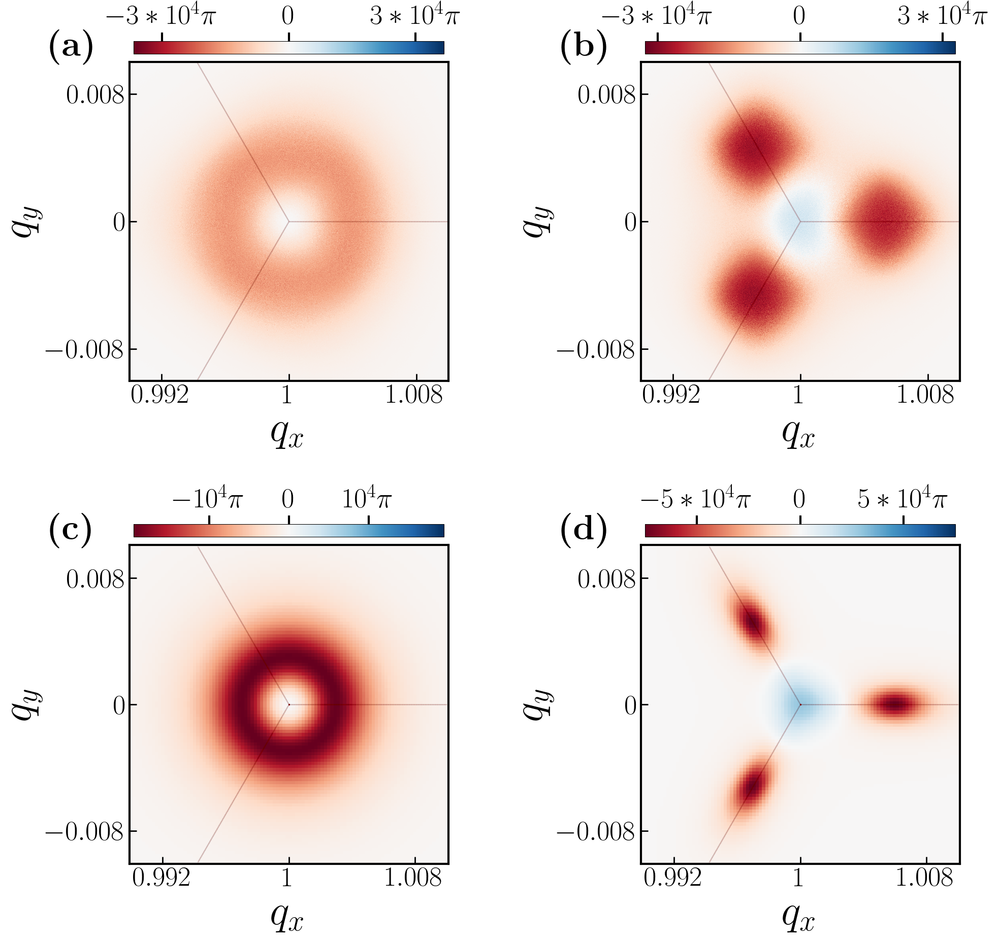

In [24]:
kappa = 1
shells = 5
gap = 10
n = 22
spacing = 10^(-3)
V = [[-1, 0] [0, -1]]
shift_mag = 0.01 * kappa
n11_berry_paper_fig(shift_mag, kappa, shells, gap, n, V, spacing)

# $n = 11$ QBT and Dirac cone figures

In [25]:
function lambda_epsilon_v3(k, n, kappa, gap, vF)
    return (2/n) * vF * sqrt(1 + abs2(gap)) * kappa * sqrt((norm(k)/kappa)^n + abs2(gap))
end
function lambda_ham_v3!(g1, g2, shell_parts, partitions, part_1s, dict, ham, k, lambda, n, gap, vF, V)
    kappa = norm(g2)/sqrt(3)
    # connect all lower order mBZ's to their nn
    for i in 1:length(partitions)
        part_i = partitions[i]
        idex = dict[part_i]
        for j in 1:7
            part_j = part_1s[j]
            gi = part_i[1] * g1 + part_i[2] * g2
            gj = gi .+ part_j[1] * g1 + part_j[2] * g2
            jdex = dict[part_i .+ part_j]
            if part_j != (0, 0)
                val = 1/2 * lambda_ff(V, lambda, k .+ gi, k .+ gj)
                ham[idex, jdex] = val
                ham[jdex, idex] = conj(val)
            end
        end
    end
    # connect outside ring of mBZ's together
    outer_ring = setdiff(shell_parts, partitions)
    for i in 1:length(outer_ring)
        part_i = outer_ring[i]
        idex = dict[part_i]
        for j in 1:7
            part_j = part_1s[j]
            gi = part_i[1] * g1 + part_i[2] * g2
            gj = gi .+ part_j[1] * g1 + part_j[2] * g2
            if (part_i .+ part_j) in outer_ring && part_j != (0, 0)
                jdex = dict[part_i .+ part_j]
                val = 1/2 * lambda_ff(V, lambda, k .+ gi, k .+ gj)
                ham[idex, jdex] = val
                ham[jdex, idex] = conj(val)
            end
        end
    end
    # add in kinetic terms
    for i in 1:length(shell_parts)
        part = shell_parts[i]
        idex = dict[part]
        gi = part[1] * g1 + part[2] * g2
        ham[idex, idex] = lambda_epsilon_v3(gi .+ k, n, kappa, gap, vF)
    end
    return ham
end
function lambda_mBZ_bc_v3!(g1, g2, num_vertices, plaq_area, shell_parts, partitions, part_1s, dict, ham, spinors, grounds, k, lambda, n, gap, vF, kappa, V, shells, index, spacing)
    for j in 1:num_vertices
        x_new = k[1] + spacing * cos(2 * pi * (j - 1) / num_vertices)
        y_new = k[2] + spacing * sin(2 * pi * (j - 1) / num_vertices)
        ham = lambda_ham_v3!(g1, g2, shell_parts, partitions, part_1s, dict, ham, [x_new, y_new], lambda, n, gap, vF, V)
        grounds[j, :] = gauge_fix(normalize(eigvecs(Hermitian(ham))[:, index]))
        for m in 1:length(shell_parts)
            momentum = g1 * shell_parts[m][1] + g2 * shell_parts[m][2] + [x_new, y_new]
            spinors[j, m, :] = lambda_spinor(lambda, momentum)
        end
    end
    P = 1
    for j in 1:num_vertices
        if j < num_vertices
            temp = spinor_inner(grounds[j, :], grounds[j + 1, :], spinors[j, :, :], spinors[j + 1, :, :])
            P *= temp / abs(temp)
        else
            temp = spinor_inner(grounds[j, :], grounds[1, :], spinors[j, :, :], spinors[1, :, :])
            P *= temp / abs(temp)
        end
    end
    if abs(imag(P)) < 10^(-16)
        return -(angle(real(P))) / plaq_area
    else
        return -angle(P) / plaq_area
    end
end
function grid_bc_v3(grid, lambda, n, gap, vF, kappa, V, shells, index, spacing)
    num_vertices = 4

    mBZ_count = num_mBZ(shells)
    shell_parts = sgn_parts(shells)
    partitions = sgn_parts(shells - 1)
    part_1s = sgn_parts(1)
    dict = part_dict(shells)

    ham = zeros(ComplexF64, mBZ_count, mBZ_count)
    spinors = Array{ComplexF64}(undef, num_vertices, mBZ_count, 2)
    grounds = Array{ComplexF64}(undef, num_vertices, mBZ_count)
    plaq_area = area(spacing * sqrt(2), num_vertices)

    g1 = kappa * sqrt(3) * [-sqrt(3)/2, 1/2]
    g2 = kappa * sqrt(3) * [0, 1]

    gi = zeros(2)
    gj = zeros(2)

    berry_list = Array{Float64}(undef, size(grid, 1))

    for i in 1:size(grid, 1)
        berry_list[i] = lambda_mBZ_bc_v3!(g1, g2, num_vertices, plaq_area, shell_parts, partitions, part_1s, dict, ham, spinors, grounds, 
        grid[i, :], lambda, n, gap, vF, kappa, V, shells, index, spacing)
    end
    return berry_list
end
function lambda_ham_v3(k, lambda, n, gap, vF, kappa, V, shells)
    mBZ_count = num_mBZ(shells)
    ham = zeros(ComplexF64, mBZ_count, mBZ_count)
    shell_parts = sgn_parts(shells)
    partitions = sgn_parts(shells - 1)
    part_1s = sgn_parts(1)
    dict = part_dict(shells)
    g1 = kappa * sqrt(3) * [-sqrt(3)/2, 1/2]
    g2 = kappa * sqrt(3) * [0, 1]
    lambda_ham_v3!(g1, g2, shell_parts, partitions, part_1s, dict, ham, k, lambda, n, gap, vF, V)
end
function n11_bands_paper_fig(n, gap, kappa, V, shells, ky, llm, ulm)
    n_pts = 10^3
    kx_list = range(llm, ulm, n_pts)
    
    ion()
    fig, axs = plt.subplots(1, 2,figsize=(20, 10), constrained_layout=false)
    fig.align_ylabels(axs[:, :])
    fig.align_xlabels(axs[:, :])

    for j in 1:2
        axs[j].set_ylabel(L"$\mathrm{Energy}$", fontsize = 70)
        axs[j].set_xlabel(L"$q_x$", fontsize = 70)
        axs[j].tick_params(axis="both", which="major", direction="in", length=12, width=3) 
    end

    for p in 1:2
        if p == 1
            lambda = 0.9998924
            vF = 0.7475
        else
            lambda = 0.9998924 + 0.00008
            vF = 0.7475 - 0.07
        end
        energies = Array{Float64}(undef, n_pts, 3)

        for j in 1:(n_pts)
            k = [kx_list[j], ky]
            ham = lambda_ham_v3(k, lambda, n, gap, vF, kappa, V, shells)
            vals = eigvals(Hermitian(ham))
            energies[j, 1] = vals[1]
            energies[j, 2] = vals[2]
            energies[j, 3] = vals[3]
        end
        axs[p].plot(kx_list, energies[:, 1], label = L"\epsilon_-", lw=3)
        axs[p].plot(kx_list, energies[:, 2], label = L"\epsilon_0", lw=3)
        xticks = [0.96, 1, 1.04]
        xlabels = [L"$\kappa_1 - \delta$", L"$\kappa_1$", L"$\kappa_1 + \delta$"]
        axs[p].set_xticks(xticks, labels=xlabels, fontsize = 60)
        axs[p].set_yticks([])
    end

    for j in 1:2
        axs[j].margins(x=0.02, y=0.05)
        axs[j].set_box_aspect(1)
        for spine in axs[j].spines.values()
            spine.set_linewidth(3)
        end
    end
    
    fig.text(-0.15, 1, L"$\textbf{(a)}$", transform=axs[1].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.15, 1, L"$\textbf{(b)}$", transform=axs[2].transAxes, ha="left", va="top", fontsize=50, color="k")

    fig.tight_layout()

    fig.savefig("figs/n11_bands.png", bbox_inches="tight")
    fig
end

n11_bands_paper_fig (generic function with 1 method)

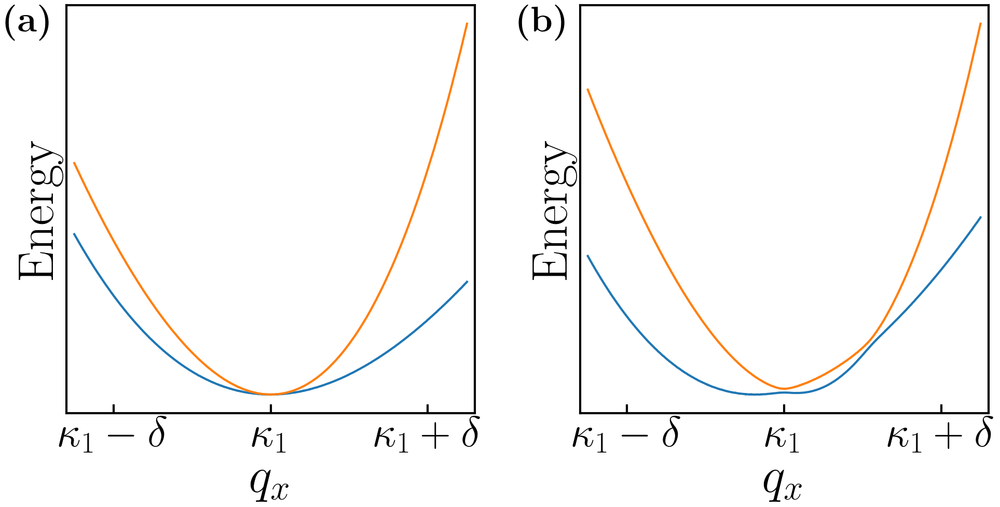

In [26]:
n = 22
gap = 10
kappa = 1
V = [[-1, 0] [0, -1]]
shells = 5
ky = 0
llm = 0.95
ulm = 1.05
n11_bands_paper_fig(n, gap, kappa, V, shells, ky, llm, ulm)

# $C_2$ symmetry indicator figure

In [29]:
function bc_save_data_n_disp(lambda, n, vF, gap, kappa, V, shells, index, spacing, n_pts, grid, filename)
    bc_list = grid_bc_v3(grid, lambda, n, gap, vF, kappa, V, shells, index, spacing)
    grid_new = reshape(grid, (n_pts, n_pts, 2))
    bc_list_new = reshape(bc_list, (n_pts, n_pts))

    data = Dict("grid" => grid_new, "berry" => bc_list_new, "lambda" => lambda, "n" => n, "vF" => vF, "gap" => gap, "kappa" => kappa, 
    "V" => V, "shells" => shells, "index" => index, "spacing" => spacing)

    @save filename data
end
function gen_file_name(lambda, n, vF, gap, kappa, V, shells, index, spacing)
    v1 = V[1, 1]
    v2 = V[2, 2]
    return "/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/notebooks/lambda_jellium/figure_folder/n_disp_data/data_($lambda, $n, $vF, $v1, $v2).jld2"
end
function bc_data_gen(lambda, n, vF, gap, kappa, V, shells, index, spacing, scale, n_pts)
    k_list = scale * range(-kappa, kappa, n_pts)
    grid = mesh_grid(k_list, k_list, Float64)

    filename = gen_file_name(lambda, n, vF, gap, kappa, V, shells, index, spacing)

    bc_save_data_n_disp(lambda, n, vF, gap, kappa, V, shells, index, spacing, n_pts, grid, filename)
end
function batch_bc_data_gen(lambda_list, n_list, vF_list, gap, kappa, V, shells, index, spacing, scale, n_pts)
    for i in 1:length(lambda_list)
        lambda = lambda_list[i]
        for j in 1:length(n_list)
            n = n_list[j]
            for k in 1:length(vF_list)
                vF = vF_list[k]
                bc_data_gen(lambda, n, vF, gap, kappa, V, shells, index, spacing, scale, n_pts)
            end
        end
    end
end
function bc_load_data(lambda, n, vF, gap, kappa, V, shells, index, spacing)
    filename = gen_file_name(lambda, n, vF, gap, kappa, V, shells, index, spacing)
    
    data = JLD2.load(filename)["data"]

    return data
end
function batch_bc_load_data(lambda_list, n_list, vF_list, gap, kappa, V, shells, index, spacing)
    data_set = []
    for i in 1:length(lambda_list)
        lambda = lambda_list[i]
        for j in 1:length(n_list)
            n = n_list[j]
            for k in 1:length(vF_list)
                vF = vF_list[k]
                data = bc_load_data(lambda, n, vF, gap, kappa, V, shells, index, spacing)
                push!(data_set, data)
            end
        end
    end
    return data_set
end
function C2_berry_paper_fig(shift_mag, kappa, shells, gap, n, V, spacing)
    ion()
    fig, axs = plt.subplots(2, 2,figsize=(20, 10), constrained_layout=false, gridspec_kw=Dict("height_ratios" => [0.04, 1.0], 
    "hspace" => 0.05, "width_ratios" => [1.0, 1.0], "wspace" => 0.3))
    fig.align_ylabels(axs[2, :])
    fig.align_xlabels(axs[2, :])

    for j in 1:2
        axs[2, j].set_ylabel(L"$q_y$", fontsize = 60)
        axs[2, j].set_xlabel(L"$q_x$", fontsize = 60)
        axs[2, j].tick_params(axis="both", which="major", direction="in", length=12, width=3) 
        axs[2, j].set_aspect("equal", adjustable="datalim")
    end
    # Set the colorbar stuff
    pos = axs[2, 1].get_position()
    new_width = 0.8 * pos.width
    new_x0 = pos.x0 + 0.5 * (pos.width - new_width)
    axs[1, 1].set_position([new_x0, axs[1, 1].get_position().y0, new_width, axs[1, 1].get_position().height])

    pos = axs[2, 2].get_position()
    new_width = 0.8 * pos.width
    new_x0 = pos.x0 + 0.5 * (pos.width - new_width)
    axs[1, 2].set_position([new_x0, axs[1, 2].get_position().y0, new_width, axs[1, 2].get_position().height])



    lambda1 = 1.1
    lambda2 = 1.5
    vF = 1.5

    # make hexagons
    points_x = []
    points_y = []

    k_llm = -1.5
    k_ulm = 1.5

    hex0 = hex_outline([0, 0], kappa, 10^(-5))
    for j in 1:length(hex0[:, 1])
        if k_llm <= hex0[j, 1] && hex0[j, 1] <= k_ulm
            if k_llm <= hex0[j, 2] && hex0[j, 2] <= k_ulm
                append!(points_x, hex0[j, 1])
                append!(points_y, hex0[j, 2])
            end
        end
    end

    for i in 1:6
        x0 = cos(pi/6 + pi/3 * i)
        y0 = sin(pi/6 + pi/3 * i)
        hex = hex_outline([0, 0] + sqrt(3) * kappa * [x0, y0], kappa, 10^(-5))
        for j in 1:length(hex[:, 1])
            if k_llm <= hex[j, 1] && hex[j, 1] <= k_ulm
                if k_llm <= hex[j, 2] && hex[j, 2] <= k_ulm
                    append!(points_x, hex[j, 1])
                    append!(points_y, hex[j, 2])
                end
            end
        end
    end

    index = 1

    data1 = bc_load_data(lambda1, n, vF, gap, kappa, V, shells, 1, spacing)
    grid1 = data1["grid"]
    bc_list1 = data1["berry"] / (pi)
    bc_abs1 = maximum(abs.([maximum(bc_list1), minimum(bc_list1)]))

    data2 = bc_load_data(lambda2, n, vF, gap, kappa, V, shells, 1, spacing)
    grid2 = data2["grid"]
    bc_list2 = data2["berry"] / (pi)
    bc_abs2 = maximum(abs.([maximum(bc_list2), minimum(bc_list2)]))
    

    berry1 = axs[2, 1].pcolormesh(grid1[:, :, 1], grid1[:, :, 2], bc_list1, cmap="RdBu", vmin = -bc_abs1, vmax = bc_abs1)
    cbar1 = fig.colorbar(berry1, cax=axs[1, 1], orientation="horizontal", location = "top", pad=0.05, use_gridspec=true)
    cbar1.ax.tick_params(length=12, width=3, which="major", direction = "out")
    cbar1.set_ticks([-20, 0, 20])
    cbar1.set_ticklabels([L"$-20 \pi$", L"$0$", L"$20 \pi$"], fontsize=40)

    berry2 = axs[2, 2].pcolormesh(grid1[:, :, 1], grid1[:, :, 2], bc_list2, cmap="RdBu", vmin = -bc_abs2, vmax = bc_abs2)
    cbar2 = fig.colorbar(berry2, cax=axs[1, 2], orientation="horizontal", location = "top", pad=0.05, use_gridspec=true)
    cbar2.ax.tick_params(length=12, width=3, which="major", direction = "out")
    cbar2.set_ticks([-5, 0, 5])
    cbar2.set_ticklabels([L"$-5 \pi$", L"$0$", L"$5 \pi$"], fontsize=40)
    

    x_ticks = [-1, 0, 1]
    x_labels = [L"$-1$", L"$0$", L"$1$"]
    axs[2, 1].set_xticks(x_ticks, labels=x_labels, fontsize=40)
    axs[2, 2].set_xticks(x_ticks, labels=x_labels, fontsize=40)

    y_ticks = [-1, 0, 1]
    y_labels = [L"$-1$", L"$0$", L"$1$"]
    axs[2, 1].set_yticks(y_ticks, labels=y_labels, fontsize=40)
    axs[2, 2].set_yticks(y_ticks, labels=y_labels, fontsize=40)

    # plot hexagons
    alph = 0.0025
    s = 0.3
    c = "maroon"
    linestyle = "-"
    marker = "o"
    axs[2, 1].scatter(points_x, points_y, s = s, alpha=alph, c=c, linestyle=linestyle, marker=marker)
    axs[2, 2].scatter(points_x, points_y, s = s, alpha=alph, c=c, linestyle=linestyle, marker=marker)
        
    axs[1, 1].margins(0)
    axs[1, 2].margins(0)
    
    axs[2, 1].margins(x=0.02, y=0.05)
    axs[2, 2].margins(x=0.02, y=0.05)

    axs[2, 1].set_box_aspect(1)
    axs[2, 2].set_box_aspect(1)

    for spine in axs[2, 1].spines.values()
        spine.set_linewidth(3)
    end
    for spine in axs[2, 2].spines.values()
        spine.set_linewidth(3)
    end
    
    fig.text(-0.18, 1 + 0.1, L"$\textbf{(a)}$", transform=axs[2, 1].transAxes, ha="left", va="top", fontsize=50, color="k")
    fig.text(-0.18, 1 + 0.1, L"$\textbf{(b)}$", transform=axs[2, 2].transAxes, ha="left", va="top", fontsize=50, color="k")

    fig.tight_layout()

    fig.savefig("figs/C2_berry.png", bbox_inches="tight")
    fig
end

C2_berry_paper_fig (generic function with 1 method)

sys:1: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


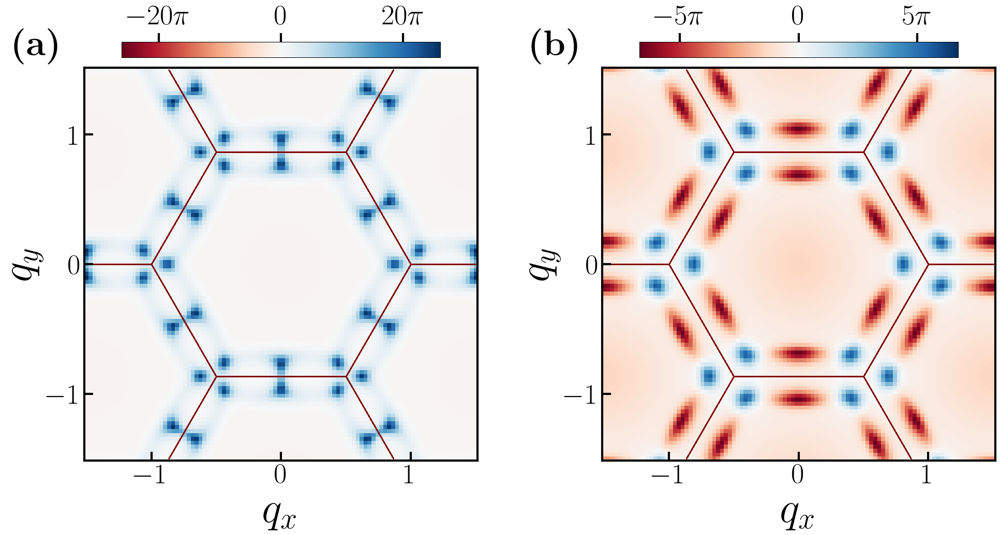

In [30]:
kappa = 1
shells = 5
gap = 10
n = 22
spacing = 10^(-3)
V = [[-1, 0] [0, -1]]
shift_mag = kappa
C2_berry_paper_fig(shift_mag, kappa, shells, gap, n, V, spacing)